# Load Functions

In [1]:
library(Signac)
library(Seurat)
library(glue)
library(EnsDb.Mmusculus.v79)
library(ggsci)
library(ComplexHeatmap)
base_dir='./placeholder_project/code/'
CodePath = glue('{base_dir}/ATAC_pipeline_zyr/Code/')
source(file.path(CodePath,'Function/PipelineFuncHtml.R'))
source(file.path(CodePath,'Function/LoadsingleSample.func.R'))
source(file.path(CodePath,'Function/MotifAnalysis.func.R'))
source(file.path(CodePath,'Function/Signac.Heatmap.R'))
source(file.path(CodePath,'Function/ClusterAndTypeing.func.R'))
source(file.path(CodePath,'Function/cCREsStatistics.func.R'))
source(file.path(CodePath,'Function/Signac.Heatmap.R'))
source(file.path(CodePath,'Function/MergeSampleObj.R'))
source(file.path(CodePath,'Function/PredictCellType.R'))

setwd('./placeholder_project/code/')
source('./placeholder_project/code/jupyter_R/myFun.R')
source('./placeholder_project/code/jupyter_R/markerlist.R')
# Load required libraries
library(ggtree)
library(ape)
library(dplyr)
library(igraph)
library(forcats)
library(ggnewscale)
library(dplyr)
expanded_colors <- c(
  "#D7191C", "#E6804D", "#FF6F61", "#F18A99", "#E6AB02",
  "#D95F02", "#FFB347", "#E4A8A3", "#EBEBEB", "#FADFC3",
  "#A6CD48", "#A0D6F7", "#94D3B6", "#FDAE61", "#FEE08B",
  "#A6D96A", "#1F78B4", "#7570B3", "#A6761D", "#D73027",
  "#ABDDA4", "#2B83BA", "#F46D43", "#D8B365", "#BDBDBD",
  "#A6BD8B", "#C9948B", "#D6616B", "#7B9E23", "#B69DAE",
  "#73C2A3", "#969696", "#6A9AC4", "#B97CAA", "#7AAE3C",
  "#D5B8E5", "#4DBBD5FF", "#E64B35FF", "#00A087FF", "#A65628",
  "#FF95A8FF", "#BCBD22FF", "#FDBF6F", "#3C5488FF", "#F39B7FFF",
  "#B09C85FF", "#7876B1FF", "#377EB8", "#4DAF4A", "#97A1A7FF",
  "#984EA3", "#FF7F00", "#F781BF", "#B2DF8A", "#5050FFFF",
  "#82581FFF", "#E5614CFF", "#F0E685FF", "#D595A7FF", "#CDDEB7FF",
  "#612A79FF", "#AE1F63FF", "#1B1919FF", "#99CC00FF", "#CC9900FF",
  "#9467BDFF", "#EFD500FF", "#ADE2D0FF", "#CE3D32FF", "#749B58FF",
  "#466983FF", "#BA6338FF", "#5DB1DDFF", "#802268FF", "#6BD76BFF",
  "#924822FF", "#837B8DFF", "#C75127FF", "#D58F5CFF", "#7A65A5FF",
  "#E4AF69FF", "#3B1B53FF", "#E7C76FFF", "#5A655EFF", "#33CC00FF",
  "#00CC33FF", "#00CC99FF", "#0099CCFF", "#0A47FFFF", "#4775FFFF",
  "#FFC20AFF", "#FFD147FF", "#990033FF", "#991A00FF", "#996600FF",
  "#809900FF", "#339900FF", "#00991AFF", "#009966FF", "#008099FF",
  "#003399FF", "#1A0099FF", "#660099FF", "#990080FF", "#D60047FF",
  "#FF1463FF", "#00D68FFF",
  # 50 new colors
  "#C22E29", "#F68712", "#FCD34D", "#16A34A", "#10B981",
  "#0EA5E9", "#6366F1", "#8B5CF6", "#EC4899", "#F43F5E",
  "#FF9F43", "#FFDA77", "#A3E635", "#4ADE80", "#2DD4BF",
  "#38BDF8", "#818CF8", "#A78BFA", "#E879F9", "#F87171",
  "#EF4444", "#FB923C", "#FACC15", "#84CC16", "#22D3EE",
  "#60A5FA", "#818CF8", "#C084FC", "#F472B6", "#FB7185",
  "#DC2626", "#EA580C", "#FBBF24", "#4D7C0F", "#064E3B",
  "#0F766E", "#075985", "#4338CA", "#6D28D9", "#DB2777",
  "#9D174D", "#7C2D12", "#78350F", "#365314", "#14532D",
  "#164E63", "#1E3A8A", "#312E81", "#581C87", "#701A75"
)
expanded_colors2 = c("#4dbbd5ff" ,"#E64b35ff", "#00a087ff" ,"#a65628", "#FF95A8FF","#BCBD22FF", "#fdbf6f", "#3c5488ff",
                   "#f39b7fff", "#b09c85ff", "#7876b1ff", "#377eb8",  "#4daf4a","#97A1A7FF" ,
                   "#984ea3" , "#ff7f00",  "#f781bf", "#b2df8a", "#5050FFFF", "#82581FFF" , "#E5614CFF",
                   "#F0E685FF", "#D595A7FF", "#CDDEB7FF","#612A79FF" ,"#AE1F63FF","#1B1919FF",
                   "#99CC00FF","#CC9900FF" ,"#9467BDFF", "#EFD500FF" , "#ADE2D0FF",pal_igv()(50))
distribution_func<-function(meta, group_col, group_row, color=NULL, position='fill'){
  if(is.null(color)){
    color = c("#4dbbd5ff" ,"#E64b35ff", "#00a087ff" ,"#a65628", "#FF95A8FF","#BCBD22FF", "#fdbf6f", "#3c5488ff",
                       "#f39b7fff", "#b09c85ff", "#7876b1ff", "#377eb8",  "#4daf4a","#97A1A7FF" ,
                       "#984ea3" , "#ff7f00",  "#f781bf", "#b2df8a", "#5050FFFF", "#82581FFF" , "#E5614CFF",
                       "#F0E685FF", "#D595A7FF", "#CDDEB7FF","#612A79FF" ,"#AE1F63FF","#1B1919FF",
                       "#99CC00FF","#CC9900FF" ,"#9467BDFF", "#EFD500FF" , "#ADE2D0FF",pal_igv()(50))
  }
  a=meta %>%
    #dplyr::filter(sample_id!='0726_P1') %>%
    ggplot(aes_string(x=group_col))+
    geom_bar(aes_string(fill=group_row), stat='count', position = position)+
    scale_fill_manual(values = color)+
    theme_bw()+
    labs(y='Cells')+
    theme(panel.grid = element_blank(),
          axis.title.x = element_blank(),
          axis.text.x = element_text(angle=60,hjust = 1,vjust=1))
  return(a)
}

distribution_ht_func<-function(meta, group_col, group_row, scale='none', show='count', size=6){
  orig_df = as.data.frame.matrix(table(meta[,group_row], meta[,group_col]))
  if(scale=='row'){
    df = orig_df / rowSums(orig_df)
  }else if(scale=='column'){
    df = t(t(orig_df) / colSums(orig_df))
  }else{
    df=orig_df
  }
  if(show=='count'){
    display_num=orig_df
  }else{
    display_num = round(df,2)
  }
  pheatmap::pheatmap(df, 
                     display_numbers = display_num,
                     border_color = 'white',
                     number_color = 'black',
                     fontsize = size,
                     color = grDevices::colorRampPalette(c('#2C7BB6','#ABD9E9','#FFFFFF','#FDAE61','#D7191C'))(100),
                     cluster_cols = F,cluster_rows = F)
}
distribution_Roe_func <- function(obj, group_by1, group_by2, show.sign=FALSE, 
                                  angle_col=45,order=NULL,obj_is_meta=FALSE,size=6){
  if(!obj_is_meta){
    metadata = obj@meta.data
  }else{
    metadata = obj
  }
  #metadata = obj@meta.data
  # Roe for each cluster
  observe_data1 = metadata %>% 
    dplyr::group_by_(group_by1, group_by2) %>% 
    dplyr::summarise(cell_num=n())
  colnames(observe_data1) = c('group_by1', 'group_by2', 'cell_num')
  
  observe_data1 = observe_data1 %>% tidyr::spread(key =group_by1, value = cell_num, fill=0) %>% as.data.frame()
  
  rownames(observe_data1) = observe_data1[,1]
  observe_data1 = observe_data1[, 2:ncol(observe_data1)]
  observe_data2 = rowSums(observe_data1) - observe_data1
  
  expected_data = observe_data1
  pvalue = c()
  for(i in 1:ncol(observe_data1)){
    chisq_table = matrix(c(observe_data1[,i], observe_data2[,i]), nrow = 2, byrow = TRUE)
    chisq_res = chisq.test(chisq_table)
    expected_data[, i] = chisq_res$expected[1,]
    pvalue = c(pvalue, chisq_res$p.value)
  }
  Reo = observe_data1 / expected_data
  ####
  # plot
  
  if(show.sign=='signif'){
    annote.heatmap = t(Reo)
    annote.heatmap[annote.heatmap>1] = '+++'
    annote.heatmap[annote.heatmap<=1&annote.heatmap>0.8] = '++'
    annote.heatmap[annote.heatmap<=0.8&annote.heatmap>=0.2] = '+'
    annote.heatmap[annote.heatmap<0.2&annote.heatmap>0] = '+/-'
    annote.heatmap[annote.heatmap==0] = '-'
  }else if(show.sign=='value'){
    annote.heatmap = round(t(Reo),2)
  }else{
    annote.heatmap = t(Reo)
    annote.heatmap[annote.heatmap<Inf] = '' 
  }
  bk <- c(seq(0,0.99,by=0.01),seq(1.01,2,by=0.01))
  if(is.null(order)){
    order = colnames(Reo)
  }
  annote.heatmap = annote.heatmap[order,]
  pheatmap::pheatmap(t(Reo[,order]), 
                     cluster_rows = FALSE,
                     cluster_cols = FALSE,
                     treeheight_row = 0,
                     #color = grDevices::colorRampPalette(c(0,0.5,1,1.5,2),
                     #                                    c('#2C7BB6','#ABD9E9','#FFFFFF','#FDAE61','#D7191C'))(100),
                     color = c(colorRampPalette(c('#2C7BB6','#ABD9E9','#FFFFFF'))(length(bk)/2),
                               colorRampPalette(c('#FFFFFF','#FDAE61','#D7191C'))(length(bk)/2)),
                     breaks = bk,
                     display_numbers = annote.heatmap,
                     #cellwidth = 36, cellheight = 16, 
                     border_color = 'white',
                     number_color = 'black',
                     fontsize = size,
                     #border_color = '#ffffff',
                     angle_col=angle_col,
                     main = 'Cluster Dist (Roe)'
  )
  
  res = list('Reo'= t(Reo), 'pvalue'=pvalue, 'annote'=annote.heatmap)
  return(res)
}


method_names = c(
  "tenX","tenXarc","sci-ATAC","sciMAP-ATAC", "snATAC","dscATAC","s3ATAC","txciATAC",   
  "sciATAC3","SPATAC","scifi", "HD-ATAC",
  "AS240726", "AS240606", "AS240806", "AS240823", "AS240815", "AS241017", "AS240903", "AS241018", "AS240905", "AS240722",
  "AS241009", "AS240617", "AS240425", "AS240828", "AS240819", "AS240821", "AS241022", "AS240906", "AS240731", "AS240709"
)
method_color = c(
  "#1C6E8C", # Deep blue-green, muted cool tone
  "#4A7B33", # Deep olive green, low saturation
  "#A06723", # Deep brown-orange, muted warm tone
  "#5C3B8C", # Deep purple, reduced brightness
  "#357D74", # Dark teal, soft cool tone
  "#8C7B00", # Deep golden, darker warm tone
  "#5A2A2A", # Deep reddish brown, avoids conflict with the first color
  "#3D7FF0", # Dark cyan-green, lower saturation
  "#274B9F", # Deep blue, low brightness
  "#7A3D5C", # Deep pink, soft yet distinctive
  "#505050",  # Dark gray, used as a neutral color
  "#FF0000", # Bright red, used as the most prominent color
  "#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000",
  "#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000"
)
names(method_color) = method_names

celltype_round1_color = c('Immune'='#D7191C',
                 'Epithelium'='#1F78B4',
                 'Endothelium'='#FEE08B',
                 'Stroma'='#A6761D')

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Loading required package: ensembldb

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, saveRDS, setdiff,
    table, tapply, union, unique, unsplit, which.max, which.min


Loading required package: GenomicRanges

Loading required package: stats4

Loading

In [2]:
pt_to_mm <- function(pt) {
  pt /2.13
}
label_size <-function(x){
    x/2.8453
}
mytheme =     theme_void()+
      theme(panel.border = element_rect(linewidth=pt_to_mm(0.25),fill=NA),
            plot.title = element_text(hjust = 0.5,face = "plain", size=8, margin = margin(t = 0, r = 0, b = 2, l = 0, unit = "pt")),

            axis.title = element_text(size=7),
            axis.title.y= element_text(angle = 90,hjust=0.5, margin = margin(t = 0, r = 2, b = 0, l = 0, unit = "pt")),
            axis.title.x= element_text(margin = margin(t = 2, r = 0, b = 0, l = 0, unit = "pt")),

            axis.text = element_text(size=6),
            axis.text.x = element_text(margin = margin(t = 1, r = 0, b = 0, l = 0, unit = "pt")),
            axis.text.y = element_text(margin = margin(t = 0, r = 1, b = 0, l = 0, unit = "pt")),

            axis.ticks = element_line(size = pt_to_mm(0.2)),
            axis.ticks.length =  unit(1, 'pt'),
            
            legend.spacing = unit(2, 'pt'),
            legend.key.width = unit(3, "mm"),  # Legend color bar width
            legend.key.height = unit(3, "mm"),    # Legend color bar height
            legend.key.spacing = unit(2, 'pt'),
            
            legend.text = element_text(size=6),
            legend.title = element_text(size=6,face = "plain"),
            legend.margin = margin(0, 0, 0, 0)
            )

In [3]:
load_peak<-function(name){
    # Load differential peak matrix
    mat <- Matrix::readMM(glue("{base_path}/{name}_aggr_sparse.mtx"))
    row_names <- read.csv(glue("{base_path}/{name}_aggr_sparse_index.csv"), header = T)[,1]
    col_names <- read.csv(glue("{base_path}/{name}_aggr_sparse_columns.csv"), header = T)[,1]
    row_names = gsub(':','-',row_names)
    rownames(mat) <- row_names
    colnames(mat) <- col_names
    return(mat)
}

In [4]:
output_dir='./placeholder_output/raw_figure_output/Figure2/'

# Load cCRE

In [5]:
base_path='./placeholder_analysis/round_cluster02/cCRE/'


In [ ]:

merge.peaks = read.csv(glue('{base_path}/all_merge_peaks.csv'), check.names = F)
merge.peaks

In [116]:
# CRE proportion of genome
total_cCRE_gr = StringToGRanges(merge.peaks[,'Peaks'], sep = c(':','-'))

In [8]:
total_cCRE_gr

GRanges object with 713987 ranges and 0 metadata columns:
           seqnames            ranges strand
              <Rle>         <IRanges>  <Rle>
       [1]     chr1   3012479-3012980      *
       [2]     chr1   3057426-3057927      *
       [3]     chr1   3059441-3059942      *
       [4]     chr1   3094833-3095334      *
       [5]     chr1   3100134-3100635      *
       ...      ...               ...    ...
  [713983]     chrY   6959081-6959582      *
  [713984]     chrY   9646473-9646974      *
  [713985]     chrY 10059220-10059721      *
  [713986]     chrY 10508477-10508978      *
  [713987]     chrY 10626122-10626623      *
  -------
  seqinfo: 21 sequences from an unspecified genome; no seqlengths

In [19]:
seqlevels(total_cCRE_gr)

[1] "chr1"  "chr2"  "chr3"  "chr4"  "chr5"  "chr6"  "chr7"  "chr8"  "chr9" 
[10] "chr10" "chr11" "chr12" "chr13" "chr14" "chr15" "chr16" "chr17" "chr18"
[19] "chr19" "chrX"  "chrY"

In [53]:
#total_length <- sum(width(reduce(total_cCRE_gr)))

#total_length
sum(width(total_cCRE_gr))
sum(width(total_cCRE_gr))/2652783500

[1] 358421474

[1] 0.1351115

In [67]:
library(EnsDb.Mmusculus.v79)
annotation <- GetGRangesFromEnsDb(ensdb = EnsDb.Mmusculus.v79)

In [69]:
seqlengths(annotation)

3         X        16         7        11         6        13         4 
160039680 171031299  98207768 145441459 122082543 149736546 120421639 156508116 
        9         Y        17         5         2        14        10         8 
124595110  91744698  94987271 151834684 182113224 124902244 130694993 129401213 
       15        18         1        12        19        MT 
104043685  90702639 195471971 120129022  61431566     16299

In [71]:
sum(seqlengths(annotation)) - 16299

[1] 2725521370

In [74]:
bl = fread('./placeholder_project/genome_annotation_file/mm10-blacklist.v2.bed.gz')

In [79]:
sum(bl$V3-bl$V2)

[1] 238977200

In [80]:
sum(width(total_cCRE_gr)) / (2725521370-238977200)

[1] 0.1441444

## Annotate encode

In [52]:
rDHSs_ref = readBED(file = './placeholder_project/code//ATAC_pipeline_zyr/sourceData/cCREs_Ref/mm10-cCREs.bed',
                    header = F)

total_cCRE_gr = StringToGRanges(merge.peaks[,'Peaks'], sep = c(':','-'))


In [152]:
hits = findOverlaps(total_cCRE_gr,rDHSs_ref)

In [156]:
rDHSs_ann = data.frame('ref'=rDHSs_ref$V6[subjectHits(hits)],
                      'cre' = GRangesToString(total_cCRE_gr)[queryHits(hits)])

In [158]:
rDHSs_ann = rDHSs_ann %>% unique()

In [167]:
rDHSs_ann_mat = reshape2::acast(rDHSs_ann, cre~ref)
rDHSs_ann_mat[!is.na(rDHSs_ann_mat)] = 1
rDHSs_ann_mat[is.na(rDHSs_ann_mat)] = 0

Using cre as value column: use value.var to override.



In [169]:
head(rDHSs_ann_mat)

,"CTCF-only,CTCF-bound",dELS,"dELS,CTCF-bound",DNase-H3K4me3,"DNase-H3K4me3,CTCF-bound",pELS,"pELS,CTCF-bound",PLS,"PLS,CTCF-bound"
chr1-10007170-10007671,1,0,0,0,0,0,0,0,0
chr1-10008922-10009423,0,1,0,0,0,0,0,0,0
chr1-100231849-100232350,1,0,0,0,0,0,0,0,0
chr1-10037669-10038170,0,0,0,0,0,0,1,1,1
chr1-10038188-10038689,0,0,0,0,0,1,0,1,0
chr1-10038972-10039473,0,0,0,0,0,0,1,0,0


In [170]:
write.csv(rDHSs_ann_mat,glue('{base_path}/encode_peak_ann.csv'))

In [150]:
inter_Peaks = subsetByOverlaps(total_cCRE_gr,rDHSs_ref)

inter_Peaks_str = GRangesToString(inter_Peaks,sep = c(':','-'))

In [154]:
length(inter_Peaks_str)

[1] 228833

In [151]:
merge.peaks[,'is_in_encode'] = 0
merge.peaks[merge.peaks[,'Peaks']%in%inter_Peaks_str,'is_in_encode'] = 1

In [9]:
sum(merge.peaks[,'is_in_encode'])

[1] 228833

## Annotate based on genomic distance

In [10]:
region.dis = c(3000,3000)
annotations <- GetGRangesFromEnsDb(ensdb = EnsDb.Mmusculus.v79)
seqlevels(annotations) <- paste0('chr', seqlevels(annotations))
tss <- resize(x = annotations, width = 1, fix = 'start')
Tss.group = c('promoter','proximal','distal')

genes.region_1 <- suppressWarnings(expr = Extend(x = tss, upstream = region.dis[1], downstream = region.dis[1] ))
genes.region_2 <- suppressWarnings(expr = Extend(x = tss, upstream = region.dis[2], downstream = region.dis[2]))
promoter_Peaks = subsetByOverlaps(total_cCRE_gr,genes.region_1)
proximal_Peaks = subsetByOverlaps(total_cCRE_gr,genes.region_2)
#distal_Peaks = GenomicRanges::setdiff(total_cCRE_gr,proximal_Peaks)
#proximal_Peaks = GenomicRanges::setdiff(proximal_Peaks,promoter_Peaks)

promoter_Peaks_str = GRangesToString(promoter_Peaks,sep = c(':','-'))
proximal_Peaks_str = GRangesToString(proximal_Peaks,sep = c(':','-'))
#distal_Peaks_str = GRangesToString(distal_Peaks,sep = c(':','-'))

merge.peaks[,'ann_manual'] = 'distal'
# merge.peaks[merge.peaks[,'Peaks']%in%distal_Peaks_str,'ann_manual'] = 'distal'
merge.peaks[merge.peaks[,'Peaks']%in%proximal_Peaks_str,'ann_manual'] = 'proximal'
merge.peaks[merge.peaks[,'Peaks']%in%promoter_Peaks_str,'ann_manual'] = 'promoter'

## based onChipSeekerannotation

In [11]:
# ChipSeeker
library(ChIPseeker)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
txdb <- TxDb.Mmusculus.UCSC.mm10.knownGene
annoDb = "org.Mm.eg.db"

peakAnno <- annotatePeak(total_cCRE_gr, TxDb=txdb,annoDb = annoDb)
peakAnno

ChIPseeker v1.40.0

If you use ChIPseeker in published research, please cite:
Qianwen Wang, Ming Li, Tianzhi Wu, Li Zhan, Lin Li, Meijun Chen, Wenqin Xie, Zijing Xie, Erqiang Hu, Shuangbin Xu, Guangchuang Yu. Exploring epigenomic datasets by ChIPseeker. Current Protocols 2022, 2(10): e585


:'ChIPseeker'


The following object is masked from 'package:plyr':

    .




>> preparing features information...		 2025-06-24 173110 
>> identifying nearest features...		 2025-06-24 173111 
>> calculating distance from peak to TSS...	 2025-06-24 173122 
>> assigning genomic annotation...		 2025-06-24 173122 
>> adding gene annotation...			 2025-06-24 173150 


:org.Mm.eg.db



'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-06-24 173151 
>> done...					 2025-06-24 173152 


Annotated peaks generated by ChIPseeker
713987/713987  peaks were annotated
Genomic Annotation Summary:
              Feature  Frequency
9    Promoter (<=1kb)  9.9391165
10   Promoter (1-2kb)  4.0680012
11   Promoter (2-3kb)  3.4983830
4              5' UTR  0.2236735
3              3' UTR  2.2556433
1            1st Exon  1.3297161
7          Other Exon  3.8419467
2          1st Intron 14.0695839
8        Other Intron 26.4885775
6  Downstream (<=300)  0.1037834
5   Distal Intergenic 34.1815747

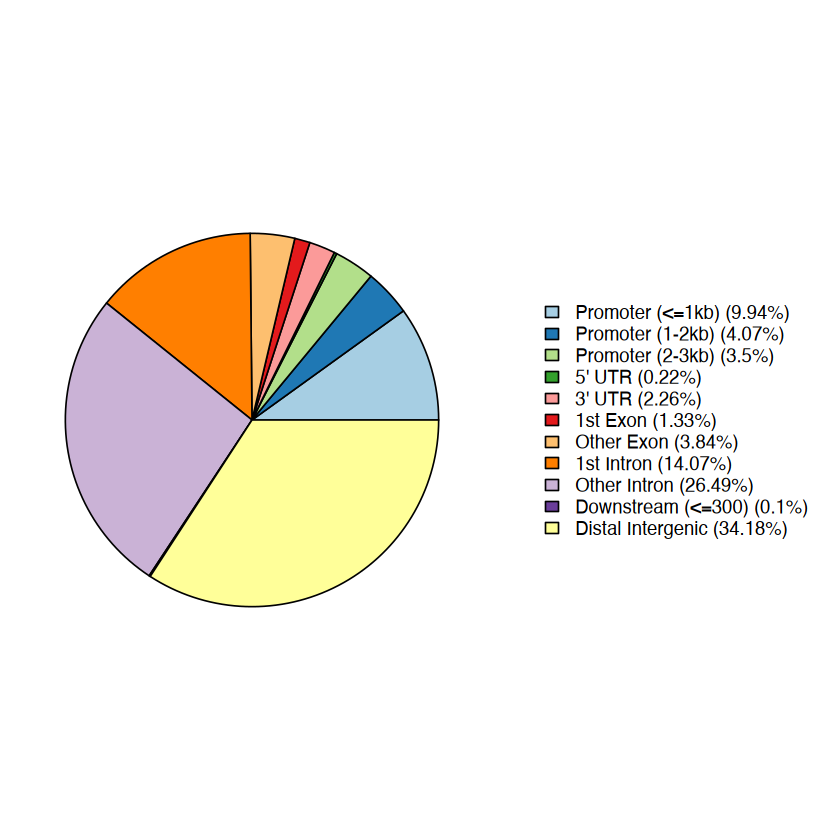

In [12]:
plotAnnoPie(peakAnno)

In [13]:
peakAnno_str = GRangesToString(peakAnno@anno,sep = c(':','-'))
peak_ann_df_ChipSeeker = data.frame('name'=peakAnno_str,'type'=peakAnno@anno$annotation)
rownames(peak_ann_df_ChipSeeker) = peakAnno_str
first_intron=grepl('intron 1 of', peak_ann_df_ChipSeeker$type)
other_intron=grepl('intron', peak_ann_df_ChipSeeker$type) & (!first_intron)
first_exon=grepl('exon 1 of', peak_ann_df_ChipSeeker$type)
other_exon=grepl('exon', peak_ann_df_ChipSeeker$type) & (!first_exon)
Downstream = grepl('Downstream', peak_ann_df_ChipSeeker$type)
peak_ann_df_ChipSeeker[first_intron, 'type'] = 'Intron'
peak_ann_df_ChipSeeker[other_intron, 'type'] = 'Intron'
peak_ann_df_ChipSeeker[first_exon, 'type'] = 'Exon'
peak_ann_df_ChipSeeker[other_exon, 'type'] = 'Exon'
peak_ann_df_ChipSeeker[Downstream, 'type'] = 'Downstream'

In [16]:
merge.peaks[,'ann_ChipSeeker'] = peak_ann_df_ChipSeeker[merge.peaks[,'Peaks'], 'type']

## Homoerannotation

In [21]:
tmp_gr = StringToGRanges(merge.peaks$Peaks, sep=c(':','-'))

rtracklayer::export.bed(tmp_gr,glue('{base_path}/all_CRE.bed'))

In [23]:
glue('{base_path}/all_CRE.bed')

./placeholder_root/mouse_lung_project/pycode/round_cluster02/cCRE//all_CRE.bed

In [ ]:
#export PATH=./placeholder_project/code/Homer/bin/:$PATH

# annotatePeaks.pl \
#     ./placeholder_analysis/round_cluster02/cCRE//all_CRE.bed \
#     mm10 > \
#     -annStats ./placeholder_analysis/round_cluster02/cCRE//all_CRE_homer_annStats.txt  \
#     ./placeholder_analysis/round_cluster02/cCRE//all_CRE_homer_ann.txt 

In [157]:
annotation_categories <- c(
    "RNA",
      # "miRNA",
      # "ncRNA",
      # "srpRNA",
      # "tRNA",
      # "snoRNA",
      # "scRNA",
      # "snRNA",
      # "rRNA",
    "Exon",
  "Intron",
  "Intergenic",
  "Promoter",

  "TTS",
  "LINE",
  #"LINE\\?",

  "SINE",
   # "SINE\\?",
  "RC",
  #"RC\\?",
  "DNA",
  #"DNA\\?",
  "pseudo",
  "CpG",
  "Low_complexity",
  "LTR",
   #"LTR\\?",
  "Simple_repeat",

  "Unknown",
  
  "Satellite",

      "5\\' UTR",
   "3\\' UTR",
      "Other"
)


In [33]:
homer_ann = read.delim('./placeholder_analysis/round_cluster02/cCRE//all_CRE_homer_ann.txt',
                       sep='\t',header=T, fill=TRUE)

In [53]:
head(homer_ann)

,PeakID..cmd.annotatePeaks.pl..Volumes.wangxin.mouse_lung_project.pycode.round_cluster02.cCRE..all_CRE.bed.mm10.,Chr,Start,End,Strand,Peak.Score,Focus.Ratio.Region.Size,Annotation,Detailed.Annotation,Distance.to.TSS,Nearest.PromoterID,Entrez.ID,Nearest.Unigene,Nearest.Refseq,Nearest.Ensembl,Gene.Name,Gene.Alias,Gene.Description,Gene.Type
,<chr>,<chr>,<int>,<int>,<chr>,<int>,<lgl>,<chr>,<chr>,<int>,<chr>,<int>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1-439932,chr3,105773734,105774235,+,0,NA,"intron (NM_145541, intron 1 of 7)",MLT2C1|LTR|ERVL,27397,NM_145541,109905,NA,NM_145541,ENSMUSG00000068798,Rap1a,G-22K|Krev-1|Rap1,RAS-related protein 1a,protein-coding
2,1-488818,chr4,136041757,136042258,+,0,NA,Intergenic,Intergenic,11386,NM_025919,67025,NA,NM_025919,ENSMUSG00000059291,Rpl11,2010203J19Rik,ribosomal protein L11,protein-coding
3,1-471507,chr4,83294941,83295442,+,0,NA,"intron (NM_027238, intron 2 of 19)",ORR1G|LTR|ERVL-MaLR,28998,NM_027238,69863,NA,NM_025782,ENSMUSG00000038172,Ttc39b,1810054D07Rik|9130422G05Rik,tetratricopeptide repeat domain 39B,protein-coding
4,1-22631,chr1,90312025,90312526,+,0,NA,Intergenic,Intergenic,108295,NM_007722,12778,NA,NM_007722,ENSMUSG00000044337,Ackr3,CXC-R7|CXCR-7|Cmkor1|Cxcr7|RDC-1|Rdc1,atypical chemokine receptor 3,protein-coding
5,1-677017,chr9,68879194,68879695,+,0,NA,"intron (NM_013646, intron 1 of 10)","intron (NM_013646, intron 1 of 10)",114098,NR_033299,320440,NA,NM_177159,,9530091C08Rik,-,RIKEN cDNA 9530091C08 gene,ncRNA
6,1-101082,chr11,44917035,44917536,+,0,NA,"intron (NM_001362569, intron 9 of 15)","intron (NM_001362569, intron 9 of 15)",199643,NR_045100,100504255,NA,NR_045100,ENSMUSG00000084773,Gm12159,-,predicted gene 12159,ncRNA


In [41]:
tmp_homer = sapply(homer_ann$Annotation, function(x)strsplit(x,'\\(')[[1]][1])

In [134]:
homer_ann[grepl("RNA", homer_ann$Detailed.Annotation, ignore.case = TRUE),][1:3,]

,PeakID..cmd.annotatePeaks.pl..Volumes.wangxin.mouse_lung_project.pycode.round_cluster02.cCRE..all_CRE.bed.mm10.,Chr,Start,End,Strand,Peak.Score,Focus.Ratio.Region.Size,Annotation,Detailed.Annotation,Distance.to.TSS,Nearest.PromoterID,Entrez.ID,Nearest.Unigene,Nearest.Refseq,Nearest.Ensembl,Gene.Name,Gene.Alias,Gene.Description,Gene.Type
,<chr>,<chr>,<int>,<int>,<chr>,<int>,<lgl>,<chr>,<chr>,<int>,<chr>,<int>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
222,1-195419,chr13,103396037,103396538,+,0,NA,Intergenic,5S|rRNA|rRNA,-61795,NM_175171,328329,NA,NM_175171,ENSMUSG00000034751,Mast4,4930420O11Rik|mKIAA0303,microtubule associated serine/threonine kinase family member 4,protein-coding
959,1-314893,chr17,91264876,91265377,+,0,NA,Intergenic,LFSINE_Vert|SINE|tRNA,-172324,NM_177284,18189,NA,NM_020252,ENSMUSG00000024109,Nrxn1,1700062G21Rik|9330127H16Rik|A230068P09Rik|mKIAA0578,neurexin I,protein-coding
1013,1-214924,chr14,57345127,57345628,+,0,NA,"intron (NM_030004, intron 3 of 7)",BC1_Mm|scRNA|scRNA,53106,NM_030004,68631,NA,NM_030004,ENSMUSG00000021947,Cryl1,1110025H08Rik|A230106J09Rik|gul3dh,"crystallin, lambda 1",protein-coding


In [164]:
tmp_homer_detail = homer_ann$Detailed.Annotation
for(i in annotation_categories){
    if(i=='RC'){
        tmp_pos = grepl(i, homer_ann$Detailed.Annotation, ignore.case = FALSE)
    }else{
        tmp_pos = grepl(i, homer_ann$Detailed.Annotation, ignore.case = TRUE)
    }
    
    tmp_homer_detail[tmp_pos] = i
}

tmp_homer_detail[tmp_homer_detail=='RNA'] = 'Other'
tmp_homer_detail[tmp_homer_detail=='Unknown'] = 'Other'
tmp_homer_detail[tmp_homer_detail=='RC'] = 'Other'
tmp_homer_detail[tmp_homer_detail=="3\\' UTR"] = "3' UTR"
tmp_homer_detail[tmp_homer_detail=="5\\' UTR"] = "5' UTR"

In [165]:
table(tmp_homer_detail)

tmp_homer_detail
        3' UTR         5' UTR            CpG            DNA           Exon 
          8817           1710           4100           8813          18049 
    Intergenic         Intron           LINE Low_complexity            LTR 
        200361         259767          42277           2157          68406 
         Other       Promoter      Satellite  Simple_repeat           SINE 
          2848          27151            568          10411          48020 
           TTS 
         10532 

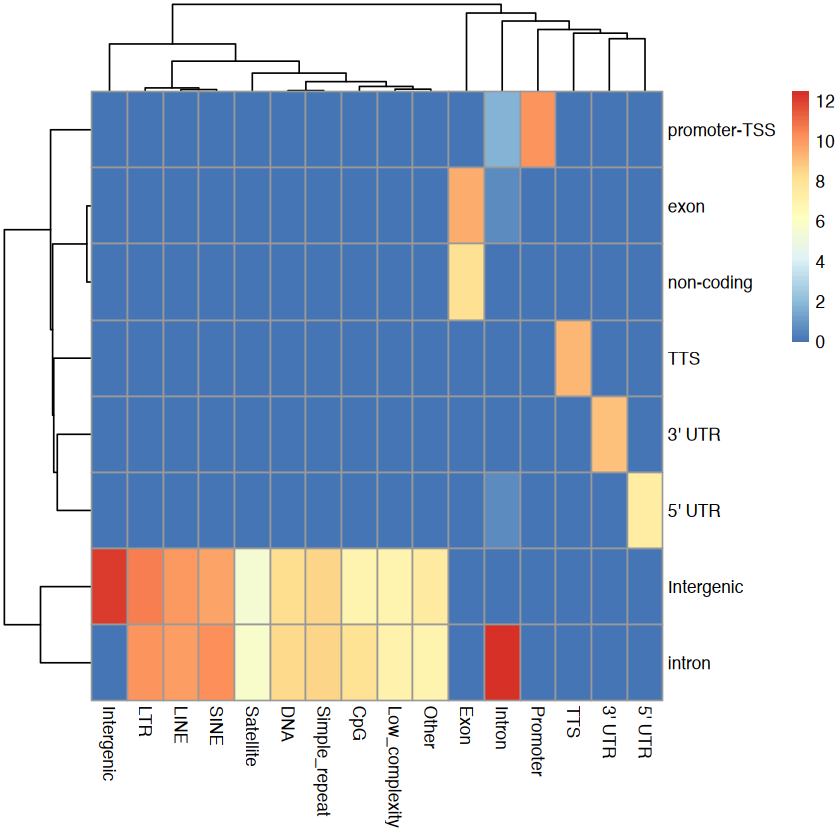

In [166]:
pheatmap::pheatmap(log1p(table(tmp_homer,tmp_homer_detail)))

In [169]:
tmp_homer2 = tmp_homer
tmp_homer2[tmp_homer2=='Intergenic'] = tmp_homer_detail[tmp_homer2=='Intergenic']
tmp_homer2[tmp_homer2=='Intron'] = tmp_homer_detail[tmp_homer2=='Intron']

names(tmp_homer2) = paste0(homer_ann$Chr,':', homer_ann$Start,'-',homer_ann$End)

In [172]:
merge.peaks[,'ann_HOMER'] = tmp_homer2[merge.peaks[,'Peaks']]

## based onchromHMMannotation

In [40]:
hmmstat_dir='./placeholder_project/code/ChromHMM/hmm_renbing/'

hmm_gr = c()
j = 1
for(i in list.files(hmmstat_dir)){
    tmp_stat = data.table::fread(glue('{hmmstat_dir}/{i}'))
    colnames(tmp_stat) = c('chromosome', 'start', 'end', 'state_num', 'state_label')
    tmp_stat$Stage = strsplit(i, '_')[[1]][1]
    tmp_stat$Tissue = strsplit(i, '_')[[1]][2]
    tmp_stat = makeGRangesFromDataFrame(tmp_stat, keep.extra.columns = T)
    if(j==1){
      hmm_gr = tmp_stat
    }else{
      hmm_gr = c(hmm_gr,tmp_stat)
    }
    j = j+1
}
hmm_gr

In [42]:
hmm_gr

GRanges object with 21327701 ranges and 4 metadata columns:
             seqnames            ranges strand |   state_num state_label
                <Rle>         <IRanges>  <Rle> | <character> <character>
         [1]    chr10         0-3100800      * |         U15          NS
         [2]    chr10   3100800-3111400      * |         U14        Hc-H
         [3]    chr10   3111400-3116400      * |         U15          NS
         [4]    chr10   3116400-3131400      * |         U14        Hc-H
         [5]    chr10   3131400-3137400      * |         U15          NS
         ...      ...               ...    ... .         ...         ...
  [21327697]     chrY 90731000-90733200      * |         U14        Hc-H
  [21327698]     chrY 90733200-90737200      * |         U11        Tr-P
  [21327699]     chrY 90737200-90739800      * |         U10        Tr-S
  [21327700]     chrY 90739800-90745000      * |         U14        Hc-H
  [21327701]     chrY 90745000-91744600      * |         U15    

In [177]:
inter_Peaks = findOverlaps(total_cCRE_gr,hmm_gr)

tmp_peak = GRangesToString(total_cCRE_gr, sep = c(':','-'))[queryHits(inter_Peaks)]


In [178]:
rownames(merge.peaks) = merge.peaks$Peaks
merge.peaks

,,Peaks,EC_gCap_Tubb2b:P12,AT2:P2,Stroma_Airway_Fibroblast:P0,EC_gCap_Tubb2b:P3,Airway_Cilitated_Muc16:P13,MatureB_(Cd5+)Ccl22,Stroma_SMC_vascular_Actc1:P14,Stroma_SMC_vascular_Mall:P3,⋯,Stroma_Adventitial_Fibroblast:P5,Stroma_SMC_vascular_Actc1,Myeloid_Macorphage_Spp1:P14,AT1_Nek10:P6,Monocytes_Classical:P9,EC_gCap_Itpr2:P13,is_in_encode,ann_manual,ann_ChipSeeker,ann_HOMER
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
chr1:3012479-3012980,0,chr1:3012479-3012980,False,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,1,distal,Distal Intergenic,Intergenic
chr1:3057426-3057927,1,chr1:3057426-3057927,False,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LTR
chr1:3059441-3059942,2,chr1:3059441-3059942,False,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LTR
chr1:3094833-3095334,3,chr1:3094833-3095334,False,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3100134-3100635,4,chr1:3100134-3100635,False,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3119836-3120337,5,chr1:3119836-3120337,False,False,True,False,False,False,True,True,⋯,True,True,False,False,False,False,1,distal,Distal Intergenic,Intergenic
chr1:3121246-3121747,6,chr1:3121246-3121747,False,False,False,False,False,False,False,False,⋯,False,True,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3125980-3126481,7,chr1:3125980-3126481,False,False,False,False,False,False,False,False,⋯,True,False,False,False,False,False,0,distal,Distal Intergenic,LINE
chr1:3131997-3132498,8,chr1:3131997-3132498,False,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LINE


In [179]:
hmm_ann = data.frame('cre'=tmp_peak, 
                     'hmm_state'=hmm_gr$state_label[subjectHits(inter_Peaks)],
                     'Stage' = hmm_gr$Stage[subjectHits(inter_Peaks)],
                     'Tissue' = hmm_gr$Tissue[subjectHits(inter_Peaks)],
                     'isin_encode'=merge.peaks[tmp_peak, 'is_in_encode']
                    )


In [1167]:
dim(hmm_ann)
head(hmm_ann)

[1] 54802718        6

,idx,cre,hmm_state,Stage,Tissue,isin_encode
,<int>,<chr>,<chr>,<chr>,<chr>,<int>
1,1,chr1:3012479-3012980,NS,e11.5,facial-prominence,1
2,2,chr1:3012479-3012980,NS,e11.5,forebrain,1
3,3,chr1:3012479-3012980,NS,e11.5,heart,1
4,4,chr1:3012479-3012980,NS,e11.5,hindbrain,1
5,5,chr1:3012479-3012980,NS,e11.5,limb,1
6,6,chr1:3012479-3012980,NS,e11.5,liver,1


In [181]:
write.csv(hmm_ann,glue('{base_path}/all_merge_peaks_HMMann.csv'))

# save annotatedCRE

In [182]:
write.csv(merge.peaks,glue('{base_path}/all_merge_peaks_ann.csv'))

In [13]:
base_path='./placeholder_analysis/round_cluster02/cCRE/'
merge.peaks = read.csv(glue('{base_path}/all_merge_peaks_ann.csv'), check.names = F)
merge.peaks

,.1,Peaks,EC_gCap_Tubb2b:P12,AT2:P2,Stroma_Airway_Fibroblast:P0,EC_gCap_Tubb2b:P3,Airway_Cilitated_Muc16:P13,MatureB_(Cd5+)Ccl22,Stroma_SMC_vascular_Actc1:P14,⋯,Stroma_Adventitial_Fibroblast:P5,Stroma_SMC_vascular_Actc1,Myeloid_Macorphage_Spp1:P14,AT1_Nek10:P6,Monocytes_Classical:P9,EC_gCap_Itpr2:P13,is_in_encode,ann_manual,ann_ChipSeeker,ann_HOMER
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>
chr1:3012479-3012980,0,chr1:3012479-3012980,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,1,distal,Distal Intergenic,Intergenic
chr1:3057426-3057927,1,chr1:3057426-3057927,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LTR
chr1:3059441-3059942,2,chr1:3059441-3059942,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LTR
chr1:3094833-3095334,3,chr1:3094833-3095334,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3100134-3100635,4,chr1:3100134-3100635,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3119836-3120337,5,chr1:3119836-3120337,False,False,True,False,False,False,True,⋯,True,True,False,False,False,False,1,distal,Distal Intergenic,Intergenic
chr1:3121246-3121747,6,chr1:3121246-3121747,False,False,False,False,False,False,False,⋯,False,True,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3125980-3126481,7,chr1:3125980-3126481,False,False,False,False,False,False,False,⋯,True,False,False,False,False,False,0,distal,Distal Intergenic,LINE
chr1:3131997-3132498,8,chr1:3131997-3132498,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LINE


# CREdistribution

In [10]:
cell_mat = load_peak('all_cell')

cell_mat = as.matrix(cell_mat)

In [59]:
dim(cell_mat)

[1] 713987    129

In [11]:
cell_mat_scale = t(apply(cell_mat, 1, scale))
cell_mat_scale[is.na(cell_mat_scale)]=0
colnames(cell_mat_scale) = colnames(cell_mat)

In [12]:
umap = read.csv(glue('./placeholder_analysis/round_cluster02/merge/cell_meta.csv'))
cell_meta = umap
cell_meta = cell_meta[order(cell_meta[,'Celltype_round1'],
                       cell_meta[,'Celltype_round2'],
                       cell_meta[,'Celltype_round3'],
                       cell_meta[,'Celltype_round4']),]

cell_order = cell_meta$Celltype_round4[!duplicated(cell_meta$Celltype_round4)]

## cre heatmap

In [9]:
ann_data = data.frame(Round1=cell_meta$Celltype_round1[!duplicated(cell_meta$Celltype_round4)],
           Round2=cell_meta$Celltype_round2[!duplicated(cell_meta$Celltype_round4)])
rownames(ann_data) = cell_order

In [17]:
filter_marker = read.csv(glue("{base_path}/all_cell_diff_peaks.csv"))
colnames(filter_marker)[c(1,2,4,5,6)] = c('cluster','gene', 'avg_log2FC', 'p_val','p_val_adj')
filter_marker$gene = gsub(':','-',filter_marker$gene)

top_peaks = filter_marker %>% 
  dplyr::filter(avg_log2FC >=0.1&p_val_adj <=0.05) %>%
  group_by(cluster) %>% 
  top_n(1000,avg_log2FC) %>%
  arrange(cluster, -scores)



In [12]:
## peak_order
top_peaks$cluster = factor(top_peaks$cluster, levels = cell_order)
top_peaks = top_peaks %>% arrange(cluster)
peak_order = top_peaks$gene
left_ann = rowAnnotation(df=ann_data[cell_order,'Round1', drop=F],
                        col=list('Round1'=celltype_round1_color),
                        simple_anno_size=unit(0.1,'cm'))
cell_mat_scale_ht = t(cell_mat_scale[peak_order, cell_order])


In [190]:
ht=Heatmap(cell_mat_scale_ht,
          col=circlize::colorRamp2(c(-1,-0.5,0,2,4),c("#440154", "#3B528B", "#21908C", "#5DC863", "#FDE725")),
          #col=circlize::colorRamp2(c(0,0.1,.2),c("white","#fdae61","#d7191c")),
          cluster_rows = F, cluster_columns = F,
          show_row_names = F, show_column_names = F,
          left_annotation=left_ann,
          use_raster=T,
          border = TRUE,
          border_gp = gpar(col = "black",lwd = 0.2) ,
          column_names_gp = gpar(fontsize=7),
)

pdf(glue('{output_dir}/all_Cell_cCREs_ht.pdf'), width=4, height=6)
draw(ht)
dev.off()

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

In [14]:
# andfigure2same order
tree_cell_order = read.table('./placeholder_output/raw_figure_output/Figure1/129cells_tree_order.txt',
     sep = '\t', header=T)

In [15]:
cell_order2 = rev(tree_cell_order$x)

In [15]:
top_peaks = filter_marker %>% 
  dplyr::filter(avg_log2FC >=0.1&p_val_adj <=0.05) %>%
  group_by(cluster) %>% 
  top_n(1000,avg_log2FC) %>%
  arrange(cluster, -scores)

In [16]:
## peak_order
top_peaks$cluster = factor(top_peaks$cluster, levels = cell_order2)
top_peaks = top_peaks %>% arrange(cluster)
peak_order = top_peaks$gene
left_ann = rowAnnotation(df=ann_data[cell_order2,'Round1', drop=F],
                        col=list('Round1'=celltype_round1_color),
                        simple_anno_size=unit(0.1,'cm'))
cell_mat_scale_ht = t(cell_mat_scale[peak_order, cell_order2])

In [48]:
ht=Heatmap(cell_mat_scale_ht,
          col=circlize::colorRamp2(c(-2,-1,0,1,2),c("#440154", "#3B528B", "#21908C", "#5DC863", "#FDE725")),
          #col=circlize::colorRamp2(c(0,0.1,.2),c("white","#fdae61","#d7191c")),
          cluster_rows = F, cluster_columns = F,
          show_row_names = F, show_column_names = F,
          left_annotation=left_ann,
          use_raster=T,
          border = TRUE,
          border_gp = gpar(col = "black",lwd = 0.2) ,
          column_names_gp = gpar(fontsize=7),
)

pdf(glue('{output_dir}/all_Cell_cCREs_ht2.pdf'), width=4, height=6)
draw(ht)
dev.off()

agg_record_1258560709 
                    2

## CREdistribution at each time point

In [8]:
new_celltype = read.csv('./placeholder_analysis/round_cluster02/merge/celltype_modify.csv')
rownames(new_celltype) = new_celltype$Celltype_round4
new_celltype$modify_name = new_celltype$Celltype_round4_new
new_celltype$new_name = paste0(new_celltype$modify_name,'.', new_celltype$cluster_num)

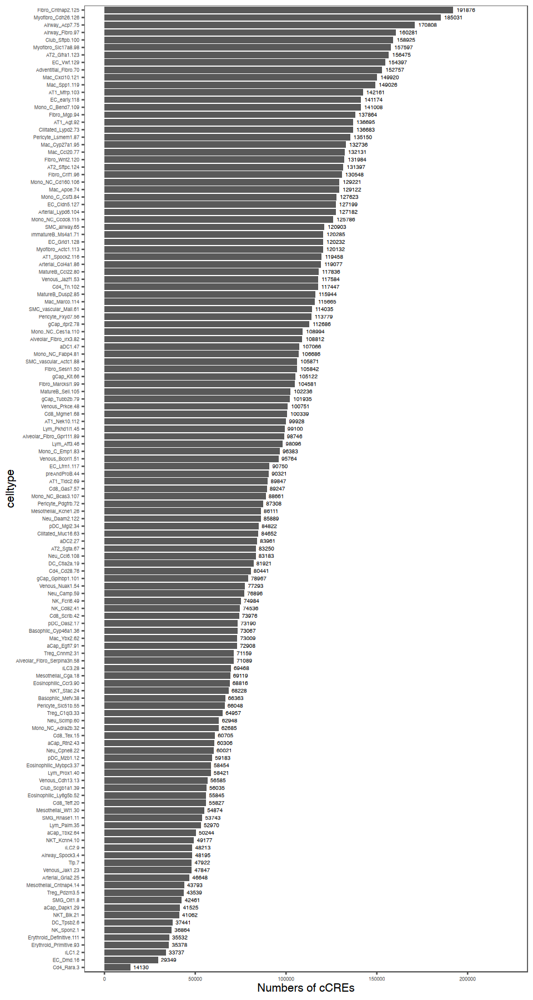

In [16]:
celltype_marker.peaks=merge.peaks[,c('Peaks',cell_order, 'is_in_encode')]

cell_peak_group = c()
for(j in cell_order){
    tmp_peak_overlap = celltype_marker.peaks[celltype_marker.peaks[,j]=='True'&
                                             celltype_marker.peaks[,'is_in_encode']==1,'Peaks']
    tmp_peak_all = celltype_marker.peaks[celltype_marker.peaks[,j]=='True','Peaks']
    tmp_peak_diff = setdiff(tmp_peak_all, tmp_peak_overlap)
    cell_peak_group = rbind(cell_peak_group, data.frame('celltype'=j, 
                                                        'Num'=c(length(tmp_peak_overlap),
                                                                length(tmp_peak_diff)),
                                                       'type'=c('OL', 'NOL')))
}

all_num_df = cell_peak_group %>%
    group_by(celltype) %>%
    dplyr::summarise(all_num=sum(Num)) %>%
    arrange(all_num) %>% as.data.frame()

options(repr.plot.width=8, repr.plot.height=15)

# cell_peak_group$celltype = factor(cell_peak_group$celltype, levels=all_num_df$celltype)
all_num_df$celltype = as.vector(all_num_df$celltype)
celltype_new = new_celltype[all_num_df$celltype, 'new_name']
celltype_new_order = new_celltype[all_num_df$celltype, 'new_name']
# cell_peak_group$celltype = factor(celltype_new,celltype_new_order)
all_num_df$celltype = factor(celltype_new,celltype_new_order)
cre_num_plot=ggplot(all_num_df, aes(x=all_num, y= celltype)) + 
    geom_bar(stat = "identity",color = 'black',width = 0.8, size=0) +
    geom_text(aes(x=all_num, y= celltype,label = all_num,hjust = -0.2), size=2,
              data=all_num_df, inherit.aes = F)+
        scale_fill_manual(values=c("#440154ff", '#21908dff'))+
    xlim(0,max(all_num_df$all_num)+30000)+
    xlab('Numbers of cCREs')+
    theme_few()+
    theme( plot.title = element_text(hjust = 0.5),
         axis.text=element_text(size=5))
cre_num_plot

In [17]:
ggsave(glue('{output_dir}/CREproportion distribution_between cell types.pdf'),cre_num_plot,
       width=80, height=160, units='mm')

In [21]:
head(all_num_df)

,celltype,all_num
,<fct>,<int>
1,Cd4_Rara.3,14130
2,EC_c2.16,29349
3,ILC1.2,33737
4,Erythroid_Primitive.93,35378
5,Erythroid_Definitive.111,35532
6,NK_Spon2.1,36864


In [22]:
celltype_marker.peaks=merge.peaks[,c('Peaks',cell_order2, 'is_in_encode')]

cell_peak_group = c()
for(j in cell_order2){
    tmp_peak_overlap = celltype_marker.peaks[celltype_marker.peaks[,j]=='True'&
                                             celltype_marker.peaks[,'is_in_encode']==1,'Peaks']
    tmp_peak_all = celltype_marker.peaks[celltype_marker.peaks[,j]=='True','Peaks']
    tmp_peak_diff = setdiff(tmp_peak_all, tmp_peak_overlap)
    cell_peak_group = rbind(cell_peak_group, data.frame('celltype'=j, 
                                                        'Num'=c(length(tmp_peak_overlap),
                                                                length(tmp_peak_diff)),
                                                       'type'=c('OL', 'NOL')))
}

all_num_df = cell_peak_group %>%
    group_by(celltype) %>%
    dplyr::summarise(all_num=sum(Num)) %>%
    mutate(celltype=factor(celltype, levels=cell_order2)) %>%
    arrange(celltype) %>%
    as.data.frame()

options(repr.plot.width=8, repr.plot.height=15)
all_num_df$celltype = as.vector(all_num_df$celltype)


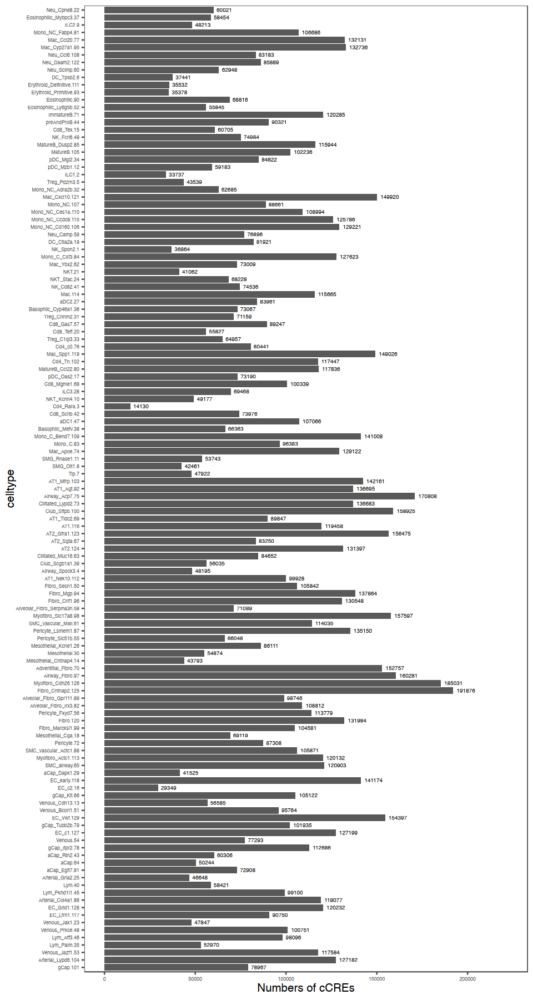

In [23]:

celltype_new = new_celltype[all_num_df$celltype, 'new_name']
celltype_new_order = new_celltype[all_num_df$celltype, 'new_name']
# cell_peak_group$celltype = factor(celltype_new,celltype_new_order)
all_num_df$celltype = factor(celltype_new,celltype_new_order)
cre_num_plot=ggplot(all_num_df, aes(x=all_num, y= celltype)) + 
    geom_bar(stat = "identity",color = 'black',width = 0.8, size=0) +
    geom_text(aes(x=all_num, y= celltype,label = all_num,hjust = -0.2), size=2,
              data=all_num_df, inherit.aes = F)+
        scale_fill_manual(values=c("#440154ff", '#21908dff'))+
    xlim(0,max(all_num_df$all_num)+30000)+
    xlab('Numbers of cCREs')+
    theme_few()+
    theme( plot.title = element_text(hjust = 0.5),
         axis.text=element_text(size=5))
cre_num_plot
ggsave(glue('{output_dir}/CREproportion distribution_between cell types2.pdf'),cre_num_plot,
       width=80, height=160, units='mm')

In [24]:
head(all_num_df)

,celltype,all_num
,<fct>,<int>
1,gCap.101,78967
2,Arterial_Lypd6.104,127182
3,Venous_Jazf1.53,117584
4,Lym_Palm.35,52970
5,Lym_Aff3.46,98096
6,Venous_Prkce.48,100751


In [26]:
round4_color=readRDS('./placeholder_analysis/round_cluster02/merge/round4_color.rds')

In [32]:
right_anno = rowAnnotation(num=anno_barplot(all_num_df$all_num,
                                gp = gpar(fill = unname(round4_color[cell_order2]), color=NA)),
                        simple_anno_size=unit(0.5,'cm'))

In [33]:
ht=Heatmap(cell_mat_scale_ht,
          col=circlize::colorRamp2(c(-2,-1,0,1,2),c("#440154", "#3B528B", "#21908C", "#5DC863", "#FDE725")),
          #col=circlize::colorRamp2(c(0,0.1,.2),c("white","#fdae61","#d7191c")),
          cluster_rows = F, cluster_columns = F,
          show_row_names = F, show_column_names = F,
          left_annotation=left_ann,
          right_annotation=right_anno,
          use_raster=T,
          border = TRUE,
          border_gp = gpar(col = "black",lwd = 0.2) ,
          column_names_gp = gpar(fontsize=7),
)

pdf(glue('{output_dir}/all_Cell_cCREs_ht3.pdf'), width=4, height=6)
draw(ht)
dev.off()

agg_record_530149218 
                   2

In [12]:
celltype_marker.peaks=merge.peaks[,c('Peaks',time_levels, 'is_in_encode')]

cell_peak_group = c()
for(j in time_levels){
    tmp_peak_overlap = celltype_marker.peaks[celltype_marker.peaks[,j]=='True'&
                                             celltype_marker.peaks[,'is_in_encode']==1,'Peaks']
    tmp_peak_all = celltype_marker.peaks[celltype_marker.peaks[,j]=='True','Peaks']
    tmp_peak_diff = setdiff(tmp_peak_all, tmp_peak_overlap)
    cell_peak_group = rbind(cell_peak_group, data.frame('time'=j, 
                                                        'Num'=c(length(tmp_peak_overlap),
                                                                length(tmp_peak_diff)),
                                                       'type'=c('OL', 'NOL')))
}

all_num_df = cell_peak_group %>%
    group_by(time) %>%
    dplyr::summarise(all_num=sum(Num)) %>%
    arrange(all_num) %>% as.data.frame()

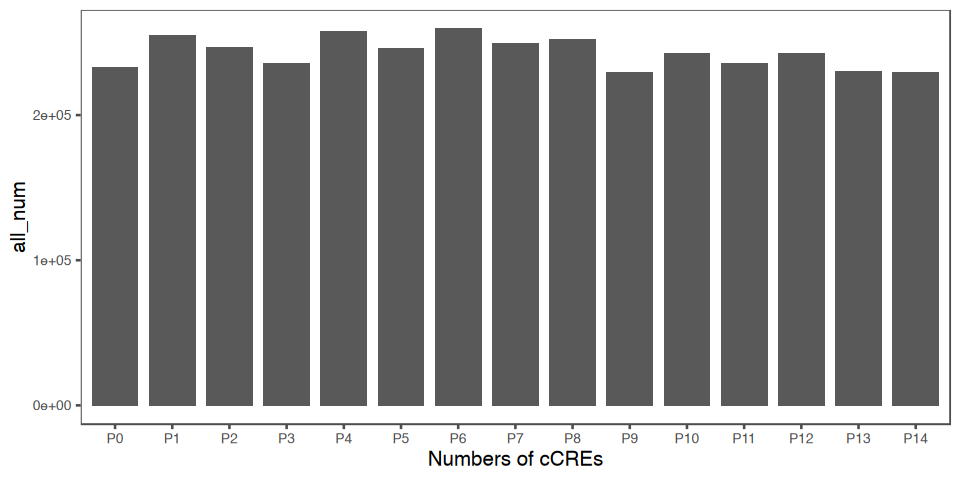

In [219]:
options(repr.plot.width=8, repr.plot.height=4)

all_num_df$time = factor(all_num_df$time, levels=time_levels)

a=ggplot(all_num_df, aes(x=time, y= all_num)) + 
    geom_bar(stat = "identity",color = 'black',width = 0.8, size=0) +
    geom_text(aes(x=time, y= all_num,label = all_num,vjust = -0.5), size=1,
              data=all_num_df, inherit.aes = F)+
        scale_fill_manual(values=c("#440154ff", '#21908dff'))+
    #xlim(0,max(all_num_df$all_num)+30000)+
    xlab('Numbers of cCREs')+
    theme_few()+
    theme( plot.title = element_text(hjust = 0.5),
         axis.text=element_text(size=8))
a

In [220]:
ggsave(glue('{output_dir}/CREproportion distribution_time point.pdf'),a,
       width=120, height=60, units='mm')

## each cell subtypecreaccessibility over time distribution

In [25]:
celltime_cre_counts = read.csv('./placeholder_analysis/round_cluster02/cCRE/celltime_cre_counts.csv')

celltime_cre_counts$Time = sapply(celltime_cre_counts$X, function(x)strsplit(x,':')[[1]][2])
celltime_cre_counts$Celltype = sapply(celltime_cre_counts$X, function(x)strsplit(x,':')[[1]][1])  
                                      

celltime_cre_counts = reshape2::acast(celltime_cre_counts, Celltype~Time, value.var = 'X0', fill=0)

In [26]:
cell_time_name=c()
for(i in unique(umap$Celltype_round4)){
    for(j in time_levels){
        cell_time_name = c(cell_time_name,paste0(i,':',j))
    }
}
cell_time_name = intersect(cell_time_name, colnames(merge.peaks))
cell_time_merge.peaks = merge.peaks[,c(cell_time_name, 'is_in_encode','ann_manual','ann_ChipSeeker', 'ann_HOMER')]

cell_time_merge.peaks_melt = reshape2::melt(cell_time_merge.peaks, 
                                            id=c('is_in_encode','ann_manual','ann_ChipSeeker', 'ann_HOMER'))

In [27]:
cell_time_cCRE_all = cell_time_merge.peaks_melt %>%
    dplyr::filter(value=='True') %>%
    group_by(variable) %>%
    dplyr::summarise(Num=n())
tmp_var = t(sapply(as.vector(cell_time_cCRE_all$variable), function(x)strsplit(x,'\\:')[[1]]))
cell_time_cCRE_all[, c('celltype', 'time')]= tmp_var
#cell_time_cCRE_all_mat = reshape2::acast(cell_time_cCRE_all, celltype~time, value.var = 'Num', fill=0)
      

In [28]:
cell_time_cCRE_all_mat = reshape2::acast(cell_time_cCRE_all,time~celltype, value.var='Num', fill=0)
cell_time_cCRE_all_mat = as.data.frame(cell_time_cCRE_all_mat)
uncall_cell = setdiff(cell_order,colnames(cell_time_cCRE_all_mat))
cell_time_cCRE_all_mat[,uncall_cell] = t(celltime_cre_counts[uncall_cell,rownames(cell_time_cCRE_all_mat)])

In [29]:
colnames(cell_time_cCRE_all_mat) = as.character(new_celltype[colnames(cell_time_cCRE_all_mat), 'new_name'])

In [30]:
compute_swcs_noscale <- function(mat, win_size = 3) {
    #mat = mat/rowSums(mat)
    #print(rowSums(mat))
  T <- ncol(mat)
  
  scores <- apply(mat, 1, function(x) {
    max_diff <- -Inf
    min_diff <- Inf
    
    for (i in 1:(T - win_size + 1)) {
      win_idx <- i:(i + win_size - 1)
      rest_idx <- setdiff(1:T, win_idx)
      
      win_mean <- mean(x[win_idx])
      rest_mean <- mean(x[rest_idx])
      diff <- win_mean - rest_mean
      
      if (diff > max_diff) max_diff <- diff
      if (diff < min_diff) min_diff <- diff
    }
    
    # return more extreme difference(open as positive, closed as negative)
    if (abs(max_diff) > abs(min_diff)) {
      return(max_diff)
    } else {
      return(min_diff)
    }
  })
  
  return(scores)
}


In [40]:
cell_time_cCRE_all_mat_2 = as.data.frame(t(cell_time_cCRE_all_mat)[, time_levels])

In [41]:
scores = c()
for(i in 1:5){
   score = compute_swcs_noscale(log1p(cell_time_cCRE_all_mat_2),
                              win_size=i)
   scores = rbind(scores, score)
}

In [42]:
names(colSums(scores))

[1] "Airway_Acp7.75"              "Cilitated_Lypd2.73"         
  [3] "Cilitated_Muc16.63"          "Club_Sftpb.100"             
  [5] "Alveolar_Fibro_Gpr111.89"    "Alveolar_Fibro_Irx3.82"     
  [7] "Alveolar_Fibro_Serpina3n.58" "AT1.116"                    
  [9] "AT1_Agt.92"                  "AT1_Mfrp.103"               
 [11] "AT1_Nek10.112"               "AT1_Tldc2.69"               
 [13] "AT2.124"                     "AT2_Gfra1.123"              
 [15] "AT2_Sgta.67"                 "Cd4_c0.76"                  
 [17] "Cd4_Tn.102"                  "Cd8_Gas7.57"                
 [19] "Cd8_Mgme1.68"                "Cd8_Scrib.42"               
 [21] "Cd8_Teff.20"                 "aCap.64"                    
 [23] "aCap_Dapk1.29"               "aCap_Egfl7.91"              
 [25] "Arterial_Col4a1.86"          "Arterial_Lypd6.104"         
 [27] "EC_early.118"                "EC_c1.127"                  
 [29] "gCap.101"                    "gCap_Itpr2.78"              
 [31] "gCap_Kit.66"                 "gCap_Tubb2b.79"             
 [33] "EC_Grid1.128"                "EC_Lfrn1.117"               
 [35] "Lym.40"                      "Lym_Aff3.46"                
 [37] "Lym_Pkhd1l1.45"              "Venous.54"                  
 [39] "Venous_Bcorl1.51"            "Venous_Cdh13.13"            
 [41] "Venous_Jazf1.53"             "Venous_Prkce.48"            
 [43] "EC_Vwf.129"                  "EC_c2.16"                   
 [45] "Erythroid_Definitive.111"    "Erythroid_Primitive.93"     
 [47] "Fibro_Crlf1.96"              "Fibro_Mgp.94"               
 [49] "Fibro_Sesn1.50"              "ILC3.28"                    
 [51] "ImmatureB.71"                "MatureB_Ccl22.80"           
 [53] "MatureB_Dusp2.85"            "MatureB.105"                
 [55] "Mono_C.83"                   "Mono_C_Bend7.109"           
 [57] "Mono_C_Csf3.84"              "Mono_NC.107"                
 [59] "Mono_NC_Adra2b.32"           "Mono_NC_Ccdc8.115"          
 [61] "Mono_NC_Cd160.106"           "Mono_NC_Ces1a.110"          
 [63] "Mono_NC_Fabp4.81"            "aDC1.47"                    
 [65] "Basophilc_Cyp46a1.36"        "Basophilc_Mefv.38"          
 [67] "Eosinophilic.90"             "Eosinophilic_Ly6g5b.52"     
 [69] "Eosinophilic_Mybpc3.37"      "Mac.114"                    
 [71] "Mac_Apoe.74"                 "Mac_Ccl20.77"               
 [73] "Mac_Cxcl10.121"              "Mac_Cyp27a1.95"             
 [75] "Mac_Spp1.119"                "Mac_Ybx2.62"                
 [77] "Neu_Camp.59"                 "Neu_Ccl6.108"               
 [79] "Neu_Cpne8.22"                "Neu_Daam2.122"              
 [81] "Neu_Scimp.60"                "pDC_Mgl2.34"                
 [83] "NK_Cd82.41"                  "NK_Fcrl6.49"                
 [85] "preAndProB.44"               "SMG_Oit1.8"                 
 [87] "SMG_Rnase1.11"               "Adventitial_Fibro.70"       
 [89] "Airway_Fibro.97"             "Fibro.120"                  
 [91] "Fibro_Cntnap2.125"           "Fibro_Marcksl1.99"          
 [93] "Mesothelial.30"              "Myofibro_Actc1.113"         
 [95] "Myofibro_Cdh26.126"          "Myofibro_Slc17a8.98"        
 [97] "Pericyte.72"                 "Pericyte_Fxyd7.56"          
 [99] "Pericyte_Lsmem1.87"          "Pericyte_Slc51b.55"         
[101] "SMC_airway.65"               "SMC_vascular_Actc1.88"      
[103] "SMC_vascular_Mall.61"        "Tip.7"                      
[105] "Treg_C1ql3.33"               "aCap_Rtn2.43"               
[107] "Arterial_Gria2.25"           "Venous_Jak1.23"             
[109] "Lym_Palm.35"                 "Club_Scgb1a1.39"            
[111] "Airway_Spock3.4"             "aDC2.27"                    
[113] "DC_Ctla2a.19"                "DC_Tpsb2.6"                 
[115] "pDC_Mzb1.12"                 "pDC_Oas2.17"                
[117] "Cd4_Rara.3"                  "ILC1.2"                     
[119] "ILC2.9"                      "Cd8_Tex.15"                 
[121] "NK_Spon2.1"                  "NKT.2

In [43]:
#score = compute_swcs_score(cell_time_cCRE_all_mat_2[rowSums(cell_time_cCRE_all_mat_2)>0,],win_size=3)
score = colSums(scores)
score_df = as.data.frame(score)
#score_df[as.character(new_celltype[uncall_cell, 'cluster_num']), 'score'] = -4
score_df$celltype = rownames(score_df)

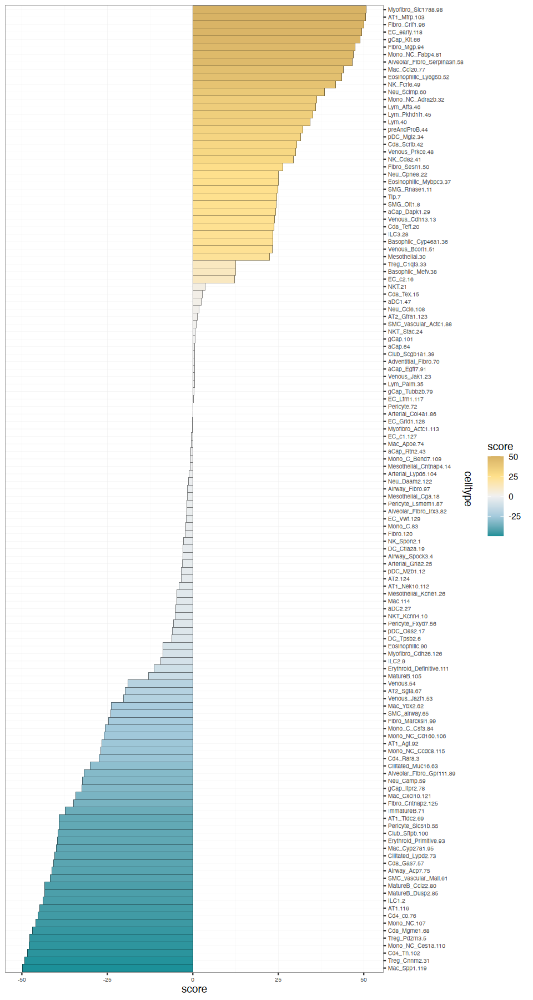

In [260]:
a2 = score_df %>%
    mutate(celltype=fct_reorder(celltype, score)) %>%
    ggplot(aes(x=score, y=celltype, fill=score))+
    geom_bar(stat='identity',width=1, color='black', size=0.1)+
    scale_fill_gradientn(colors = c("#1C9099", "#A6CBDD", "#F0F0F0", "#FEE08B", "#D8B365"))+
    scale_y_discrete(position = 'right')+
        theme_bw()+
    theme(panel.border = element_rect(size=0.1),
         panel.grid=element_line(size=0.1),
         axis.text=element_text(size=6))
a2

In [77]:
cell_time_cCRE_all2 = melt(as.matrix(cell_time_cCRE_all_mat))
colnames(cell_time_cCRE_all2) = c('time', 'celltype', 'Num')
cell_time_cCRE_all2$celltype = as.character(cell_time_cCRE_all2$celltype)

In [32]:
head(t(cell_time_cCRE_all_mat))
saveRDS(cell_time_cCRE_all_mat,
       '../out_data/cell_CREnum_time_mat.rds')

,P0,P1,P10,P11,P12,P13,P14,P2,P3,P4,P5,P6,P7,P8,P9
Airway_Acp7.75,0,68731,83687,71102,0,0,0,68452,46609,97407,67312,71516,97234,68730,44650
Cilitated_Lypd2.73,0,52957,68221,59116,0,0,0,56730,45620,73235,62648,62062,55758,47391,35795
Cilitated_Muc16.63,21732,29971,31999,19756,0,20061,0,28908,20272,28868,29234,26027,30530,23535,17252
Club_Sftpb.100,69715,88431,74410,63995,48970,0,0,105506,77584,86930,49305,80352,80263,61939,48812
Alveolar_Fibro_Gpr111.89,0,17010,43325,39174,29125,43885,19531,0,29167,50446,56490,49844,45933,43494,27258
Alveolar_Fibro_Irx3.82,0,37123,62160,52392,0,45920,0,0,41895,68553,57636,49231,60304,50561,37999


In [6]:
cell_time_cCRE_all_mat = readRDS('../out_data/cell_CREnum_time_mat.rds')

In [7]:
dim(cell_time_cCRE_all_mat)

[1]  15 129

In [67]:
ht=Heatmap(cell_mat_scale_ht,
          col=circlize::colorRamp2(c(-2,-1,0,1,2),c("#440154", "#3B528B", "#21908C", "#5DC863", "#FDE725")),
          #col=circlize::colorRamp2(c(0,0.1,.2),c("white","#fdae61","#d7191c")),
          cluster_rows = F, cluster_columns = F,
          show_row_names = F, show_column_names = F,
          left_annotation=left_ann,
          right_annotation=right_anno,
          use_raster=T,
          border = TRUE,
          border_gp = gpar(col = "black",lwd = 0.2) ,
          column_names_gp = gpar(fontsize=7),
          width = 6
)

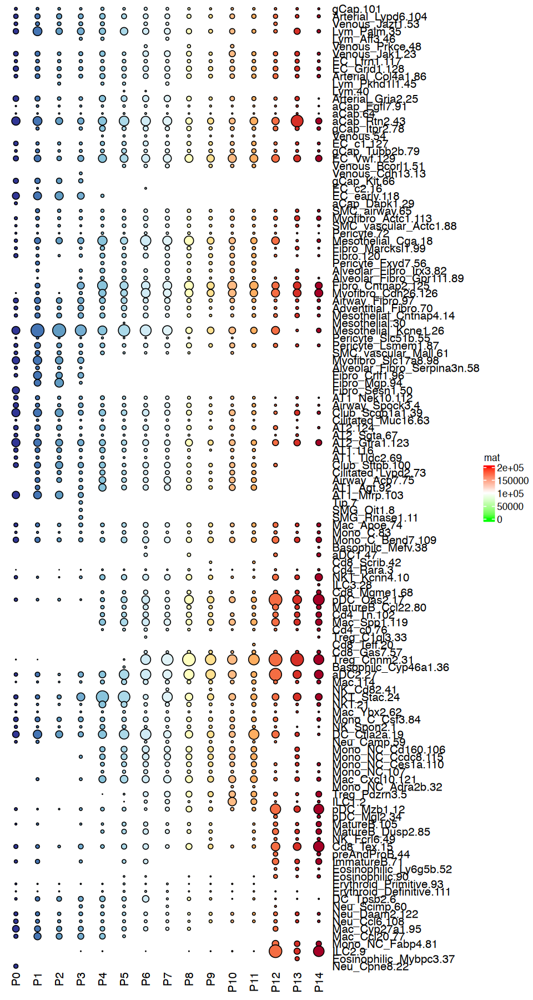

In [74]:
tmp_mat = t(cell_time_cCRE_all_mat)[celltype_new_order, paste0('P',0:14)]#[1:9,1:9]
#col_fun = circlize::colorRamp2(c(0, 100000,200000), c("green", "white", "red"))
h2=Heatmap(tmp_mat, name = "mat", col = col_fun, rect_gp = gpar(type = "none"), 
    cluster_rows = F, cluster_columns = F,
    cell_fun = function(j, i, x, y, width, height, fill) {
        #  grid.rect(x = x, y = y, width = width, height = height, 
        #     gp = gpar(col = "grey", fill = NA))
        grid.circle(x = x, y = y, r = min(tmp_mat[i, j], 200000)/80000 * min(unit.c(width, height)), 
                gp = gpar(fill = time_color2[j], col = 'black'))
    },
    width = 3
)
h2

In [75]:
pdf(glue('{output_dir}/all_Cell_cCREs_ht4.pdf'), width=12, height=12)
draw(ht+h2)
dev.off()

agg_record_2058682971 
                    2

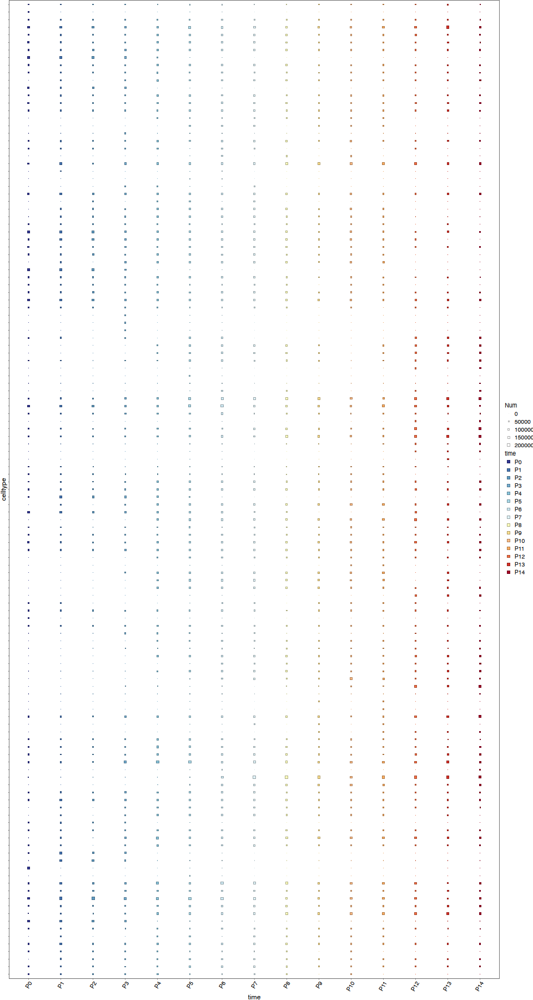

In [200]:
a1 = cell_time_cCRE_all2 %>%
    mutate(time=factor(time, time_levels)) %>%
    mutate(celltype=factor(celltype, new_celltype[rev(cell_order),'new_name'])) %>%
    #mutate(celltype=factor(celltype, levels(a2$data$celltype))) %>%
    ggplot(aes(x=time, y=celltype))+
    geom_point(aes(fill=time, size=Num),shape=22,color='black', stroke=0.1)+
    scale_fill_manual(values = time_color2)+
    scale_size_continuous(range = c(0,1.5))+
    #scale_y_discrete(position = 'right')+
    theme_bw()+

    mytheme+
    theme(#panel.grid=element_line(size=0.1),
         axis.text.x=element_text(angle=60,hjust=1,vjust=1),
         axis.text.y=element_blank()
         )
a1

In [201]:
ggsave(glue('{output_dir}/CREsubtype accessibility over time distribution_main.pdf'),
       a1,
       width=50, height=120, units='mm')

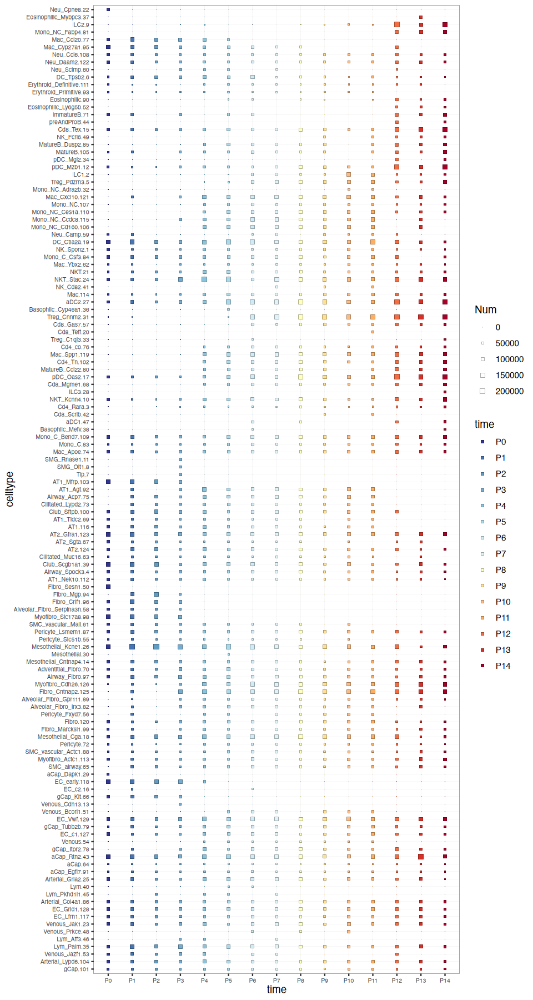

In [78]:
a1 = cell_time_cCRE_all2 %>%
    mutate(time=factor(time, time_levels)) %>%
    mutate(celltype=factor(celltype, celltype_new_order)) %>%
    #mutate(celltype=factor(celltype, levels(a2$data$celltype))) %>%
    ggplot(aes(x=time, y=celltype))+
    geom_point(aes(fill=time, size=Num),shape=22,color='black', stroke=0.1)+
    scale_fill_manual(values = time_color2)+
    scale_size_continuous(range = c(0,3))+
    #scale_y_discrete(position = 'right')+
    theme_bw()+
    theme(panel.border = element_rect(size=0.1),
         panel.grid=element_line(size=0.1),
         axis.text=element_text(size=6),
         #axis.text.y=element_blank()
         )
a1

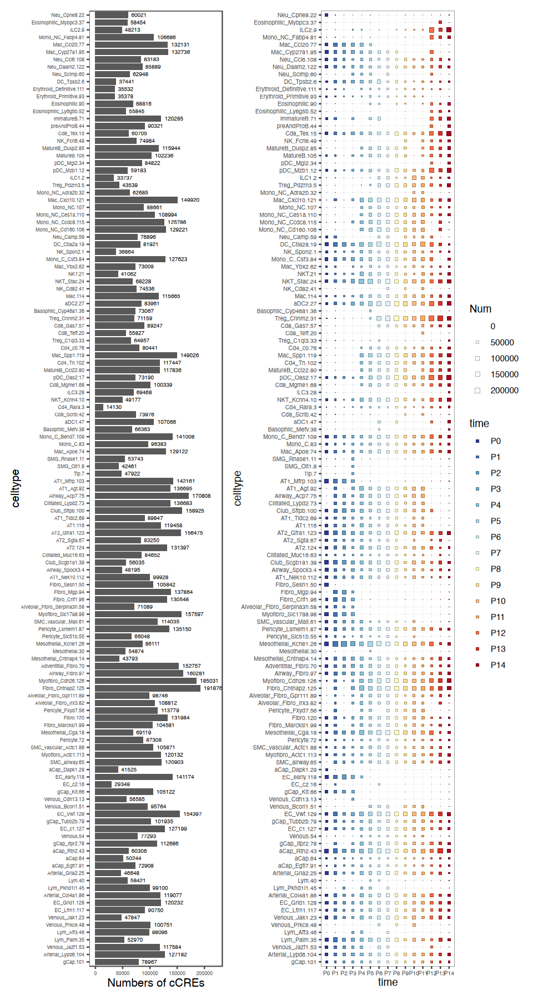

In [79]:
(cre_num_plot|a1)+ patchwork::plot_layout(guides='collect')

In [271]:
ggsave(glue('{output_dir}/CREsubtype accessibility over time distribution3.pdf'),
       (cre_num_plot|a1)+ patchwork::plot_layout(guides='collect'),
       width=200, height=260, units='mm')

In [158]:

options(repr.plot.width=8, repr.plot.height=15)
celltype_marker.peaks=merge.peaks[,c('Peaks',cell_order, 'is_in_encode')]

cell_peak_group = c()
for(j in cell_order){
    tmp_peak_overlap = celltype_marker.peaks[celltype_marker.peaks[,j]=='True'&
                                             celltype_marker.peaks[,'is_in_encode']==1,'Peaks']
    tmp_peak_all = celltype_marker.peaks[celltype_marker.peaks[,j]=='True','Peaks']
    tmp_peak_diff = setdiff(tmp_peak_all, tmp_peak_overlap)
    cell_peak_group = rbind(cell_peak_group, data.frame('celltype'=j, 
                                                        'Num'=c(length(tmp_peak_overlap),
                                                                length(tmp_peak_diff)),
                                                       'type'=c('OL', 'NOL')))
}



In [161]:

cell_peak_group$celltype = as.character(new_celltype[cell_peak_group$celltype, 'cluster_num'])
cell_peak_group$celltype = factor(cell_peak_group$celltype, levels=levels(a2$data$celltype))

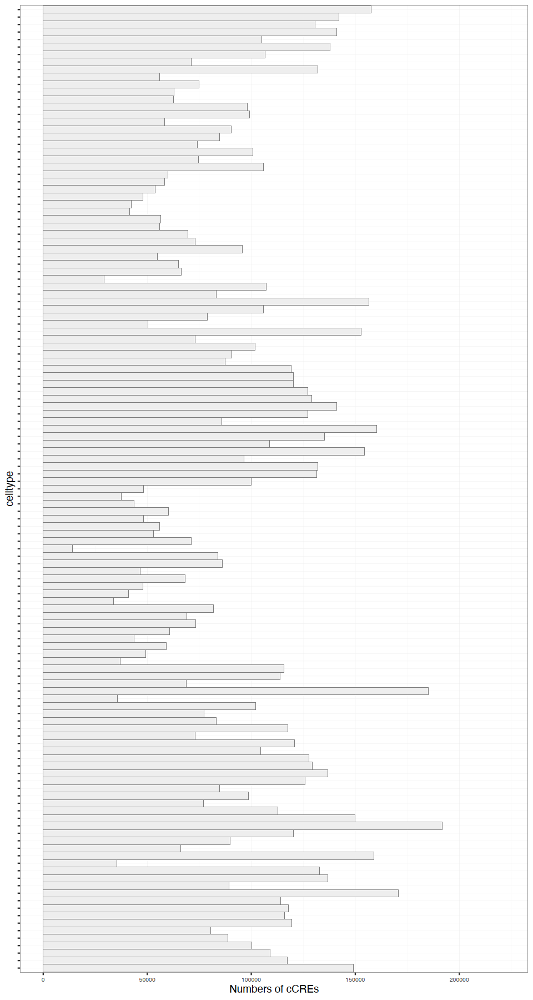

In [175]:
options(repr.plot.width=8, repr.plot.height=15)
all_num_df = cell_peak_group %>%
    group_by(celltype) %>%
    dplyr::summarise(all_num=sum(Num)) %>%
    arrange(all_num) %>% as.data.frame()

cre_num_plot=ggplot(all_num_df, aes(x=all_num, y= celltype)) + 
    geom_bar(stat = "identity",fill = '#eeeeee',width = 1, size=0.1, color='black') +
    #geom_text(aes(x=all_num, y= celltype,label = all_num,hjust = -0.2), size=2,
    #          data=all_num_df, inherit.aes = F)+
    #    scale_fill_manual(values=c("#440154ff", '#21908dff'))+
    xlim(0,max(all_num_df$all_num)+30000)+
    xlab('Numbers of cCREs')+
    theme_few()+
    theme( plot.title = element_text(hjust = 0.5),
         axis.text=element_text(size=5))+
    mytheme+
    theme_bw()+
    theme(panel.border = element_rect(size=0.1),
         panel.grid=element_line(size=0.1),
         axis.text=element_text(size=6),
         axis.text.y=element_blank())
cre_num_plot


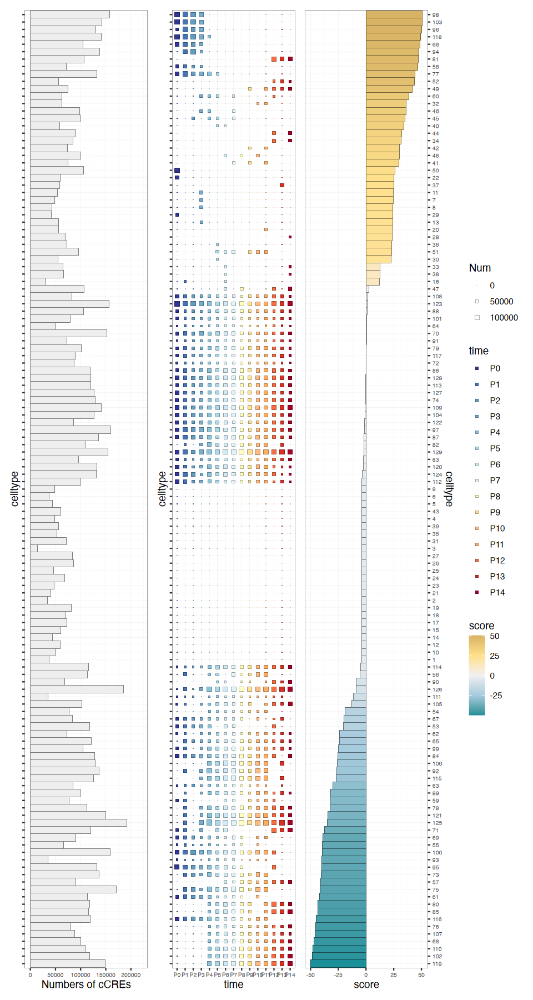

In [183]:
(cre_num_plot|a1|a2)+ patchwork::plot_layout(guides='collect')

In [184]:
ggsave(glue('{output_dir}/CREsubtype accessibility over time distribution2.pdf'),
       (cre_num_plot|a1|a2)+ patchwork::plot_layout(guides='collect'),
       width=200, height=240, units='mm')

In [85]:
## peak_order
top_peaks$cluster = factor(top_peaks$cluster, levels = levels(a2$data$celltype))
top_peaks = top_peaks %>% arrange(cluster)
peak_order = top_peaks$gene
left_ann = rowAnnotation(df=ann_data[cell_order,'Round1', drop=F],
                        col=list('Round1'=celltype_round1_color),
                        simple_anno_size=unit(0.1,'cm'))
cell_mat_scale_ht = t(cell_mat_scale[peak_order, levels(a2$data$celltype)])


In [88]:
ht=Heatmap(cell_mat_scale_ht,
          col=circlize::colorRamp2(c(-1,-0.5,0,0.5,1),c("#440154", "#3B528B", "#21908C", "#5DC863", "#FDE725")),
          #col=circlize::colorRamp2(c(0,0.1,.2),c("white","#fdae61","#d7191c")),
          cluster_rows = F, cluster_columns = F,
          show_row_names = F, show_column_names = F,
          #left_annotation=left_ann,
          use_raster=T,
          border = TRUE,
          border_gp = gpar(col = "black",lwd = 0.2) ,
          column_names_gp = gpar(fontsize=7),
)

pdf(glue('{output_dir}/all_Cell_cCREs_ht2.pdf'), width=4, height=6)
draw(ht)
dev.off()

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

# CREannotation analysis

In [80]:
celltype_marker.peaks=merge.peaks[,c('Peaks',cell_order, 'is_in_encode','ann_HOMER')]

cell_peak_ann = c()
for(j in cell_order){
    tmp_peak = celltype_marker.peaks[celltype_marker.peaks[,j]=='True', ]
    tmp_ann2 = tmp_peak %>% dplyr::group_by(ann_HOMER,is_in_encode) %>% dplyr::summarise(Num=n())
    colnames(tmp_ann2)[1] = 'Ann'
    tmp_ann2$celltype=j
    cell_peak_ann = rbind(cell_peak_ann, tmp_ann2)
}

#cell_peak_ann$celltype = factor(cell_peak_ann$celltype, levels=all_num_df$celltype)

`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann_HOMER'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'ann

In [281]:
cell_peak_ann$celltype = as.character(new_celltype[cell_peak_ann$celltype, 'new_name'])
#cell_peak_ann$celltype = factor(cell_peak_ann$celltype, levels=all_num_df$celltype)

In [284]:
cell_peak_ann$celltype = factor(cell_peak_ann$celltype, levels=celltype_new_order)

In [306]:
homer_ann_color = c(
  "#D0021B",  # Vivid Red
  "#F5A623",  # Orange
  "#8B572A",  # Brown
  "#7ED321",  # Lime Green
  "#417505",  # Olive Green
  "#BD10E0",  # Purple
  "#9013FE",  # Vivid Violet
  "#4A90E2",  # Bright Blue
  "#50E3C2",  # Turquoise
  "#B8E986",  # Light Green
  "#000000",  # Black
  "#9B9B9B",  # Gray
  "#F8E71C",  # Yellow
  "#FF61A6",  # Hot Pink
  "#0052CC",  # Dark Blue
  "#FF6F00",  # Amber
  "#00B8D9"   # Cyan
)

names(homer_ann_color) = unique(cell_peak_ann$Ann)

## genomic position annotation

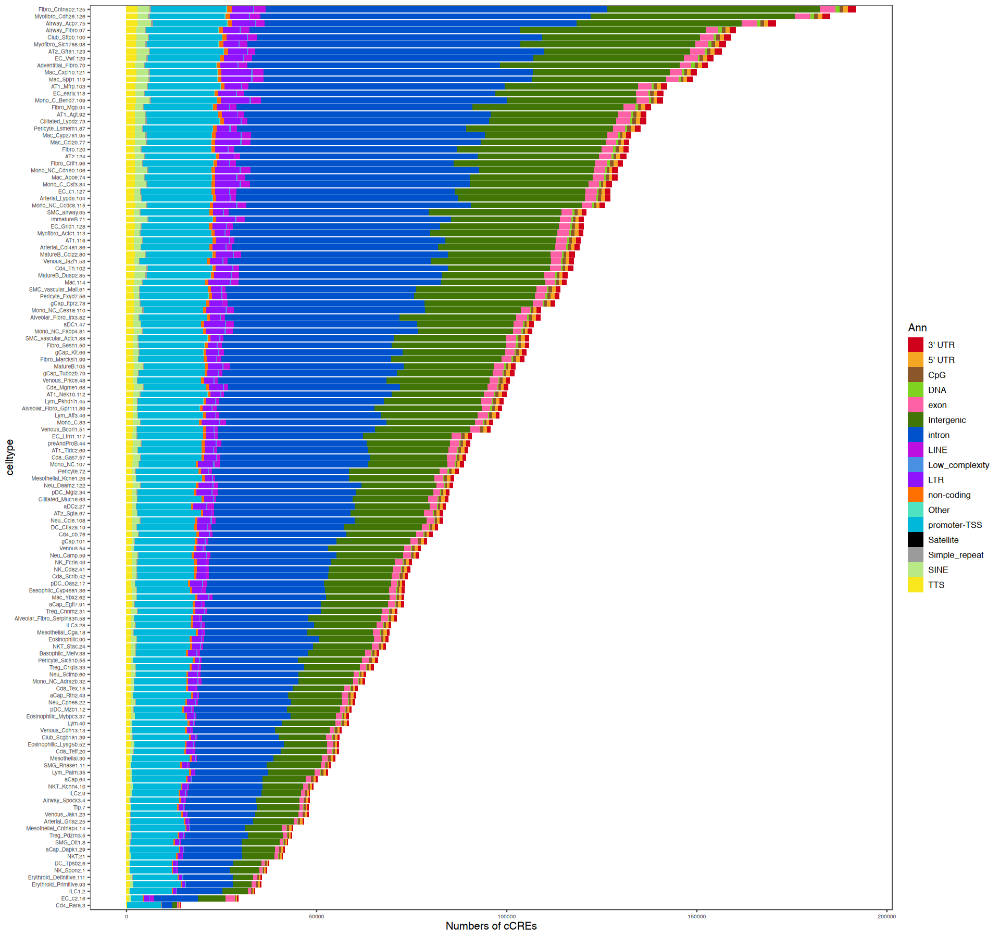

In [307]:
options(repr.plot.width=16, repr.plot.height=15)
a=cell_peak_ann %>%
    ggplot(aes(x=Num, y= celltype,fill = Ann)) + 
    geom_bar(stat = "identity",color = 'black',width = 0.8, size=0) +
    scale_fill_manual(values = homer_ann_color)+
    #facet_wrap(~type)+
    #xlim(0,max(all_num_df$all_num)+30000)+
    xlab('Numbers of cCREs')+
    theme_few()+
    theme(axis.text=element_text(size=6))
a

In [308]:
ggsave(glue('{output_dir}/cell_typeCREannotate genomic regions.pdf'),a,
       width=220, height=240, units='mm')

In [328]:
bar_pote.df = c()

In [469]:
total_plot.df=celltype_marker.peaks %>% 
    group_by(ann_HOMER) %>% 
    dplyr::summarise(Num=n()) %>%
    mutate(percent=round(Num/sum(Num)*100,2))
total_plot.df$group='Total'
bar_pote.df = rbind(bar_pote.df, total_plot.df)
pdf(glue('{output_dir}/cell_typeCREannotate genomic regions(pie_charttotal).pdf'), width=6, height=6)
pie(total_plot.df$Num, 
    #labels=paste0(total_plot.df$Ann, '(',total_plot.df$percent,')'),
    labels = paste0(total_plot.df$percent,'%'),
    col=homer_ann_color,
   border=0.1,main='Total')
dev.off()

pdf 
  2

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

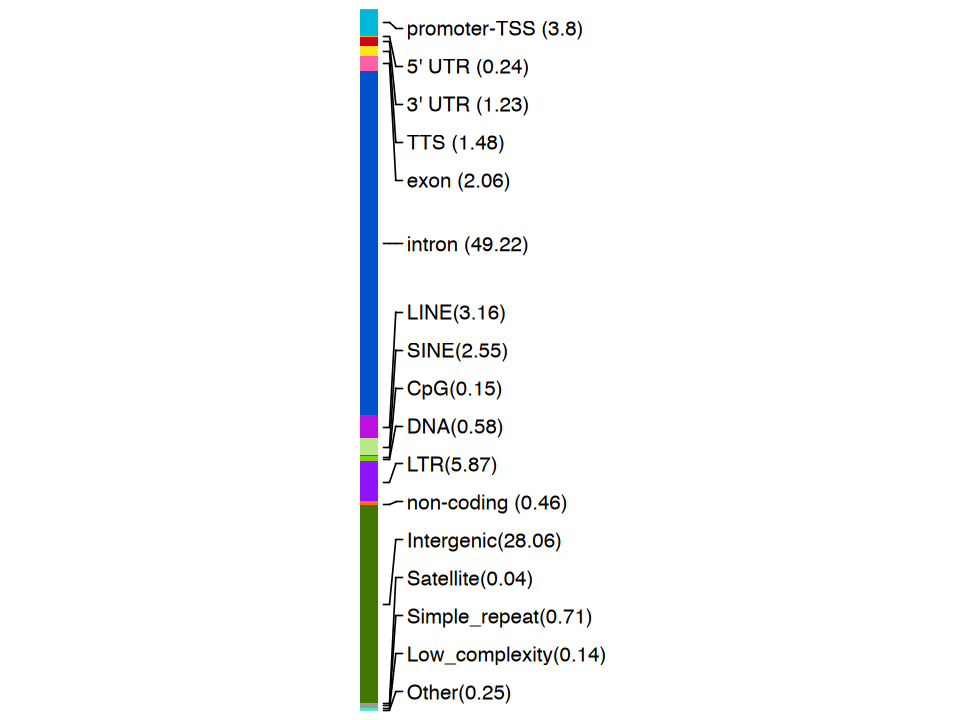

In [475]:
ann_HOMER_order = rev(c(
  "promoter-TSS ",
    
  "5\' UTR ",
  "3\' UTR ",
     "TTS ",
    "exon ",
  "intron ",

  "LINE",
  "SINE",
  "CpG",
  "DNA",
      
    "LTR",
    'non-coding ',
      "Intergenic",
        'Satellite',
      "Simple_repeat",
    "Low_complexity",
    "Other"
))

total_plot.df$ann_HOMER = factor(total_plot.df$ann_HOMER, ann_HOMER_order)
total_plot.df = total_plot.df %>% arrange(desc(ann_HOMER))
total_plot.df$label_pos = cumsum(total_plot.df$percent)/100
total_plot.df$label = paste0(total_plot.df$ann_HOMER, '(',total_plot.df$percent,')')

total_plot.df_mat = c()
total_plot.df_label_mid = c()
total_plot.df_label_mid_label = c()
total_plot.df_mat_name = c()
record_num = 1
record_num_mid = 0
for(i in 1:nrow(total_plot.df)){
    tmp_length = unlist(total_plot.df[i, 'percent'])*100
    tmp_prop = rep(record_num, tmp_length)
    record_num = record_num+1
    tmp_mid = record_num_mid + round(tmp_length/2,0)
    record_num_mid = record_num_mid + tmp_length
    
    total_plot.df_mat = c(total_plot.df_mat, tmp_prop)
    total_plot.df_label_mid = c(total_plot.df_label_mid, tmp_mid)
    total_plot.df_label_mid_label = c(total_plot.df_label_mid_label, total_plot.df$label[i])
    total_plot.df_mat_name = c(total_plot.df_mat_name, as.vector(total_plot.df$ann_HOMER)[i])
}

col_str = structure(homer_ann_color[total_plot.df_mat_name], names=1:length(total_plot.df_mat_name))

ht = Heatmap(as.matrix(total_plot.df_mat),
       cluster_rows=F,
        col = col_str,
       right_annotation = rowAnnotation(prop = anno_mark(at=total_plot.df_label_mid,
                                                         labels=total_plot.df_label_mid_label,
                                                        padding = unit(5, "mm"))),
        heatmap_legend = list(color_bar='discrete'),
        show_heatmap_legend=F,
        use_raster=T,
        width = unit(4, "mm"), # width
       )
ht

pdf(glue('{output_dir}/cell_typeCREannotate genomic regionsTotal(bar_plot).pdf'), width = 3,height = 3)
draw(ht)
dev.off()

In [476]:
total_plot.df=celltype_marker.peaks %>% 
    filter(is_in_encode==1) %>%
    group_by(ann_HOMER) %>% 
    dplyr::summarise(Num=n()) %>%
    mutate(percent=round(Num/sum(Num)*100,2))
total_plot.df$group='Overlap'
bar_pote.df = rbind(bar_pote.df, total_plot.df)
pdf(glue('{output_dir}/cell_typeCREannotate genomic regions(pie_chartOverlap).pdf'), width=6, height=6)
pie(total_plot.df$Num, 
    labels = paste0(total_plot.df$percent,'%'),
    col=homer_ann_color,
   border=0.1,main='Overlap')
dev.off()

pdf 
  2

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

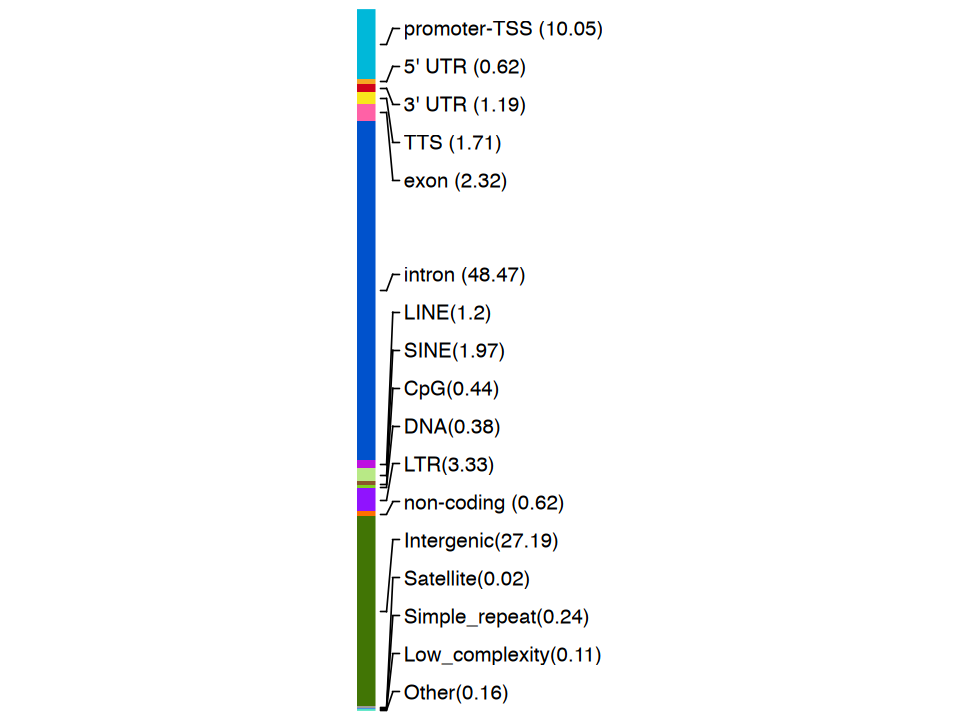

In [477]:
total_plot.df$ann_HOMER = factor(total_plot.df$ann_HOMER, ann_HOMER_order)
total_plot.df = total_plot.df %>% arrange(desc(ann_HOMER))
total_plot.df$label_pos = cumsum(total_plot.df$percent)/100
total_plot.df$label = paste0(total_plot.df$ann_HOMER, '(',total_plot.df$percent,')')

total_plot.df_mat = c()
total_plot.df_label_mid = c()
total_plot.df_label_mid_label = c()
total_plot.df_mat_name = c()
record_num = 1
record_num_mid = 0
for(i in 1:nrow(total_plot.df)){
    tmp_length = unlist(total_plot.df[i, 'percent'])*100
    tmp_prop = rep(record_num, tmp_length)
    record_num = record_num+1
    tmp_mid = record_num_mid + round(tmp_length/2,0)
    record_num_mid = record_num_mid + tmp_length
    
    total_plot.df_mat = c(total_plot.df_mat, tmp_prop)
    total_plot.df_label_mid = c(total_plot.df_label_mid, tmp_mid)
    total_plot.df_label_mid_label = c(total_plot.df_label_mid_label, total_plot.df$label[i])
    total_plot.df_mat_name = c(total_plot.df_mat_name, as.vector(total_plot.df$ann_HOMER)[i])
}

col_str = structure(homer_ann_color[total_plot.df_mat_name], names=1:length(total_plot.df_mat_name))

ht = Heatmap(as.matrix(total_plot.df_mat),
       cluster_rows=F,
        col = col_str,
       right_annotation = rowAnnotation(prop = anno_mark(at=total_plot.df_label_mid,
                                                         labels=total_plot.df_label_mid_label,
                                                        padding = unit(5, "mm"))),
        heatmap_legend = list(color_bar='discrete'),
        show_heatmap_legend=F,
        use_raster=T,
        width = unit(4, "mm"), # width
       )
ht

pdf(glue('{output_dir}/cell_typeCREannotate genomic regionsOverlap(bar_plot).pdf'), width = 3,height = 3)
draw(ht)
dev.off()

In [478]:
total_plot.df=celltype_marker.peaks %>% 
    filter(is_in_encode==0) %>%
    group_by(ann_HOMER) %>% 
    dplyr::summarise(Num=n()) %>%
    mutate(percent=round(Num/sum(Num)*100,2))
total_plot.df$group='NonOverlap'
bar_pote.df = rbind(bar_pote.df, total_plot.df)
pdf(glue('{output_dir}/cell_typeCREannotate genomic regions(pie_chartNon-overlap).pdf'), width=6, height=6)
pie(total_plot.df$Num, 
    labels = paste0(total_plot.df$percent,'%'),
    col=homer_ann_color,
   border=0.1,main='Non-Overlap')
dev.off()

pdf 
  2

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

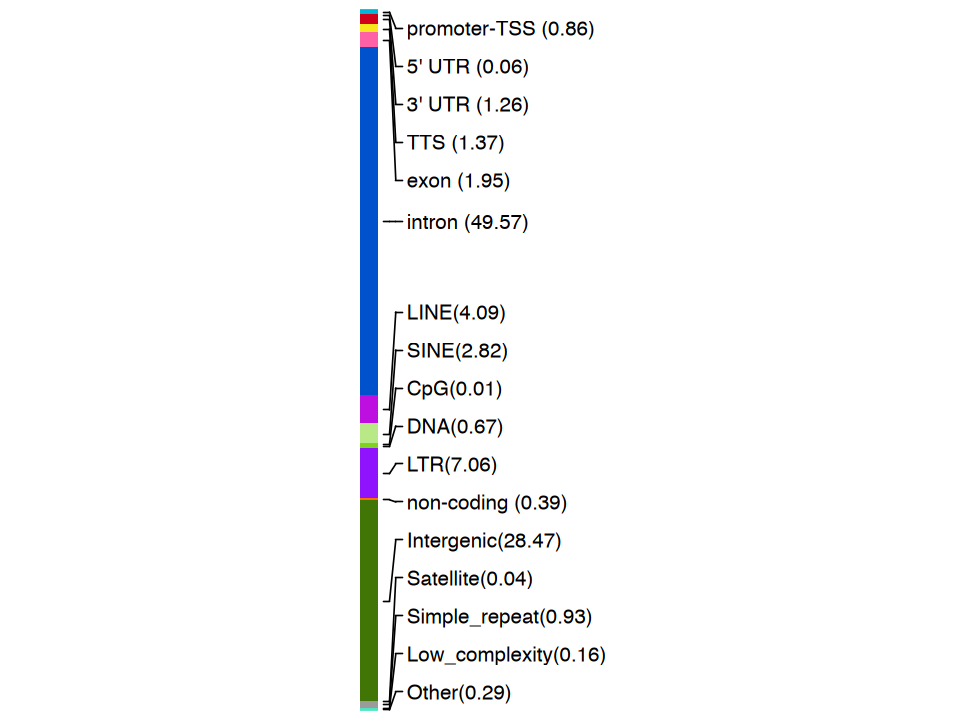

In [479]:
total_plot.df$ann_HOMER = factor(total_plot.df$ann_HOMER, ann_HOMER_order)
total_plot.df = total_plot.df %>% arrange(desc(ann_HOMER))
total_plot.df$label_pos = cumsum(total_plot.df$percent)/100
total_plot.df$label = paste0(total_plot.df$ann_HOMER, '(',total_plot.df$percent,')')

total_plot.df_mat = c()
total_plot.df_label_mid = c()
total_plot.df_label_mid_label = c()
total_plot.df_mat_name = c()
record_num = 1
record_num_mid = 0
for(i in 1:nrow(total_plot.df)){
    tmp_length = unlist(total_plot.df[i, 'percent'])*100
    tmp_prop = rep(record_num, tmp_length)
    record_num = record_num+1
    tmp_mid = record_num_mid + round(tmp_length/2,0)
    record_num_mid = record_num_mid + tmp_length
    
    total_plot.df_mat = c(total_plot.df_mat, tmp_prop)
    total_plot.df_label_mid = c(total_plot.df_label_mid, tmp_mid)
    total_plot.df_label_mid_label = c(total_plot.df_label_mid_label, total_plot.df$label[i])
    total_plot.df_mat_name = c(total_plot.df_mat_name, as.vector(total_plot.df$ann_HOMER)[i])
}

col_str = structure(homer_ann_color[total_plot.df_mat_name], names=1:length(total_plot.df_mat_name))

ht = Heatmap(as.matrix(total_plot.df_mat),
       cluster_rows=F,
        col = col_str,
       right_annotation = rowAnnotation(prop = anno_mark(at=total_plot.df_label_mid,
                                                         labels=total_plot.df_label_mid_label,
                                                        padding = unit(5, "mm"))),
        heatmap_legend = list(color_bar='discrete'),
        show_heatmap_legend=F,
        use_raster=T,
        width = unit(4, "mm"), # width
       )
ht

pdf(glue('{output_dir}/cell_typeCREannotate genomic regionsNonOverlap(bar_plot).pdf'), width = 3,height = 3)
draw(ht)
dev.off()

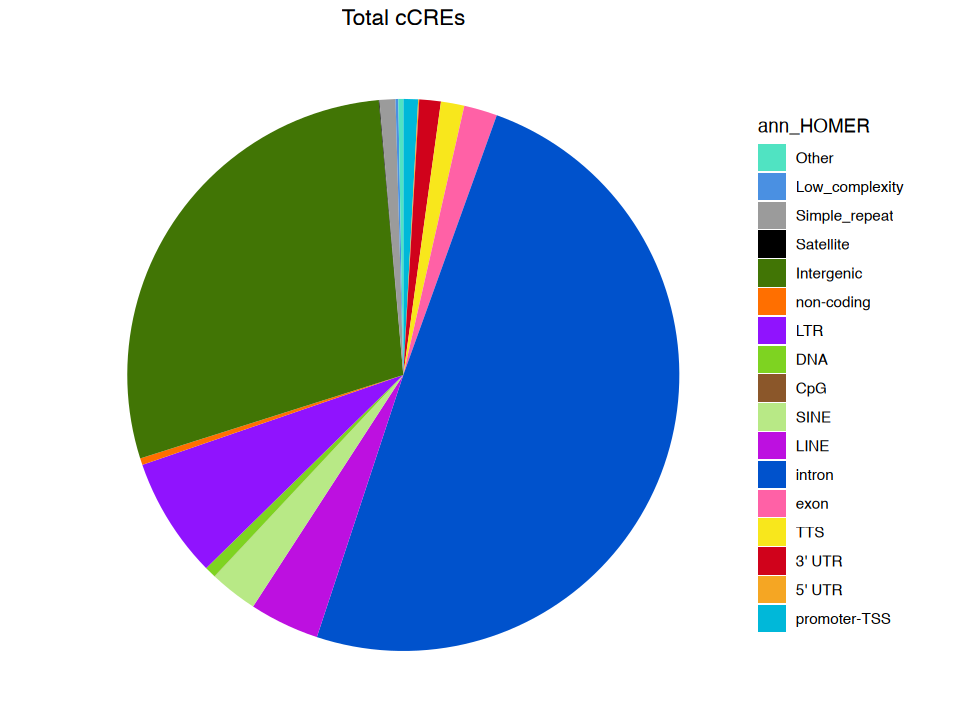

In [480]:
options(repr.plot.width=8, repr.plot.height=6)
a=ggplot(total_plot.df, aes(x="", y=percent, fill=ann_HOMER))+
  geom_bar(width = 1, stat = "identity")+
  coord_polar("y", start=0)+
  #facet_wrap("~ type",ncol = 5, scales = 'free') +
  #geom_text(aes(y = ypos, label = paste0(round(percent,1),'%')), size=5,color='white')+
  theme_void()+
  scale_fill_manual(values = homer_ann_color)+
  labs(title = 'Total cCREs') +
  theme( plot.title = element_text(hjust = 0.5))
a

In [481]:
ggsave(glue('{output_dir}/cell_typeCREannotate genomic regions(pie_chart).pdf'),a,
       width=160, height=120, units='mm')

## chromatinHMMannotation

In [ ]:
hmmstat_dir='./placeholder_project/code/ChromHMM/hmm_renbing/'

hmm_gr = c()
j = 1
for(i in list.files(hmmstat_dir)){
    tmp_stat = data.table::fread(glue('{hmmstat_dir}/{i}'))
    colnames(tmp_stat) = c('chromosome', 'start', 'end', 'state_num', 'state_label')
    tmp_stat$Stage = strsplit(i, '_')[[1]][1]
    tmp_stat$Tissue = strsplit(i, '_')[[1]][2]
    tmp_stat = makeGRangesFromDataFrame(tmp_stat, keep.extra.columns = T)
    if(j==1){
      hmm_gr = tmp_stat
    }else{
      hmm_gr = c(hmm_gr,tmp_stat)
    }
    j = j+1
}

hmm_gr_lung = hmm_gr[hmm_gr$Tissue=='lung']

In [46]:
hmm_gr_lung

GRanges object with 1314354 ranges and 4 metadata columns:
            seqnames            ranges strand |   state_num state_label
               <Rle>         <IRanges>  <Rle> | <character> <character>
        [1]    chr10         0-3102200      * |         U15          NS
        [2]    chr10   3102200-3111400      * |         U14        Hc-H
        [3]    chr10   3111400-3116200      * |         U15          NS
        [4]    chr10   3116200-3126400      * |         U14        Hc-H
        [5]    chr10   3126400-3321400      * |         U15          NS
        ...      ...               ...    ... .         ...         ...
  [1314350]     chrY 11859000-90718400      * |         U15          NS
  [1314351]     chrY 90718400-90721800      * |         U14        Hc-H
  [1314352]     chrY 90721800-90722200      * |         U15          NS
  [1314353]     chrY 90722200-90744000      * |         U14        Hc-H
  [1314354]     chrY 90744000-91744600      * |         U15          NS
     

In [53]:
total_cCRE_gr

GRanges object with 713987 ranges and 0 metadata columns:
           seqnames            ranges strand
              <Rle>         <IRanges>  <Rle>
       [1]     chr1   3012479-3012980      *
       [2]     chr1   3057426-3057927      *
       [3]     chr1   3059441-3059942      *
       [4]     chr1   3094833-3095334      *
       [5]     chr1   3100134-3100635      *
       ...      ...               ...    ...
  [713983]     chrY   6959081-6959582      *
  [713984]     chrY   9646473-9646974      *
  [713985]     chrY 10059220-10059721      *
  [713986]     chrY 10508477-10508978      *
  [713987]     chrY 10626122-10626623      *
  -------
  seqinfo: 21 sequences from an unspecified genome; no seqlengths

In [54]:
inter_Peaks = findOverlaps(total_cCRE_gr,hmm_gr_lung)


inter_Peaks_rg = pintersect(total_cCRE_gr[queryHits(inter_Peaks)], hmm_gr_lung[subjectHits(inter_Peaks)])

In [61]:
tmp_peak = GRangesToString(total_cCRE_gr, sep = c(':','-'))[queryHits(inter_Peaks)]

In [66]:
rownames(merge.peaks) = merge.peaks$Peaks

In [70]:
width_df = data.frame('overlap_width'=width(inter_Peaks_rg),
          'ref_width'=width(hmm_gr_lung[subjectHits(inter_Peaks)]),
          'ref_state'=hmm_gr_lung[subjectHits(inter_Peaks)]$state_label,
                     'cre'=tmp_peak,
                     'isin_encode'=merge.peaks[tmp_peak, 'is_in_encode'])

In [ ]:
hmm_gr_lung$width = width(hmm_gr_lung)

In [125]:
width_df2 = width_df %>%
    group_by(isin_encode,ref_state) %>%
    dplyr::summarise(overlap_width=sum(overlap_width), cre_total_width = n()*502) %>%
    left_join(hmm_gr_lung@elementMetadata %>%
            as.data.frame() %>%
            group_by(state_label) %>%
            dplyr::summarise(ref_width=sum(width)) %>%
             mutate(ref_state=state_label)
             ) 

width_df2$ref_total_width = sum(width(hmm_gr_lung))

`summarise()` has grouped output by 'isin_encode'. You can override using the `.groups` argument.
Joining with `by = join_by(ref_state)`


In [126]:
width_df2 = width_df2 %>%
    mutate(enrich_score = overlap_width/cre_total_width / (ref_width/ref_total_width) )

isin_encode,ref_state,overlap_width,cre_total_width,state_label,ref_width,ref_total_width,enrich_score
<int>,<chr>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
0,En-Pd,47558759,71112316,En-Pd,183809527,10903456754,39.67180
0,En-Pp,4486534,9469728,En-Pp,38950201,10903456754,132.62578
0,En-Sd,7006415,12498796,En-Sd,53860972,10903456754,113.47957
0,En-Sp,410631,910628,En-Sp,14595211,10903456754,336.87172
0,En-W,11889197,18136758,En-W,63150988,10903456754,113.18188
0,Hc-H,3569179,4258968,Hc-H,96267255,10903456754,94.91822


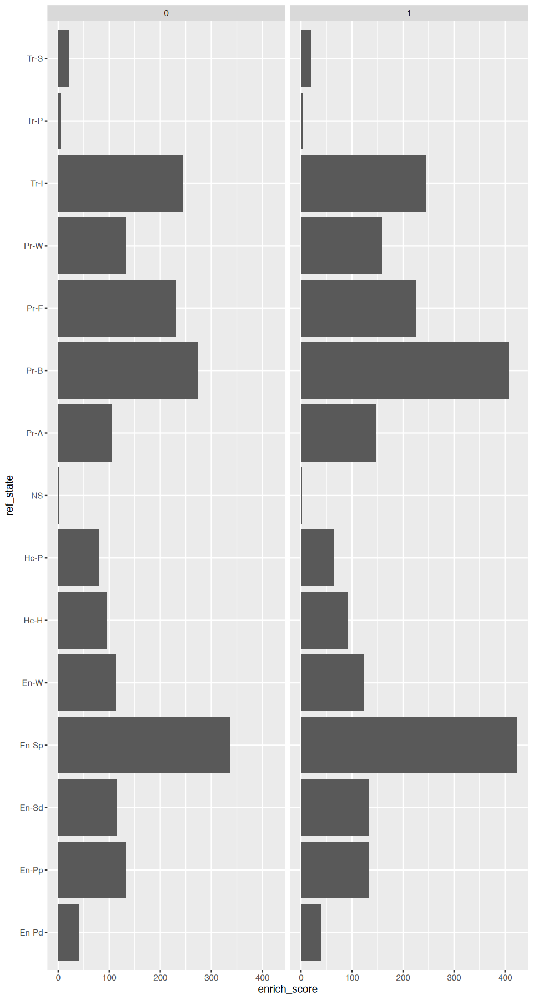

In [127]:
head(width_df2)
width_df2 %>%
    ggplot(aes(y=ref_state,x=enrich_score))+
    geom_bar(stat='identity')+
    facet_wrap(~isin_encode, ncol=2)

In [97]:
hmm_gr_lung@elementMetadata %>%
        as.data.frame() %>%
        group_by(state_label) %>%
        dplyr::summarise(ref_total_width=sum(width))

state_label,ref_total_width
<chr>,<dbl>
En-Pd,183809527
En-Pp,38950201
En-Sd,53860972
En-Sp,14595211
En-W,63150988
Hc-H,96267255
Hc-P,116103022
NS,7249525694
Pr-A,44058910


In [13]:
hmm_ann = read.csv(glue('{base_path}/all_merge_peaks_HMMann.csv'), check.names = F)

In [14]:
colnames(hmm_ann)[1]='idx'
head(hmm_ann)

,idx,cre,hmm_state,Stage,Tissue,isin_encode
,<int>,<chr>,<chr>,<chr>,<chr>,<int>
1,1,chr1:3012479-3012980,NS,e11.5,facial-prominence,1
2,2,chr1:3012479-3012980,NS,e11.5,forebrain,1
3,3,chr1:3012479-3012980,NS,e11.5,heart,1
4,4,chr1:3012479-3012980,NS,e11.5,hindbrain,1
5,5,chr1:3012479-3012980,NS,e11.5,limb,1
6,6,chr1:3012479-3012980,NS,e11.5,liver,1


`summarise()` has grouped output by 'hmm_state', 'Stage'. You can override using the `.groups` argument.


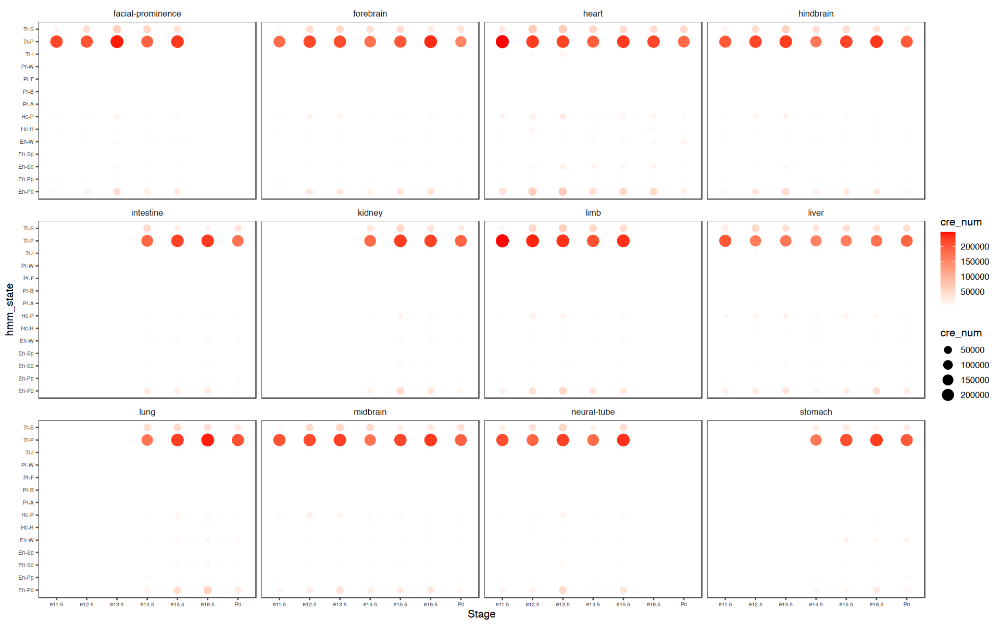

In [484]:
options(repr.plot.width=16, repr.plot.height=10)
hmm_ann %>% 
    filter(hmm_state!='NS') %>%
    filter(isin_encode=='0') %>%
    dplyr::group_by(hmm_state,Stage, Tissue) %>%
    dplyr::summarise(cre_num=n())%>%
    ggplot(aes(x=Stage, y=hmm_state))+
    geom_point(aes(size=cre_num,color=cre_num))+
    scale_color_gradient2(low = 'yellow', high = 'red')+
    facet_wrap(~Tissue)+
    theme_few()+
    theme(axis.text=element_text(size=6))

In [15]:
chromHMM_colors_simple <- c(
  "Pr-A" = "#006400",
  "Pr-W" = "#90EE90",
  "Pr-B" = "#D3D3D3",
  "Pr-F" = "#008000",
  "En-Sd" = "#FFFF00",
  "En-Sp" = "#FFFF00",
  "En-W" = "#FFFFE0",
  "En-Pd" = "#696969",
  "En-Pp" = "#696969",
  "Tr-S" = "#00008B",
  "Tr-P" = "#4169E1",
  "Tr-I" = "#ADD8E6",
  "Hc-P" = "#FA8072",
  "Hc-H" = "#FFC0CB",
  "NS"   = "#FFFFFF"
)
chromHMM_colors_simple2 = data.frame(chromHMM_colors_simple)
chromHMM_colors_simple2$state=rownames(chromHMM_colors_simple2)
chromHMM_colors_simple2$full_name = c(
    "Promoter-Active",
    "Promoter-Weak/Inactive",
    "Promoter-Bivalent",
    "Promoter-Flanking",
    "Enhancer-Strong TSS-distal",
    "Enhancer-Strong TSS-proximal",
    "Enhancer-Weak TSS-distal",
    "Enhancer-Poised TSS-distal",
    "Enhancer-Poised TSS-proximal",
    "Transcription-Strong",
    "Transcription-Permissive",
    "Transcription-Initiation",
    "Heterochromatin-Polycomb",
    "Heterochromatin-H3K9me3",
    "No Chromatin Signal"
)


In [117]:
hmm_ann_bar = chromHMM_colors_simple2 %>%
    mutate(state=factor(state, rev(state))) %>%
    ggplot(aes(x=state, y=1))+
    geom_bar(aes(fill=state),stat='identity', color='black', size=0.5, alpha=0.5)+
    geom_text(aes(y=0.5, label=full_name))+
    scale_fill_manual(values = chromHMM_colors_simple)+
    theme_minimal()+
    NoAxes()+
    theme(panel.grid = element_blank())+
    NoLegend()+
    coord_flip()

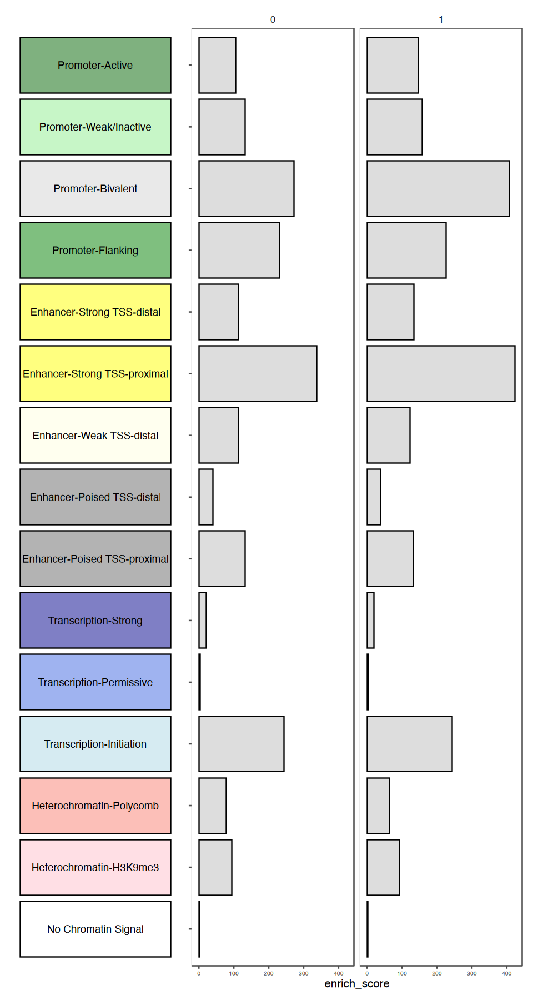

In [128]:
a = width_df2 %>%
    mutate(hmm_state=factor(ref_state, rev(names(chromHMM_colors_simple)))) %>%
    ggplot(aes(x=hmm_state, y=enrich_score))+
    geom_bar(stat='identity', color='black', size=0.5, fill='#dddddd')+
    #geom_hline(yintercept = 1, linetype='dashed', size=0.2, color='black')+
    facet_wrap(~isin_encode, ncol=2)+
    #labs(title='non-Overlap', y='Ro/e')+
    theme_few()+
    theme(axis.text=element_text(size=6),
         axis.text.y=element_blank(),
         axis.title.y=element_blank())+
    coord_flip()
aa = (hmm_ann_bar|a)+plot_layout(widths = c(2,4))
aa

In [129]:
ggsave(glue('{output_dir}/cell_typeCREannotationHMMstate_enrichment_score.pdf'),aa,
       width=140, height=140, units='mm')


## ENCODEintersection

(polygon[GRID.polygon.8218], polygon[GRID.polygon.8219], polygon[GRID.polygon.8220], polygon[GRID.polygon.8221], text[GRID.text.8222], text[GRID.text.8223], text[GRID.text.8224], text[GRID.text.8225], text[GRID.text.8226]) 

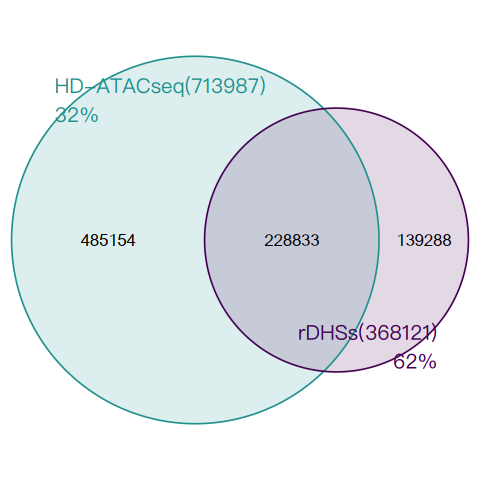

In [277]:
peaks =    total_cCRE_gr#GenomicRanges::reduce(total_cCRE_gr)
Ref.gr =  rDHSs_ref#GenomicRanges::reduce(rDHSs_ref)
inter_Peaks = subsetByOverlaps(peaks,Ref.gr)

options(repr.plot.width=4, repr.plot.height=4)
Ref.Name= 'rDHSs'
PeakName='HD-ATACseq'
name1 = paste0(Ref.Name,'(',length(Ref.gr),')', '\n', round(length(inter_Peaks)/length(Ref.gr),2)*100, '%')
name2 = paste0(PeakName,'(',length(peaks),')', '\n', round(length(inter_Peaks)/length(peaks),2)*100, '%')
plot.aa = draw.pairwise.venn(area1 = length(Ref.gr),    
                             area2 = length(peaks),
                             cross.area = length(inter_Peaks),
                             category = c(name1,name2),
                             lwd = 1,
                             cat.cex = 1,  
                             cat.pos = c(-50,130),
                             cat.dist = 0,
                             cat.just = list(c(1,1), c(0, 0)),
                             col= c("#440154ff", '#21908dff'),
                             fill = c(alpha("#440154ff",0.3), alpha('#21908dff',0.3)),
                             cat.col = c("#440154ff", '#21908dff'),
                             cat.default.pos = "outer",
                             cex = 0.8, 
                             fontfamily = "sans",
                             filename = NULL,
                             ext.line.lty = "dashed",
                             output=F,
                             compression = "lzw" )
plot.aa

In [280]:
ggsave(glue('{output_dir}/cell_typeCREannotation andENCODEintersection.pdf'),plot.aa,
       width=120, height=120, units='mm')

## CREspecificity analysis

In [368]:
rDHSs_ref = readBED(file = './placeholder_project/code//ATAC_pipeline_zyr/sourceData/cCREs_Ref/mm10-cCREs.bed',
                    header = F)

total_cCRE_gr = StringToGRanges(merge.peaks[,'Peaks'], sep = c(':','-'))

In [375]:
peak_in_num_clusters = rowSums(merge.peaks[,cell_order]=='True')

In [376]:
total_cCRE_gr$num_cluster = peak_in_num_clusters
inter_Peaks = subsetByOverlaps(total_cCRE_gr,rDHSs_ref)

In [395]:
overlap_data = as.data.frame(inter_Peaks@elementMetadata) %>% 
    na.omit() %>%
    dplyr::group_by(num_cluster) %>% 
    dplyr::summarise(n=n()) %>%
    mutate(num_cluster = as.vector(num_cluster))
overlap_data[overlap_data$num_cluster>10, 'num_cluster']=10
overlap_data$num_cluster = as.character(overlap_data$num_cluster)
overlap_data[overlap_data$num_cluster=='10', 'num_cluster']='10+'

overlap_data = overlap_data %>% 
    dplyr::group_by(num_cluster) %>% 
    dplyr::summarise(n=sum(n)) %>%
    filter(num_cluster>0)
overlap_data$percent=overlap_data$n / sum(overlap_data$n)
overlap_data$num_cluster = factor(overlap_data$num_cluster, levels=c('1','2','3','4','5','6','7','8','9','10+'))

label_data = overlap_data %>% 
    mutate(num_cluster=factor(num_cluster, levels=rev(c('1','2','3','4','5','6','7','8','9','10+')))) %>%
    arrange(num_cluster) %>%
    mutate(ypos = cumsum(percent)- 0.5*percent) %>%
    filter(percent>0.05)

a=ggplot(overlap_data, aes(x="", y=percent, fill=num_cluster))+
  geom_bar(width = 1, stat = "identity")+
  coord_polar("y", start=0)+
  #facet_wrap("~ Type",ncol = 5) +
  geom_text(aes(y = ypos, label = paste0(round(percent,1)*100,'%')), 
            size=5,color='white', data=label_data)+
  theme_void()+
  scale_fill_igv(name='No.clusters')+
  labs(title = 'Overlap cCREs') +
  theme( plot.title = element_text(hjust = 0.5))

In [393]:
non_overlap_peak = findOverlaps(total_cCRE_gr,rDHSs_ref)
diff_pos = setdiff(1:length(total_cCRE_gr),unique(queryHits(non_overlap_peak)))
non_overlap_peak = total_cCRE_gr[diff_pos,]
overlap_data = as.data.frame(non_overlap_peak@elementMetadata) %>% 
    na.omit()%>%
    dplyr::group_by(num_cluster) %>% 
    dplyr::summarise(n=n()) %>%
    mutate(num_cluster = as.vector(num_cluster))
overlap_data[overlap_data$num_cluster>10, 'num_cluster']=10
overlap_data$num_cluster = as.character(overlap_data$num_cluster)
overlap_data[overlap_data$num_cluster=='10', 'num_cluster']='10+'

overlap_data = overlap_data %>% 
    dplyr::group_by(num_cluster) %>% 
    dplyr::summarise(n=sum(n)) %>%
    filter(num_cluster>0)
overlap_data$percent=overlap_data$n / sum(overlap_data$n)
overlap_data$num_cluster = factor(overlap_data$num_cluster, levels=c('1','2','3','4','5','6','7','8','9','10+'))

label_data = overlap_data %>% 
    mutate(num_cluster=factor(num_cluster, levels=rev(c('1','2','3','4','5','6','7','8','9','10+')))) %>%
    arrange(num_cluster) %>%
    mutate(ypos = cumsum(percent)- 0.5*percent) %>%
    filter(percent>0.05)
label_data

b=ggplot(overlap_data, aes(x="", y=percent, fill=num_cluster))+
  geom_bar(width = 1, stat = "identity")+
  coord_polar("y", start=0)+
  #facet_wrap("~ Type",ncol = 5) +
  geom_text(aes(y = ypos, label = paste0(round(percent,1)*100,'%')), 
            size=5,color='white', data=label_data)+
  theme_void()+
  scale_fill_igv(name='No.clusters')+
  labs(title = 'Non-overlap cCREs') +
  theme( plot.title = element_text(hjust = 0.5))

num_cluster,n,percent,ypos
<fct>,<int>,<dbl>,<dbl>
10+,123555,0.27292970,0.1364648
5,26158,0.05778232,0.4447922
4,31238,0.06900391,0.5081854
3,39764,0.08783761,0.5866061
2,55864,0.12340208,0.6922260
1,111397,0.24607300,0.8769635


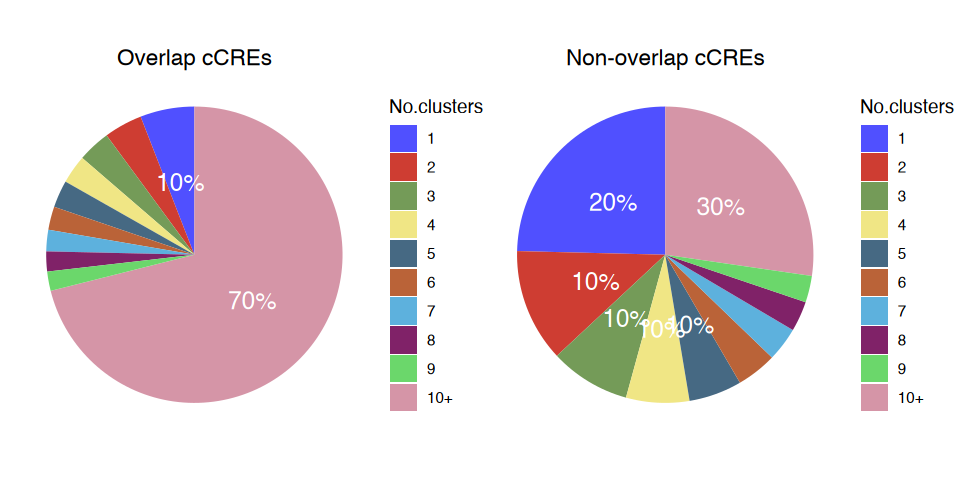

In [396]:
options(repr.plot.width=8, repr.plot.height=4)
a+b

In [399]:
ggsave(glue('{output_dir}/CREspecificity analysis.pdf'),a+b,
       width=180, height=140, units='mm')

## conservation analysis

In [ ]:
phastCons_score = read.csv(glue('{base_path}/phastCons_score.csv'))

rownames(phastCons_score) = paste0(phastCons_score$Chromosome,'-',phastCons_score$Start,'-',phastCons_score$End)

In [279]:
inter_peak_name = GRangesToString(inter_Peaks)

phastCons_score$Overlap = 'Non-overlap'
phastCons_score[intersect(inter_peak_name, rownames(phastCons_score)), 'Overlap'] = 'Overlap'

In [281]:
phastCons_score_mat = read.csv(glue('{base_path}/phastCons_score_mat(10000).csv'), row.names = 'X')
rownames(phastCons_score_mat) = gsub(":", "-", rownames(phastCons_score_mat))

In [306]:
same_peak_name=intersect(inter_peak_name, rownames(phastCons_score_mat))
diff_peak_name=setdiff(rownames(phastCons_score_mat),inter_peak_name)
tmp_func <- function(x){
    x = x[x>-1]
    return(mean(x))
}
overlap_mean_score = apply(phastCons_score_mat[same_peak_name, ], 2, tmp_func)

non_overlap_mean_score = apply(phastCons_score_mat[diff_peak_name, ], 2, tmp_func)

In [399]:
phastCons_score_mat_rnd = read.csv(glue('{base_path}/phastCons_score_mat(random).csv'), row.names = 'X')

random_mean_score = apply(phastCons_score_mat_rnd[1:3000,], 2, tmp_func)

In [400]:
mat_data = data.frame('Overlap'=overlap_mean_score,
                      'Non-overlap'=non_overlap_mean_score,
                      'Random' = random_mean_score,
                      x=-250:250)
mat_data = reshape2::melt(mat_data, id='x')
colnames(mat_data) = c('x', 'Overlap', 'PhastCons_score')

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


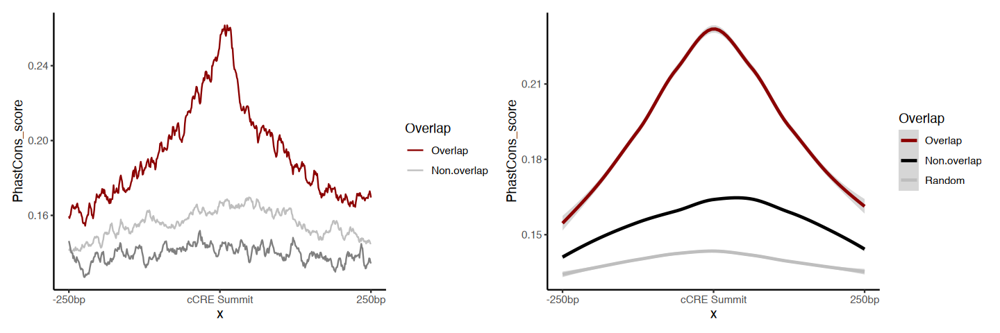

In [403]:
options(repr.plot.width=12, repr.plot.height=4)
a=mat_data %>%
    ggplot(aes(x=x,y=PhastCons_score, color=Overlap))+
    geom_line()+
    scale_color_manual(values = c('Non.overlap'='gray', 'Overlap'='darkred'))+
    scale_x_continuous(breaks = c(-250,0,250), labels = c('-250bp','cCRE Summit','250bp'))+
    theme_classic()
b=mat_data %>%
    ggplot(aes(x=x,y=PhastCons_score, color=Overlap))+
    geom_smooth()+
    scale_color_manual(values = c('Random'='gray','Non.overlap'='black', 'Overlap'='darkred'))+
    scale_x_continuous(breaks = c(-250,0,250), labels = c('-250bp','cCRE Summit','250bp'))+
    theme_classic()
a+b

In [404]:
ggsave(glue('{output_dir}/CREconservation_analysis_line_plot.pdf'),b,
       width=120, height=80, units='mm')

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


## CREspecificity examples

In [81]:
merge.peaks$CRE = gsub(':','-',merge.peaks$Peaks)

In [82]:
base_path='./placeholder_analysis/round_cluster02/cCRE/'
srt = readRDS(glue('{base_path}/celltype_rds/Epi_sub.rds'))

In [83]:
srt = subset(srt, features=merge.peaks$CRE)

In [560]:
Idents(srt) = srt$Celltype_round4
srt_markers = FindAllMarkers(srt, 
                             test.use = 'wilcox', 
                             min.pct = 0.01,
                             logfc.threshold = 0.1,
                             max.cells.per.ident=500)

Calculating cluster AT1

Calculating cluster AT1_Nek10

Calculating cluster AT1_Agt

Calculating cluster AT1_Tldc2

Calculating cluster AT1_Mfrp

Calculating cluster AT2

Calculating cluster AT2_Gfra1

Calculating cluster AT2_Sgta

Calculating cluster Airway_Cilitated_Lypd2

Calculating cluster Airway_Cilitated_Muc16

Calculating cluster Airway_Acp7

Calculating cluster Airway_Club_Sftpb

Calculating cluster Airway_Club_Scgb1a1

Calculating cluster Airway_Spock3



In [561]:
saveRDS(srt_markers, './placeholder_analysis/round_cluster02/cCRE/Epi_sub_marker(round4).rds')

In [202]:
srt_markers = readRDS('./placeholder_analysis/round_cluster02/cCRE/Epi_sub_marker(round4).rds')

In [203]:
srt_markers_filter = srt_markers %>% 
    filter(avg_log2FC>0) %>% #p_val_adj<0.05, 
    group_by(cluster) %>%
    dplyr::top_n(1000, avg_log2FC)

In [204]:
srt_markers_filter

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
3.241037e-05,1.0772885,0.015,0.008,1,AT1,chr11-79639928-79640429
1.651876e-04,0.7002721,0.092,0.071,1,AT1,chr13-41456264-41456765
2.481329e-04,0.6374329,0.036,0.028,1,AT1,chr2-104727280-104727781
2.514874e-04,0.9461815,0.048,0.031,1,AT1,chr13-34696770-34697271
4.872419e-04,0.8951003,0.090,0.061,1,AT1,chr3-62379966-62380467
4.964443e-04,0.6101135,0.010,0.007,1,AT1,chr9-96835356-96835857
5.622467e-04,0.5364835,0.046,0.039,1,AT1,chr10-86259035-86259536
5.926568e-04,0.9864157,0.046,0.028,1,AT1,chr16-45071356-45071857
6.565597e-04,0.4747462,0.054,0.049,1,AT1,chr12-85397799-85398300


In [205]:
head(merge.peaks)

,,.1,Peaks,EC_gCap_Tubb2b:P12,AT2:P2,Stroma_Airway_Fibroblast:P0,EC_gCap_Tubb2b:P3,Airway_Cilitated_Muc16:P13,MatureB_(Cd5+)Ccl22,Stroma_SMC_vascular_Actc1:P14,⋯,Stroma_Adventitial_Fibroblast:P5,Stroma_SMC_vascular_Actc1,Myeloid_Macorphage_Spp1:P14,AT1_Nek10:P6,Monocytes_Classical:P9,EC_gCap_Itpr2:P13,is_in_encode,ann_manual,ann_ChipSeeker,ann_HOMER
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
chr1:3012479-3012980,chr1:3012479-3012980,0,chr1:3012479-3012980,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,1,distal,Distal Intergenic,Intergenic
chr1:3057426-3057927,chr1:3057426-3057927,1,chr1:3057426-3057927,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LTR
chr1:3059441-3059942,chr1:3059441-3059942,2,chr1:3059441-3059942,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,LTR
chr1:3094833-3095334,chr1:3094833-3095334,3,chr1:3094833-3095334,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3100134-3100635,chr1:3100134-3100635,4,chr1:3100134-3100635,False,False,False,False,False,False,False,⋯,False,False,False,False,False,False,0,distal,Distal Intergenic,Intergenic
chr1:3119836-3120337,chr1:3119836-3120337,5,chr1:3119836-3120337,False,False,True,False,False,False,True,⋯,True,True,False,False,False,False,1,distal,Distal Intergenic,Intergenic


In [210]:
top_peaks_ann = add_gene_info(srt, srt_markers_filter)


top_peaks_ann$overlap = 'Overlap'
top_peaks_ann[top_peaks_ann$gene%in%merge.peaks[merge.peaks$is_in_encode==0, 'CRE'],
              'overlap'] = 'Non-overlap'

In [212]:
top_peaks_ann1 = top_peaks_ann %>% 
    dplyr::filter(overlap=='Non-overlap') %>%
    filter(avg_log2FC>0) %>% #p_val_adj<0.05, 
    group_by(cluster) %>%
    dplyr::top_n(1, avg_log2FC)

In [213]:
myfragments=list()
for(x in Fragments(srt)){
    if(length(x@cells)>0){
        xname = x@path
        if(xname %in% names(myfragments)){
            myfragments[[xname]]@cells = c(myfragments[[xname]]@cells, x@cells)
        }else{
            myfragments[[xname]] = x
        }
    }
}
myfragments = unname(myfragments)

srt2 = srt

Fragments(srt2) = NULL
Fragments(srt2) = myfragments

In [214]:
plot_region=top_peaks_ann1$gene

In [218]:
Idents(srt2) = srt$Celltype_round4

In [ ]:
base_path='./placeholder_analysis/round_cluster02/cCRE/'
merge.peaks = read.csv(glue('{base_path}/all_merge_peaks_ann.csv'), check.names = F)
merge.peaks

[1] 0

In [18]:
umap = read.csv(glue('./placeholder_analysis/round_cluster02/merge/cell_meta.csv'))

In [ ]:
pseudoObj_peaks <- readRDS(glue('./placeholder_analysis/round_cluster02/round0/pseudoObj_peaks.rds'))
pseudoObj_cells <- readRDS(glue('./placeholder_analysis/round_cluster02/round0/pseudoObj_cells.rds'))

ERROR: Error: object 'umap' not found


In [8]:
pseudoObj_cells@meta.data[umap$X, colnames(umap)] = umap
pseudoObj_cells@meta.data[,'nCount_ATAC'] = pseudoObj_cells$n_fragment
pseudoObj_cells@meta.data[,'nFeature_ATAC'] = pseudoObj_cells$n_peaks

In [20]:
top_peaks = filter_marker %>% 
  dplyr::filter(avg_log2FC >=0.1&p_val_adj <=0.05) %>%
  group_by(cluster) %>% 
  top_n(2000,avg_log2FC)

colnames(top_peaks)[2:5] = c('gene', 'score','avg_log2FC', 'p_val','p_val_adj')
top_peaks_ann = add_gene_info(pseudoObj_peaks, top_peaks)

In [21]:
merge.peaks[1:3,1:3]

,,.1,Peaks
,<chr>,<int>,<chr>
1,chr1:3012479-3012980,0,chr1:3012479-3012980
2,chr1:3057426-3057927,1,chr1:3057426-3057927
3,chr1:3059441-3059942,2,chr1:3059441-3059942


In [22]:
cre_overlap_group = merge.peaks$is_in_encode
names(cre_overlap_group) = gsub(':','-', merge.peaks[,1])

In [23]:
top_peaks_ann_filter = top_peaks_ann
top_peaks_ann_filter$overlap = 'Overlap'
top_peaks_ann_filter[cre_overlap_group[top_peaks_ann_filter$gene]==0, 'overlap'] = 'Non-overlap'

In [24]:
tmp_umap = umap[, c('Celltype_round4','Celltype_round2','Celltype_round1')] %>% unique()
rownames(tmp_umap) = tmp_umap$Celltype_round4

top_peaks_ann_filter$Celltype_round2 = tmp_umap[top_peaks_ann_filter$cluster, 'Celltype_round2']

top_peaks_ann_filter$Celltype_round1 = tmp_umap[top_peaks_ann_filter$cluster, 'Celltype_round1']

In [25]:
table(pseudoObj_cells$Celltype_round3)


                 Airway_Acp7       Airway_Cilitated_Lypd2 
                        7428                         7115 
      Airway_Cilitated_Muc16          Airway_Club_Scgb1a1 
                        5292                         1665 
           Airway_Club_Sftpb                Airway_Spock3 
                       11909                          275 
                         AT1                      AT1_Agt 
                       21018                        10315 
                    AT1_Mfrp                    AT1_Nek10 
                       12555                        17096 
                   AT1_Tldc2                          AT2 
                        6126                        35205 
                   AT2_Gfra1                     AT2_Sgta 
                       28072                         5691 
                   Basophilc                          CD4 
                        3207                        20196 
                         CD8                           

In [9]:
select_cells = c(
    'Tcell', 'Bcell', 'Myeloid',
    'EC_Arterial','EC_Venous','EC_aCap','EC_gCap', 'Lymphatic_EC',
    'AT1', 'AT2', 'Airway',
    'Fibroblast', 'Mesothelial', 'Pericyte','Myofibroblast'
)

In [64]:
pseudoObj_cells2 = subset(pseudoObj_cells, Celltype_round2%in%select_cells)
pseudoObj_cells2$group = pseudoObj_cells2$Celltype_round2
pseudoObj_cells2@meta.data[pseudoObj_cells2$group%in%c('EC_aCap','EC_gCap'), 'group'] = 'EC_cap'

In [65]:
total_cCRE_gr = StringToGRanges(merge.peaks[,'Peaks'], sep = c(':','-'))
total_cCRE_gr$Overlap = ifelse(merge.peaks$is_in_encode==1, 'Overlap', 'Non-overlap')

In [66]:
pseudoObj_cells2@assays$ATAC@ranges = total_cCRE_gr
pseudoObj_cells2@assays$ATAC@meta.features = data.frame('peak_group'=total_cCRE_gr$Overlap)

In [67]:
pseudoObj_cells2$group = factor(pseudoObj_cells2$group, c(
    'Tcell', 'Bcell', 'Myeloid',
    'EC_Arterial','EC_Venous','EC_cap', 'Lymphatic_EC',
    'AT1', 'AT2', 'Airway',
    'Fibroblast', 'Mesothelial', 'Pericyte','Myofibroblast'
))

In [35]:
Immune = c('Cd53','Cd84','Slc11a1','Ptprc','Cd68','Ncf4','Fmnl1','Laptm5','Slc4a1','Hbb-bs','Clec4e','Gm14548')

Endothelium = c('Cldn5','Cdh5','Clec14a','Nsg1','Lyve1','Kit','Tie1','Flt1','Shank3','Nos3','Scn3b','Tekt3','Glb1l3')

Epithelium = c('Epcam','Krt19','Krt8','Cdh1','Sftpd','Dynlrb2','Sftpa1','Wnt7a','Dpyd','Trpm6','Gm28856','Ankrd40','Cyp2b10')

Stroma=c('Wnt2','Mfap4','Col1a1','Col1a2','Adcy2','Palm2','Cib4')

# -----round 2--------
# Epithelium
Alveolar=c('Ager','Aqp5','Cav1')
AT1=c('Spock2','Msln','Pdpn','Stk17b','Fmn2','Tns3','Tmem30c','Arhgap28','Cep78','Akap2')
AT2=c('Sftpc','Sftpa1','Lamp3','Abca3','Cd36','Napsa','Slc34a2','Tspan11','Gli2','Il33','Pkd2l1','Gm26827')
Secretory=c('Scgb3a2','Scgb3a1','Scgb1a1','Agr3','Aqp4','Nnmt','Spink3','Trdn','Chil4','Neb')
Schwann=c('Aldh1a1','Aldh1a3','Angpt1','Postn','Heyl','Itih5','Nnmt','Gm26714','Olfml2a','Tfap2c')
Neuroendocrine_OR_precursor=c('Acsl1','Grp','Neurod1', 'Slc15a3','Cfc1','Ghrl','Neurog3','Rfx6','Fbxw24','Spock3')
Cliated = c('Foxj1', 'Tppp3','Ccdc78','Ccdc170','Ankrd65','Gm1045','Ccdc155','Gm26816','Dzip1l')
Tip=c('Sox9','Gm26714','Myo3b','A630073D07Rik','Car6','Cyp3a11','Scgb2b27')
SMG = c('Acta2','Ccl28', 'Rnase1','Oit1', 'Krt5','Lpo','Rnase1')

# Immune
Tcell = c('Ptprc', 'Cd4','Cd8a','Cd3e','Cd3g', 'Cd28','Camk4','Adh1','Olfr525')
Bcell = c('Cd19', 'Cd79a','Cd79b','Ms4a1','Bank1','Erg','Cplx2','Hemt1','Cntn1')
Myeloid = c('Cd68', 'Cd14','Dpys','Fpr1','Gda','Sirpb1b','Gm5150')


# Stroma
Myofibroblast=c('Tgfbi','Wnt5a','Mki67','Spint2','Etv5','Lyg1','P4ha3') # 1,7,8, Myofibroblast, proliferating Myofibroblast
fibroblast = c('Cxcl14', 'Aldh1a1','Wnt2', 'Tyrp1','Uggt1','Dclre1a','Pdyn','Sec22c','Gm13538') # 0,2,5,6,9,10,11,12,13
Mesothelial = c('Gabrd','Notum','Wt1','Upk3b', 'Msln','Fgd3','Dmkn','Lrrc66','Krt6a') # 9, Mesothelial
Pericyte = c('Ggt5','Pdgfrb', 'Rgs5', 'Cox4i2','Igfbp6','Ehd3','Gpr143','Gm26705') # 3,4 Pericyte
SMC_OR_cardiomyocyte = c('Eln', 'Acta2', 'Cnn1', 'Actc1','Olfr557','Slc6a9') # 4, SMC or cardiomyocyte
AirwayFibro_OR_cardiomyocyte = c('Entpd2','Serpinf1', 'S100a4','Tnc','Tnnt2','Fbxo7','Igsf11','Cdh19') # 15 
stroma_marker = c('Col1a1', 'Apoe','Top2a','Hist3h2a','Hmga1','Marcksl1','Mmp23','Pdgfrl','Rcn3') # Stroma
Alveolar_fibroblast=c('Fgf7', 'Fgfr4','Plin2','Mfap4','Ces1d') #0,2,5,6,10,11,12,13 # Alveolar fibroblast, Lipofibro
Adventitial_fibroblast=c('Serpinf1', 'Lum','Pi16', 'Ccl11', 'Dcn') # 5, adventitial fibroblast
Airway_fiborblast=c('Entpd2','Serpinf1', 'S100a4','Tnc','Tnnt2') # 15 , Airway fiborblast,cardiomyocyte

# Endothelium


In [ ]:
known_genes = c(
    Immune,
    Endothelium,
    Epithelium,
    Stroma,
    Tcell, Bcell, Myeloid,
    Alveolar, AT1, AT2, Secretory, Schwann, Neuroendocrine_OR_precursor, Cliated, Tip, SMG,
    Myofibroblast, fibroblast, Mesothelial, Pericyte, SMC_OR_cardiomyocyte, AirwayFibro_OR_cardiomyocyte,
    stroma_marker, Alveolar_fibroblast, Adventitial_fibroblast, Airway_fiborblast,
    'Gabrd','Notum','Wt1','Upk3b', 'Msln','Fgd3','Dmkn','Lrrc66','Krt6a',
    'Ggt5','Pdgfrb', 'Rgs5', 'Cox4i2','Igfbp6','Ehd3','Gpr143','Gm26705'
         )
known_genes = unique(known_genes)

In [39]:
length(known_genes)

[1] 201

In [68]:
Non_top_peaks = top_peaks_ann_filter %>% 
    dplyr::filter(Celltype_round2%in%select_cells) %>%
    filter(gene_name%in%known_genes) %>%
    filter(distance<2000) %>%
  # dplyr::filter(overlap=='Overlap') %>%
  group_by(Celltype_round2) %>% 
  top_n(1,-avg_log2FC) 

plot_region=unique(Non_top_peaks$gene)

In [69]:
head(Non_top_peaks)

cluster,gene,score,avg_log2FC,p_val,p_val_adj,pct_nz_group,pct_nz_reference,tx_id,gene_name,gene_id,gene_biotype,type,closest_region,distance,isin_promoter,isin_body,overlap,Celltype_round2,Celltype_round1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
EC_Arterial_Gria2,chr4-57711912-57712413,3.483228,3.183241,5.163450e-04,7.958029e-04,0.015609756,0.0025629034,ENSMUST00000102905,Palm2,ENSMUSG00000090053,protein_coding,utr,chr4-57710188-57712016,0,0,1,Non-overlap,EC_Arterial,Endothelium
MatureB(Cd5-),chr13-49277302-49277803,14.333213,4.313415,3.038050e-46,1.102866e-45,0.018358449,0.0014549536,ENSMUST00000110087,Fgd3,ENSMUSG00000037946,protein_coding,cds,chr13-49277537-49277616,0,1,1,Non-overlap,Bcell,Immune
Myeloid_Macorphage_Ybx2,chr11-87805396-87805897,3.974513,1.680201,7.146225e-05,1.810383e-04,0.007195607,0.0027636152,ENSMUST00000103177,Lpo,ENSMUSG00000009356,protein_coding,utr,chr11-87806428-87806846,530,1,1,Overlap,Myeloid,Immune
EC_aCap,chr16-95357266-95357767,2.352675,1.615539,1.867505e-02,2.788844e-02,0.002439940,0.0012615533,ENSMUST00000113846,Erg,ENSMUSG00000040732,protein_coding,utr,chr16-95359169-95360805,1401,0,1,Non-overlap,EC_aCap,Endothelium
Stroma_Pericyte_Slc51b,chr18-61083920-61084421,5.307909,3.865884,1.176785e-07,2.521433e-07,0.009845288,0.0010710080,ENSMUST00000115274,Pdgfrb,ENSMUSG00000024620,protein_coding,utr,chr18-61083384-61085056,0,0,1,Overlap,Pericyte,Stroma
Stroma_Myofibroblast_Actc1,chr5-134715446-134715947,10.273543,3.250412,1.072819e-24,5.155641e-24,0.007497027,0.0009080168,ENSMUST00000015138,Eln,ENSMUSG00000029675,protein_coding,cds,chr5-134715684-134715731,0,0,1,Non-overlap,Myofibroblast,Stroma


In [70]:
table(Non_top_peaks$overlap)


Non-overlap     Overlap 
         12           3 

In [ ]:
Tcell = c('Ptprc', 'Cd4','Cd8a','Cd3e','Cd3g', 'Cd28')
Bcell = c('Cd19', 'Cd79a','Cd79b','Ms4a1','Bank1','Erg')
Myeloid = c('Cd68', 'Cd14','Dpys','Fpr1','Gda','Sirpb1b')
#Immune = c('Cd53','Cd84','Slc11a1','Ptprc','Cd68','Ncf4','Fmnl1','Laptm5','Slc4a1','Hbb-bs','Clec4e','Gm14548')


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale

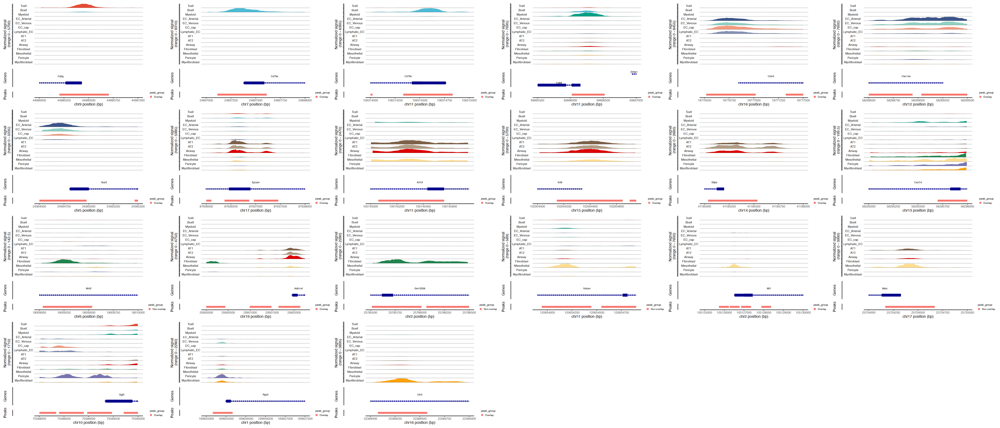

In [ ]:
# Endothelium
tmp_genes = c('Cd3g', 
              'Cd79a', 'Cd79b',
              'Cd68', 'Gm5150',
              'Cldn5', 'Clec14a','Nos3',
              'Epcam','Krt19','Krt8','Sftpd',
              'Cxcl14', 'Wnt2','Aldh1a1','Gm13538',
              'Notum', 'Wt1', 'Msln',
              'Ggt5','Rgs5',
              'Etv5','Mki67'
)

tmp_genes = c('Cd3g', 
              'Cd79a', 'Cd79b',
              'Cd68', 'Gm5150',
              'Cldn5', 'Clec14a','Nos3',
              'Epcam','Krt19','Krt8','Sftpd',
              'Cxcl14', 'Wnt2','Aldh1a1','Gm13538',
              'Notum', 'Wt1', 'Msln',
              'Ggt5','Rgs5',
              'Etv5','Mki67'
)


color_name = c(    'Tcell', 'Bcell', 'Myeloid',
    'EC_Arterial','EC_Venous','EC_cap', 'Lymphatic_EC',
    'AT1', 'AT2', 'Airway',
    'Fibroblast', 'Mesothelial', 'Pericyte','Myofibroblast')
colors_value = c('#E64B35FF', '#4DBBD5FF', '#00A087FF',
                  '#3C5488FF', '#91D1C2FF', '#F39B7FFF', '#8491B4FF',
                  '#7E6148FF', '#B09C85FF', '#DC0000FF',
                  '#20854EFF', '#FFDC91FF', '#7876B1FF','#FFA100FF')
names(colors_value) = color_name

tmp_genes = c('chr9-44980000-44981000', # Cd3g
              'chr7-24897000-24898000', 'chr11-106314000-106315000',
              'chr11-69665500-69667000', #'Gm5150',
              'chr16-18776500-18777500', 'chr12-58268500-58269500','chr5-24364500-24365500',
              'chr17-87636000-87638000','chr11-100145000-100145750','chr15-102004000-102004750','chr14-41185000-41186000',
              'chr13-56295000-56296000', 'chr6-18009000-18010000','chr19-20600000-20602250','chr2-25785500-25786500',
              'chr11-120653900-120654900', 'chr2-105125000-105130000', 'chr17-25754000-25755000',
              'chr10-75588000-75590000','chr1-169655000-169657500',
              'chr16-22389000-22390000'
)
b=CoveragePlot(pseudoObj_cells2, 
             region = tmp_genes,
             group.by='group',
             ymax='q95', 
             #window=200, 
             peaks=TRUE,
             peaks.group.by='peak_group',
             ncol=6,
             extend.upstream = 0, 
             extend.downstream = 0) & scale_fill_manual(values = colors_value)
options(repr.plot.width=2*length(tmp_genes), repr.plot.height=18)
b

In [106]:
ggsave(glue('{output_dir}/Manual_Marker_gene_Coverageplot.pdf'), b,  
       width=560, height = 380, units='mm', dpi=600, bg='transparent')

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


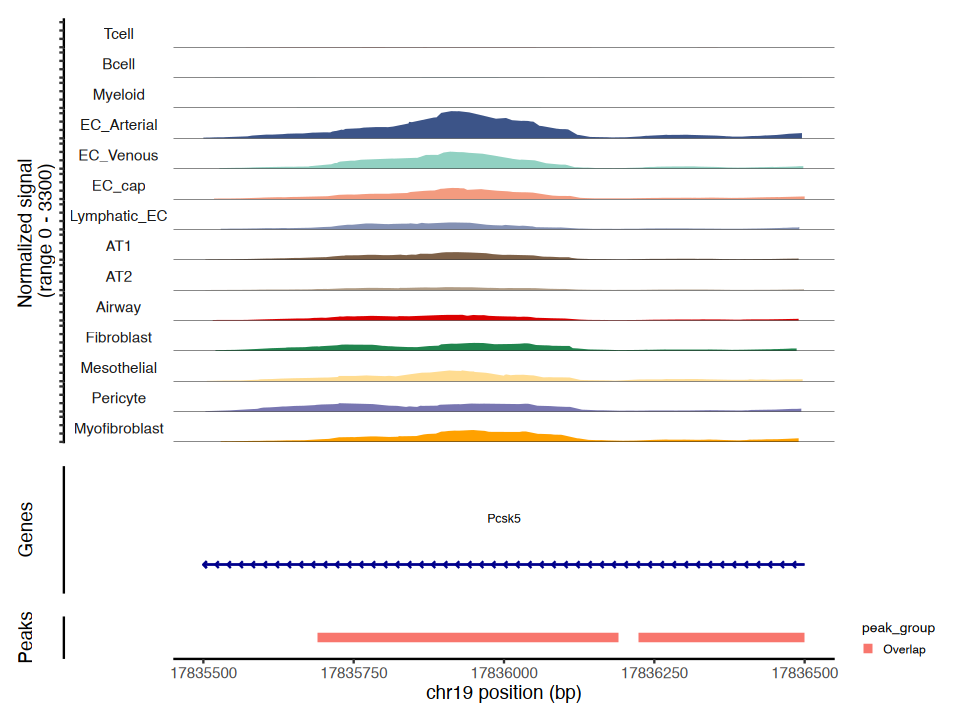

In [129]:
options(repr.plot.width=8, repr.plot.height=6)
CoveragePlot(pseudoObj_cells2, 
             region = 'chr19-17835500-17836500',
             group.by='group',
             #ymax='q95', 
             #window=200, 
             peaks=TRUE,
             peaks.group.by='peak_group',
             ncol=1,
             extend.upstream = 0, 
             extend.downstream = 0) & scale_fill_manual(values = colors_value)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


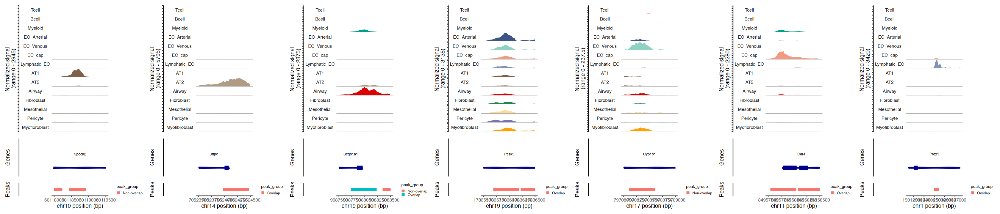

In [130]:
AT1=c('Spock2','Stk17b','Cep78')
AT2=c('Sftpc','Sftpa1')
Secretory=c('Scgb1a1','Agr3','Aqp4')

genes_id1=c('Pcsk5','Gria2','Rnls', 'Serpine2')
genes_id2=c('Chodl','Prss2','Olfm1','Selp','Dusp23','Cdh11','Nuak1','Vegfc','Cyp1b1')
genes_id3=c('Car4','Gpihbp1', 'Thy1','Gpihbp1','Kit', 'Mki67','Itpr2')
genes_id4=c('Lox','Cytl1','Nuak1','Cpe', 'Lypd6', 'Mki67', 'Scg3', 'Hs3st1', 'Top2a', 'Flt4','Prox1', 'Pde2a')

Arterial=c('Pcsk5')
Venoud = c('Cyp1b1')
Cap = c('Car4')
Ly_EC=c('Prox1')


tmp_genes = c('chr10-60118000-60119500',
                'chr14-70523500-70524500',
                'chr19-9087500-9088500',

                'chr19-17835500-17836500',
                'chr17-79708000-79709000',
                'chr11-84957500-84958500',
                'chr1-190122500-190127500'
)
b=CoveragePlot(pseudoObj_cells2, 
             region = tmp_genes,
             group.by='group',
             ymax='q95', 
             #window=200, 
             peaks=TRUE,
             peaks.group.by='peak_group',
             ncol=7,
             extend.upstream = 0, 
             extend.downstream = 0) & scale_fill_manual(values = colors_value)
options(repr.plot.width=4*length(tmp_genes), repr.plot.height=6)
b

In [131]:
ggsave(glue('{output_dir}/Manual_Marker_gene_Coverageplot(supplement_epithelium_endothelium).pdf'), b,  
       width=600, height = 180, units='mm', dpi=600, bg='transparent')

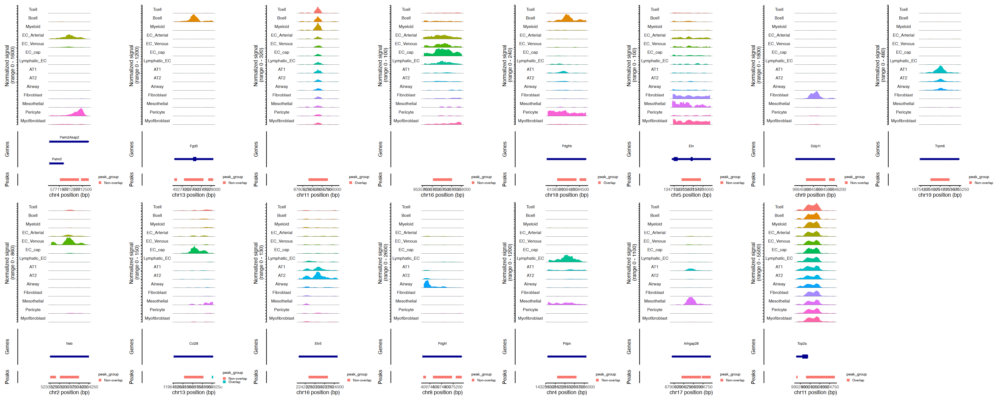

In [ ]:
tmp_genes = plot_region#c('Ptprc','Cldn5', 'Krt8', 'Col1a1')
b=CoveragePlot(pseudoObj_cells2, 
             region = tmp_genes,
             group.by='group',
             #ymax='q95', 
             #window=200, 
             peaks=TRUE,
             peaks.group.by='peak_group',
             ncol=,
             extend.upstream = 250, 
             extend.downstream = 250)
options(repr.plot.width=2*length(tmp_genes), repr.plot.height=12)
b
ggsave(glue('{output_dir}/Known_gene_coverageplot.pdf'), b,
       width=2*length(tmp_genes), height = 12,  dpi=600, bg='transparent')

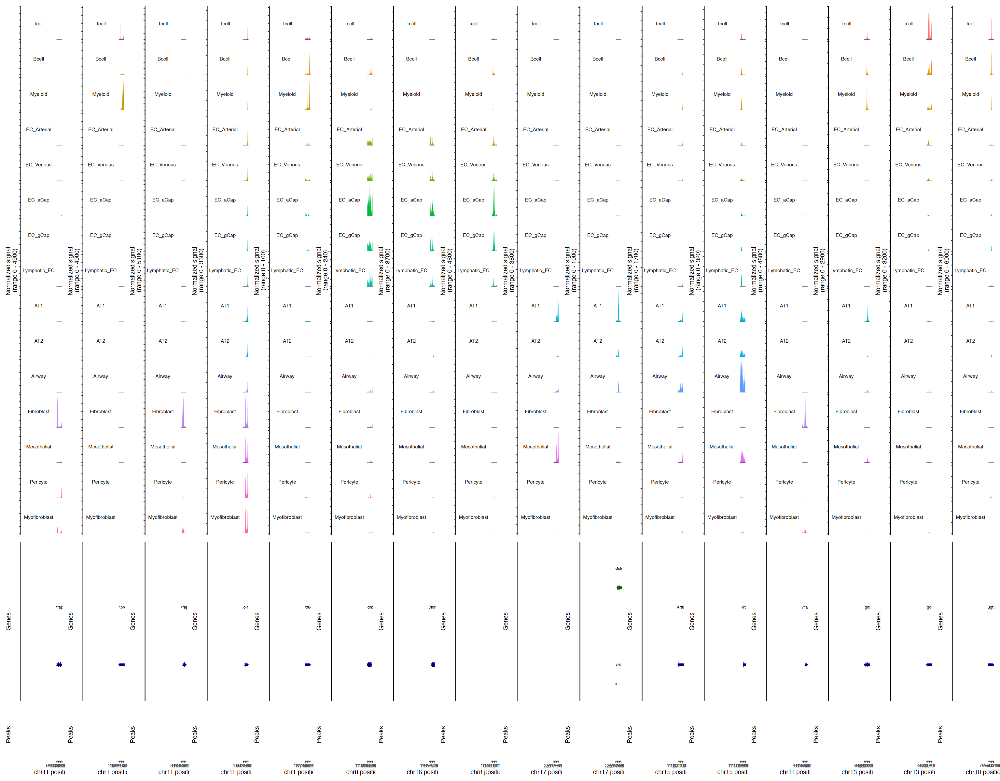

In [124]:
b=CoveragePlot(pseudoObj_cells2, 
             region = plot_region,
             group.by='group',
             #ymax='q95', 
             #window=200, 
             ncol=length(plot_region),
             extend.upstream = 1250, 
             extend.downstream = 1250)
options(repr.plot.width=1.6*length(plot_region), repr.plot.height=20)
b

In [105]:
ggsave(glue('{output_dir}/Known_gene_coverageplot1.pdf'), b,
       width=2*length(plot_region), height = 14,  dpi=600, bg='transparent')

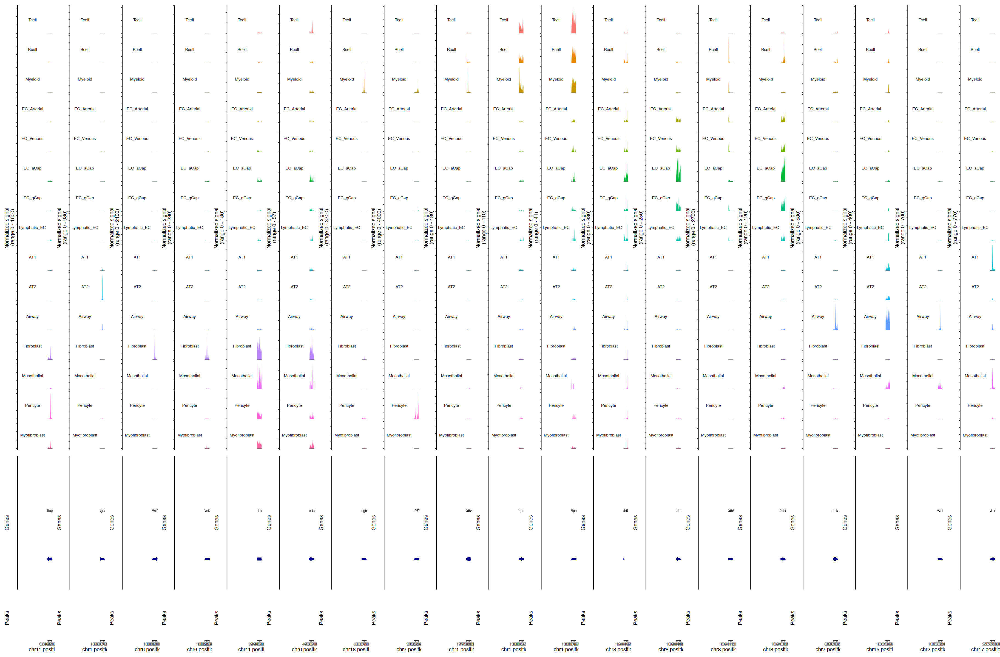

In [106]:
Non_top_peaks = top_peaks_ann_filter %>% 
    dplyr::filter(Celltype_round2%in%select_cells) %>%
    filter(gene_name%in%known_genes) %>%
    filter(distance<2000) %>%
  dplyr::filter(overlap=='Non-overlap') %>%
  group_by(Celltype_round1) %>% 
  top_n(5,-avg_log2FC) 

plot_region=unique(Non_top_peaks$gene)
b=CoveragePlot(pseudoObj_cells2, 
             region = plot_region,
             group.by='group',
             #ymax='q95', 
             #window=200, 
             ncol=length(plot_region),
             extend.upstream = 1250, 
             extend.downstream = 1250)
options(repr.plot.width=1.6*length(plot_region), repr.plot.height=20)
b

In [107]:
ggsave(glue('{output_dir}/Known_gene_coverageplot1_non.pdf'), b,
       width=2*length(plot_region), height = 14,  dpi=600, bg='transparent')

In [ ]:
pseudoObj_cells3 = subset(pseudoObj_cells, Celltype_round2%in%c('AT1'))
pseudoObj_cells3$group = pseudoObj_cells3$Celltype_round4
table(pseudoObj_cells3$group)
pseudoObj_cells3@assays$ATAC@ranges = total_cCRE_gr
pseudoObj_cells3@assays$ATAC@meta.features = data.frame('peak_group'=total_cCRE_gr$Overlap)
AT1_marker.peaks=read.csv(glue('./placeholder_analysis/round_cluster02/round2/AT1/cluster_markers_new.csv'))
colnames(AT1_marker.peaks)[c(1,4,5,6)] = c('cluster', 'avg_log2FC', 'p_val','p_val_adj')

In [187]:
tmp_region = AT1_marker.peaks %>% 
    filter(gene_name %in%c('Spock2','Nek10','Mfrp','Agt','Tldc2')) %>%
    group_by(gene_name)%>%
    top_n(5, avg_log2FC)
tmp_region$names = gsub(':','-',tmp_region$names)

In [ ]:
tmp_genes = c('chr10-60118000-60119500', tmp_region$names[c(16, # Agt
                                                12, # Mfrp
                                                4, # nek10
                                                25  # Tldc2
                                                )]
                                                )

b=CoveragePlot(pseudoObj_cells3, 
             region = tmp_genes,
             group.by='group',
             #ymax='q95', 
             #window=100, 
             peaks=TRUE,
             peaks.group.by='peak_group',
             ncol=5,
             extend.upstream = 0, 
             extend.downstream = 0) & scale_fill_manual(values = c('AT1'='#FADFC3',
                                                                     'AT1_Agt'='#A6CD48',
                                                                     'AT1_Mfrp'='#A0D6F7',
                                                                     'AT1_Nek10'='#94D3B6',
                                                                     'AT1_Tldc2'='#FDAE61'))

In [189]:
ggsave(glue('{output_dir}/Manual_Marker_gene_Coverageplot(AT1).pdf'), b,  
       width=600, height = 180, units='mm', dpi=600, bg='transparent')

In [ ]:
pseudoObj_cells4 = subset(pseudoObj_cells, Celltype_round2%in%c('AT2'))
pseudoObj_cells4$group = pseudoObj_cells4$Celltype_round4
table(pseudoObj_cells4$group)
pseudoObj_cells4@assays$ATAC@ranges = total_cCRE_gr
pseudoObj_cells4@assays$ATAC@meta.features = data.frame('peak_group'=total_cCRE_gr$Overlap)
AT2_marker.peaks=read.csv(glue('./placeholder_analysis/round_cluster02/round2/AT2/cluster_markers_new.csv'))
colnames(AT2_marker.peaks)[c(1,4,5,6)] = c('cluster', 'avg_log2FC', 'p_val','p_val_adj')


      AT2 AT2_Gfra1  AT2_Sgta 
    35205     28072      5691 

In [175]:
tmp_region = AT2_marker.peaks %>% 
    filter(gene_name %in%c('Gfra1','Sgta')) %>%
    group_by(gene_name)%>%
    top_n(5, avg_log2FC) %>% arrange(gene_name, -avg_log2FC)
tmp_region$names = gsub(':','-',tmp_region$names)

In [ ]:
tmp_genes = c('chr14-70523500-70524500', tmp_region$names[c(1,7)]
                                                )

b=CoveragePlot(pseudoObj_cells4, 
             region = tmp_genes,
             group.by='group',
             #ymax='q95', 
             window=200, 
             peaks=TRUE,
             peaks.group.by='peak_group',
             ncol=3,
             extend.upstream = 250, 
             extend.downstream = 250) & scale_fill_manual(values = c('AT2'='#FEE08B',
                                                                    'AT2_Gfra1'='#A6D96A',
                                                                    'AT2_Sgta'='#1F78B4'))

In [186]:
ggsave(glue('{output_dir}/Manual_Marker_gene_Coverageplot(AT2).pdf'), b,  
       width=360, height = 180, units='mm', dpi=600, bg='transparent')

In [ ]:
nmf_res = read.csv('./placeholder_analysis//round_cluster02/merge/NMF_meta_sample.csv')

keep_module = setdiff(1:16, c(1,2,7,10,11,13,14,15))
keep_module

tmp_nmf_score = nmf_res[, paste0('M', setdiff(1:16, c(1,2,7,10,11,13,14,15)))]
colnames(tmp_nmf_score) = paste0('M',1:ncol(tmp_nmf_score))

moudle_cell = apply(tmp_nmf_score,1,which.max)

moudle_cell = colnames(tmp_nmf_score)[moudle_cell]
names(moudle_cell) = nmf_res$X

nmf_res$cell_module = moudle_cell

nmf_umap = umap[umap$X%in%nmf_res$X, ]

nmf_umap$NMF_modules = moudle_cell[nmf_umap$X]

nmf_umap[, c('UMAP_1', 'UMAP_2')] = nmf_umap[, c('TSNE_1', 'TSNE_2')]

module_color = pal_igv()(16)
module_color = module_color[c(12,16,3,4,5,6,8,9)]
names(module_color) = colnames(tmp_nmf_score)

[1]  3  4  5  6  8  9 12 16

In [331]:
pseudoObj_cells = subset(pseudoObj_cells, cells=nmf_umap$X)
pseudoObj_cells@meta.data[nmf_umap$X,'modules'] = nmf_umap$NMF_modules
pseudoObj_cells@meta.data[is.na(pseudoObj_cells$modules), 'modules'] = 'other'
Idents(pseudoObj_cells) = factor(pseudoObj_cells$modules, paste0('M', 1:8))

In [ ]:
module_gene = read.csv('./placeholder_analysis//round_cluster02/merge/NMF_diffgene_sample.csv')

module_gene_filter = module_gene %>% filter(module%in%keep_module)

new_name = paste0('M', 1:8)
names(new_name) = as.character(keep_module)

module_gene_filter$module_name = new_name[as.character(module_gene_filter$module)]

module_gene_filter2 = module_gene_filter
# %>% 
#     filter(Gene%in%Annotation(pseudoObj_cells)$gene_name) %>%
#     filter(FDR<0.05) %>%
#     filter(!grepl('Rik?',Gene)) %>%
#     filter(!grepl('^Gm',Gene)) %>%
#     dplyr::group_by(module_name) %>%
#     dplyr::top_n(200,Z)

In [426]:
top_peaks = filter_marker %>% 
  dplyr::filter(avg_log2FC >=0.1&p_val_adj <=0.05) %>%
  group_by(cluster) %>% 
  top_n(2000,avg_log2FC)

In [427]:
colnames(top_peaks)[2:5] = c('gene', 'score','avg_log2FC', 'p_val','p_val_adj')
top_peaks_ann = add_gene_info(pseudoObj_peaks, top_peaks)

same_gene = intersect(module_gene_filter2$Gene, top_peaks_ann$gene_name)
#Hbb-bs

top_peaks_ann_filter = top_peaks_ann[top_peaks_ann$gene_name%in%same_gene, ]

top_peaks_ann_filter = merge(top_peaks_ann_filter, module_gene_filter2, by.x='gene_name', by.y='Gene')

top_peaks_ann_filter$overlap = 'Overlap'
top_peaks_ann_filter[top_peaks_ann_filter$gene%in%diff_peak_name, 'overlap'] = 'Non-overlap'

# CREchanges over time

## CREchange pattern classification

In [6]:
'./placeholder_analysis/round_cluster02/cCRE/all_time'

[1] "./placeholder_root/mouse_lung_project/pycode/round_cluster02/cCRE/all_time"

In [11]:
time_mat = load_peak('all_time')
time_mat = as.matrix(time_mat)

In [254]:
#time_mat = time_mat/rowSums(time_mat)

In [ ]:
expr_smoothed = time_mat#t(apply(time_mat, 1, function(x)(x-min(x))/(max(x)-min(x))))

expr_smoothed_glm = t(apply(expr_smoothed, 1, function(aa){
    tmp_m = glm("y~poly(x,3)", data=data.frame(x=1:15, y=aa))
    predict(tmp_m)
}))

expr_smoothed_glm = t(apply(expr_smoothed_glm, 1, function(x)(x-min(x))/(max(x)-min(x))))

In [191]:
dim(expr_smoothed_glm)

[1] 713987     15

In [8]:
set.seed(1234)
kmean_res = kmeans(expr_smoothed_glm, centers=20)

cre_label =  kmean_res$cluster

In [9]:
cre_label[cre_label==20] = 15
cre_label[cre_label==9] = 5
cre_label[cre_label==8] = 2
cre_label[cre_label==16] = 13

cre_label[cre_label==13] = 1
cre_label[cre_label==19] = 10
cre_label[cre_label==12] = 7
cre_label[cre_label==15] = 5


In [10]:
sort(unique(cre_label))

[1]  1  2  3  4  5  6  7 10 11 14 17 18

In [11]:
cre_label = factor(cre_label, sort(unique(cre_label)))
cre_label = as.numeric(cre_label)

In [ ]:
# calculate mean curve for each cluster
cluster_means <- t(sapply(1:length(unique(cre_label)), function(i) {
  colMeans(expr_smoothed_glm[cre_label == i, ])
}))

# calculate residual sum of squares for each gene vs cluster mean(RSS)
rss <- sapply(1:nrow(expr_smoothed_glm), function(i) {
  cluster_id <- cre_label[i]
  sum((expr_smoothed_glm[i, ] - cluster_means[cluster_id, ])^2)
})

# define outlier threshold(for example:take within each clusterRSS75%quantile)
thresholds <- tapply(rss, cre_label, function(x) quantile(x, 0.75))

# mark outliers
outliers <- sapply(1:nrow(expr_smoothed_glm), function(i) {
  rss[i] > thresholds[cre_label[i]]
})

In [13]:
expr_smoothed_glm_filter = expr_smoothed_glm[!outliers,]
cre_label_filter = cre_label[!outliers]

In [30]:
dim(expr_smoothed_glm_filter)

[1] 535489     15

In [14]:
names(cre_label_filter) = rownames(expr_smoothed_glm_filter)

In [200]:
'chr3-92440786-92441287' %in% names(cre_label_filter)

[1] TRUE

In [201]:
cre_label_filter['chr3-92440786-92441287']

chr3-92440786-92441287 
                     1

In [18]:
saveRDS(list('cre_label_filter'=cre_label_filter,
             'expr_smoothed_glm_filter'=expr_smoothed_glm_filter,
             'expr_smoothed_glm' = expr_smoothed_glm,
             'cre_label'=cre_label,
             'new_order' = c(

                            1,7,6, # down
                            
                            11,10,9, # down-up 
                                4,8,3, # up-down
                                12,2,5 # up

                        )
            ), 
             './placeholder_analysis/round_cluster02/cCRE/CRE_modes.rds')

In [7]:
tmp_rds = readRDS('./placeholder_analysis/round_cluster02/cCRE/CRE_modes.rds')

In [8]:
cre_label_filter = tmp_rds$cre_label_filter
expr_smoothed_glm_filter = tmp_rds$expr_smoothed_glm_filter
expr_smoothed_glm = tmp_rds$expr_smoothed_glm
cre_label = tmp_rds$cre_label
new_order = tmp_rds$new_order

In [10]:
table(cre_label_filter)

cre_label_filter
     1      2      3      4      5      6      7      8      9     10     11 
133747  54541  20314   7229 119933  32660  59227  40362  14998  16942  18498 
    12 
 17038 

In [212]:
133747+59227+32660
14998+16942+18498
7229+40362+20314
17038+54541+119933

[1] 225634

[1] 50438

[1] 67905

[1] 191512

In [30]:
cre_label_filter_df = as.data.frame(cre_label_filter)
cre_label_filter_df$CRE = rownames(cre_label_filter_df)
colnames(cre_label_filter_df) = c('Cluster', 'CRE')


In [31]:
head(cre_label_filter_df)

,Cluster,CRE
,<dbl>,<chr>
chr1-3012479-3012980,12,chr1-3012479-3012980
chr1-3057426-3057927,10,chr1-3057426-3057927
chr1-3094833-3095334,8,chr1-3094833-3095334
chr1-3100134-3100635,2,chr1-3100134-3100635
chr1-3119836-3120337,8,chr1-3119836-3120337
chr1-3121246-3121747,2,chr1-3121246-3121747


In [15]:
tmp_srt <- readRDS(glue('./placeholder_analysis/round_cluster02/merge/pseudoObj_srt.rds'))

In [18]:
srt_close_genes = ClosestFeature(tmp_srt, StringToGRanges(cre_label_filter_df$CRE))

In [21]:
rownames(srt_close_genes) = srt_close_genes$query_region

In [19]:
head(srt_close_genes)

,tx_id,gene_name,gene_id,gene_biotype,type,closest_region,query_region,distance
,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<int>
ENSMUSE00000866652,ENSMUST00000162897,Xkr4,ENSMUSG00000051951,protein_coding,exon,chr1-3205901-3207317,chr1-3012479-3012980,192920
ENSMUSE00000866652.1,ENSMUST00000162897,Xkr4,ENSMUSG00000051951,protein_coding,exon,chr1-3205901-3207317,chr1-3057426-3057927,147973
ENSMUSE00000866652.2,ENSMUST00000162897,Xkr4,ENSMUSG00000051951,protein_coding,exon,chr1-3205901-3207317,chr1-3094833-3095334,110566
ENSMUSE00000866652.3,ENSMUST00000162897,Xkr4,ENSMUSG00000051951,protein_coding,exon,chr1-3205901-3207317,chr1-3100134-3100635,105265
ENSMUSE00000866652.4,ENSMUST00000162897,Xkr4,ENSMUSG00000051951,protein_coding,exon,chr1-3205901-3207317,chr1-3119836-3120337,85563
ENSMUSE00000866652.5,ENSMUST00000162897,Xkr4,ENSMUSG00000051951,protein_coding,exon,chr1-3205901-3207317,chr1-3121246-3121747,84153


In [32]:
cre_label_filter_df[,c('gene_name')] = srt_close_genes[cre_label_filter_df$CRE, c('gene_name')]

In [33]:
head(cre_label_filter_df)

,Cluster,CRE,gene_name
,<dbl>,<chr>,<chr>
chr1-3012479-3012980,12,chr1-3012479-3012980,Xkr4
chr1-3057426-3057927,10,chr1-3057426-3057927,Xkr4
chr1-3094833-3095334,8,chr1-3094833-3095334,Xkr4
chr1-3100134-3100635,2,chr1-3100134-3100635,Xkr4
chr1-3119836-3120337,8,chr1-3119836-3120337,Xkr4
chr1-3121246-3121747,2,chr1-3121246-3121747,Xkr4


In [34]:
write.table(cre_label_filter_df, 
            file=glue('{output_dir}/CRE_kmeans12_cluster.txt'),
            sep='\t', quote=F, row.names=F)

In [202]:
options(repr.plot.width=6, repr.plot.height=6)
ht = Heatmap(expr_smoothed_glm_filter,
       show_row_names=F, show_column_names=F,
        cluster_columns=F, cluster_rows=F,
        row_split = cre_label_filter
       )
pdf(glue('{output_dir}/CREchange_pattern_clustering_heatmap2.pdf'), width=4, height=6)
draw(ht)
dev.off()

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

In [700]:
all_p = list()
for(i in unique(cre_label)){
    tmp_cluster = i
    tmp_data=expr_smoothed_glm_filter[cre_label_filter==tmp_cluster, ]
    tmp_data_mean = colMeans(tmp_data)

    tmp_trends = data.frame(Var2=seq(1,15), value=tmp_data_mean)
    
    set.seed(1234)
    sample_cre = sample(rownames(tmp_data), min(nrow(tmp_data),1000))
    tmp_data = tmp_data[sample_cre,]
    colnames(tmp_data) = 1:15
    a = melt(tmp_data) %>%
        ggplot(aes(x=Var2, y=value))+
        geom_line(aes(group=Var1), color='black', size=0.1, alpha=0.1)+
        # geom_smooth(aes(group=Var1),color='gray', se=F,method = 'glm',
        #             formula = 'y~poly(x,3)', size=0.1, alpha=0.2)+
        geom_smooth(aes(group=1),color='red', se=F,method = 'glm', formula = 'y~poly(x,3)')+
        # geom_smooth(,color='red', se=F,method = 'gam',formula = y ~ s(x, k=6), data=tmp_trends)+
        labs(title=i)+
        theme_bw()+
        theme()
    all_p[[i]] = a
}


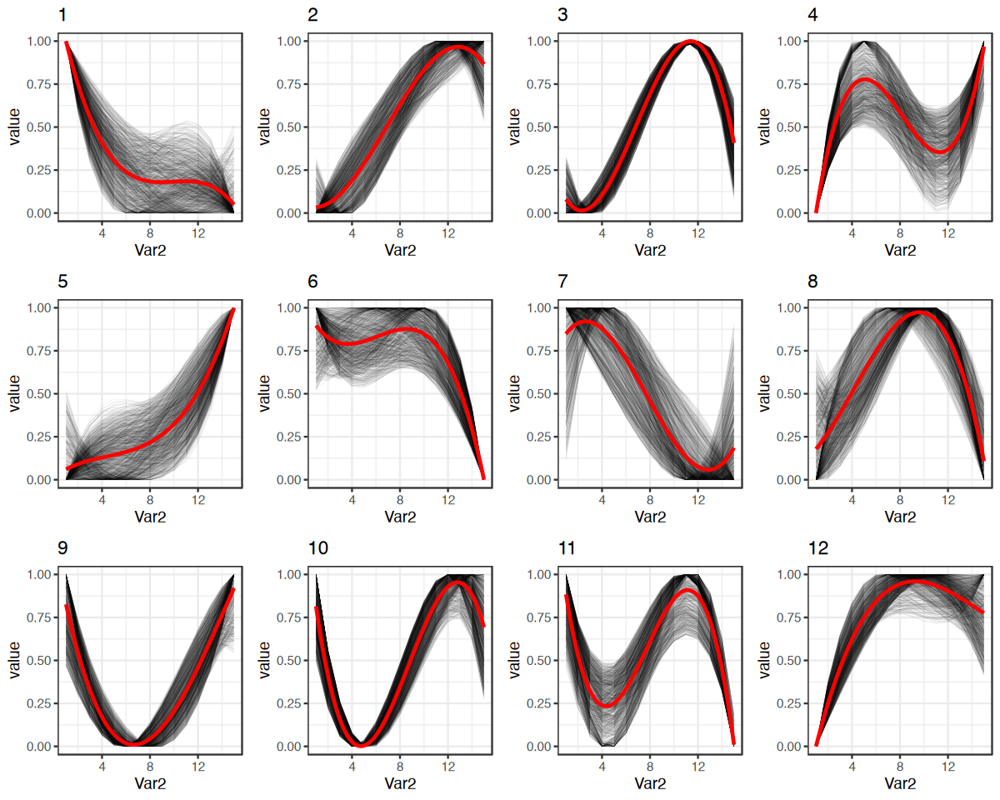

In [701]:
options(repr.plot.width=10, repr.plot.height=8)
cowplot::plot_grid(plotlist = all_p, ncol=4)

In [33]:
#sort
new_order = c(
    #2,5,8,9,15,20,18, # up
    1,3,4,5,17,
    #1,6,7,12,13,16, # down
    8,9,13,14,15,19,20,
    #3,10,19, # up-down
    2,12,
    #11,14, # down-up 
    10, 11, 16,
    18,6,7 # wave
)

new_order = c(
    12,2,5, # up
    1,7,6, # down
    8,3, # up-down
    10,9, # down-up 
    4,11 # wave
)

In [703]:
length(new_order)

[1] 12

In [205]:
options(repr.plot.width=6, repr.plot.height=6)
ht = Heatmap(expr_smoothed_glm_filter,
       show_row_names=F, show_column_names=F,
        cluster_columns=F, cluster_rows=F,
        row_split = factor(cre_label_filter,new_order)
       )
pdf(glue('{output_dir}/CREchange_pattern_clustering_heatmap.pdf'), width=4, height=6)
draw(ht)
dev.off()

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

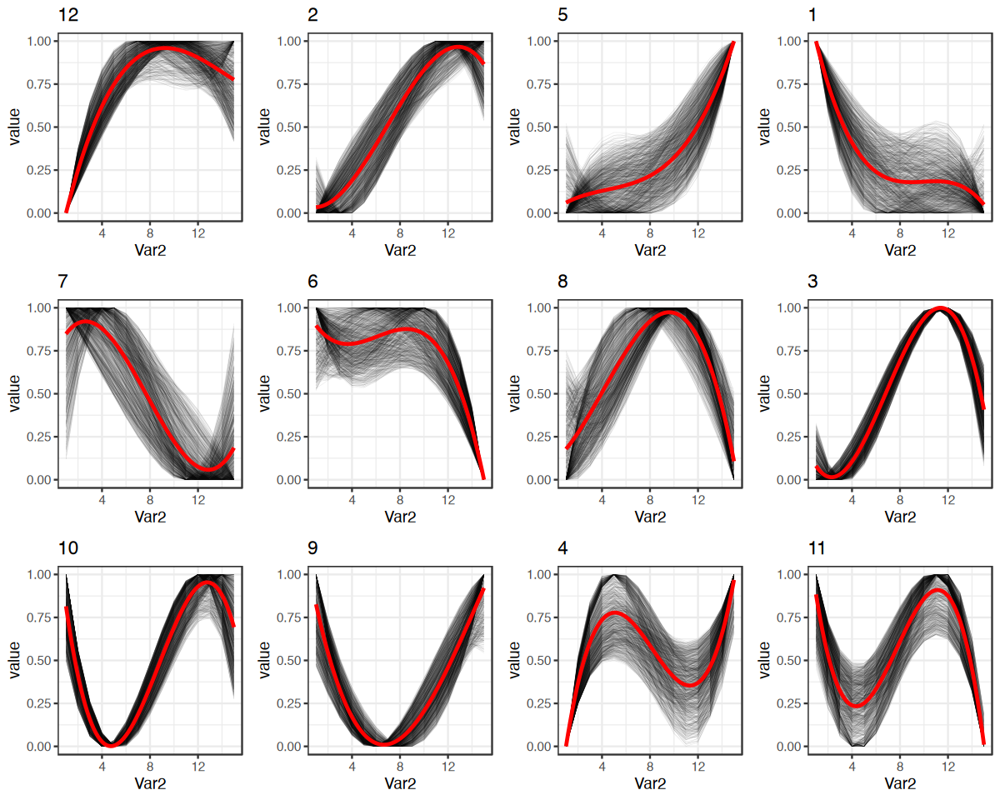

In [705]:
options(repr.plot.width=10, repr.plot.height=8)
cowplot::plot_grid(plotlist = all_p[new_order], ncol=4)

In [ ]:
#sort

new_order = c(

    1,7,6, # down
    
    11,10,9, # down-up 
        4,8,3, # up-down
        12,2,5 # up

)

In [342]:
# cre_label_filter2 = cre_label_filter
# cre_label_filter2[cre_label_filter2==18] = 6
# cre_label_filter2[cre_label_filter2==19] = 18
# cre_label_filter2[cre_label_filter2==20] = 19

# cre_label_filter2[cre_label_filter2==10] = 7
# cre_label_filter2[cre_label_filter2>10] = cre_label_filter2[cre_label_filter2>10]-1

# new_order = c(
#     4,3,5,16,1,
#     9,14,8,18,13,17,12,
#     11,2,
#     15,10,
#     6,7 # wave
# )

In [207]:
options(repr.plot.width=6, repr.plot.height=6)
ht = Heatmap(expr_smoothed_glm_filter,
             col= circlize::colorRamp2(c(0,0.5,1),
                                       c("#4b92cb", "#ffffff", "#d35c5c")),
       show_row_names=F, show_column_names=F,
        cluster_columns=F, cluster_rows=F,
             border_gp=gpar(col='black'),
             row_gap=unit(0.2,'mm'),
        row_split = factor(cre_label_filter,new_order)
       )
pdf(glue('{output_dir}/CREchange_pattern_clustering_heatmap.pdf'), width=4, height=6)
draw(ht)
dev.off()

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



pdf 
  2

In [708]:
all_p = list()
for(i in new_order){
    tmp_cluster = i
    tmp_data=expr_smoothed_glm_filter[cre_label_filter==tmp_cluster, ]
    tmp_data_mean = colMeans(tmp_data)
    tmp_trends = data.frame(Var2=seq(1,15), value=tmp_data_mean)
    
    set.seed(1234)
    sample_cre = sample(rownames(tmp_data), min(nrow(tmp_data),1000))
    tmp_data = tmp_data[sample_cre,]
    colnames(tmp_data) = 1:15
    a = melt(tmp_data) %>%
        ggplot(aes(x=Var2, y=value))+
        geom_line(aes(group=Var1), color='black', size=0.1, alpha=0.1)+
        # geom_smooth(aes(group=Var1),color='gray', se=F,method = 'glm',
        #             formula = 'y~poly(x,3)', size=0.1, alpha=0.2)+
        geom_smooth(aes(group=1),color='red', se=F,method = 'glm', formula = 'y~poly(x,3)')+
        # geom_smooth(,color='red', se=F,method = 'gam',formula = y ~ s(x, k=6), data=tmp_trends)+
        labs(title=i)+
        theme_bw()+
        theme()
    all_p[[i]] = a
}


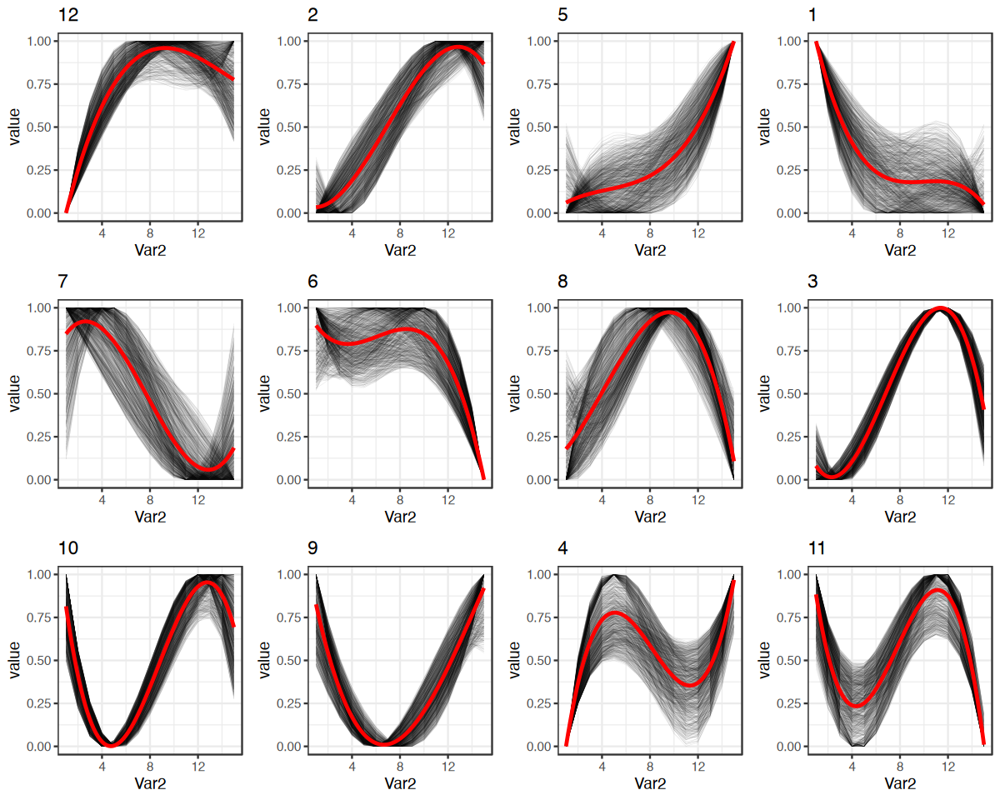

In [709]:
options(repr.plot.width=10, repr.plot.height=8)
cowplot::plot_grid(plotlist = all_p[new_order], ncol=4)

In [645]:
head(melt(tmp_data))

,Var1,Var2,value
,<fct>,<int>,<dbl>
1,chr17-7577194-7577695,1,0.6177134
2,chr18-6950006-6950507,1,0.3891195
3,chr16-63632459-63632960,1,0.6462336
4,chr18-14000936-14001437,1,0.6363884
5,chr2-13303323-13303824,1,0.9203753
6,chr1-90734074-90734575,1,0.7542767


In [276]:
all_plot_line_data = c()
#kk=1
#col_fun = circlize::colorRamp2(c(1,5), c('#f8b484', '#981c1c'))
for(i in new_order){
    tmp_cluster = i
    tmp_data=expr_smoothed_glm_filter[cre_label_filter==tmp_cluster, ]
    tmp_data_mean = colMeans(tmp_data)
    tmp_trends = data.frame(Var2=seq(1,15), value=tmp_data_mean)
    set.seed(1234)
    sample_cre = sample(rownames(tmp_data), min(nrow(tmp_data),1000))
    tmp_data = tmp_data[sample_cre,]
    colnames(tmp_data) = 1:15
    tmp_data = melt(tmp_data)
    tmp_data$cluster=tmp_cluster
    all_plot_line_data = rbind(all_plot_line_data, tmp_data)
}


In [60]:
#sort
new_order = c(
    4,3,5,17,1,
    9,15,8,20,14,19,13,
    12,2,
    16,11,10,
    18,6,7 # wave
)
cols_manual = c()
col_fun = circlize::colorRamp2(c(1,5), c('#f8b484', '#981c1c'))
cols_manual = c(cols_manual, col_fun(1:5))

col_fun = circlize::colorRamp2(c(1,7), c('#BFDBFE', '#1E3a8a'))
cols_manual = c(cols_manual, col_fun(1:7))

col_fun = circlize::colorRamp2(c(1,2), c('#ffe08b', '#e65100'))
cols_manual = c(cols_manual, col_fun(1:2))

col_fun = circlize::colorRamp2(c(1,3), c('#E1BEE7', '#4a148c'))
cols_manual = c(cols_manual, col_fun(1:3))

col_fun = circlize::colorRamp2(c(1,3), c('#c8e6c9', '#1b5e20'))
cols_manual = c(cols_manual, col_fun(1:3))

names(cols_manual) = new_order
cols_manual

#sort
new_order = c(
    12,2,5, # up
    1,7,6, # down
    4,8,3, # up-down
    11,10,9 # down-up 
)
new_order = c(

    1,7,6, # down
    
    11,10,9, # down-up 
        4,8,3, # up-down
        12,2,5 # up

)
cols_manual = c()
col_fun = circlize::colorRamp2(c(1,3), c('#BFDBFE', '#1E3a8a'))
cols_manual = c(cols_manual, col_fun(1:3))
col_fun = circlize::colorRamp2(c(1,3), c('#E1BEE7', '#4a148c'))
cols_manual = c(cols_manual, col_fun(1:3))
col_fun = circlize::colorRamp2(c(1,3), c('#ffe08b', '#e65100'))
cols_manual = c(cols_manual, col_fun(1:3))

col_fun = circlize::colorRamp2(c(1,3), c('#f8b484', '#981c1c'))
cols_manual = c(cols_manual, col_fun(1:3))




#col_fun = circlize::colorRamp2(c(1,2), c('#c8e6c9', '#1b5e20'))
#cols_manual = c(cols_manual, col_fun(1:2))

names(cols_manual) = new_order
cols_manual



4           3           5          17           1           9 
"#F8B484FF" "#E19068FF" "#CA6C4DFF" "#B14734FF" "#981C1CFF" "#BFDBFEFF" 
         15           8          20          14          19          13 
"#A6BEEAFF" "#8DA1D6FF" "#7486C3FF" "#5B6BB0FF" "#3F529DFF" "#1E3A8AFF" 
         12           2          16          11          10          18 
"#FFE08BFF" "#E65100FF" "#E1BEE7FF" "#9869B9FF" "#4A148CFF" "#C8E6C9FF" 
          6           7 
"#72A071FF" "#1B5E20FF"

1           7           6          11          10           9 
"#BFDBFEFF" "#7486C3FF" "#1E3A8AFF" "#E1BEE7FF" "#9869B9FF" "#4A148CFF" 
          4           8           3          12           2           5 
"#FFE08BFF" "#F89C4BFF" "#E65100FF" "#F8B484FF" "#CA6C4DFF" "#981C1CFF"

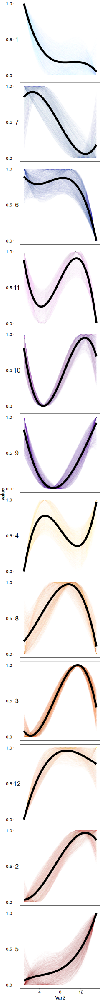

In [345]:

plot_line = all_plot_line_data %>%
    mutate(cluster=factor(cluster, new_order)) %>%
    ggplot(aes(x=Var2, y=value))+
    geom_line(aes(group=Var1, color=cluster), size=0.05, alpha=0.05)+
    geom_smooth(aes(group=1),color='black', se=F,method = 'glm', formula = 'y~poly(x,3)')+
    #geom_text(aes_string(x=13,y=0.25, label=i), inherit.aes = F)+
    facet_wrap(~cluster, ncol=1,strip.position = 'left')+
    scale_color_manual(values = cols_manual, )+
    theme_bw()+
    scale_y_continuous(breaks=c(0,0.5,1))+
    theme(axis.title=element_blank(),
          axis.text.x=element_blank(),
         panel.spacing=unit(0, 'lines')
         )+
    mytheme+
    theme(legend.position = 'none')
options(repr.plot.width=2, repr.plot.height=20)
plot_line

### statistical_pattern_cell_proportion

In [20]:
celltime_mat = load_peak('all_celltime_markers')
celltime_mat = as.matrix(celltime_mat)

In [89]:
celltime_mat[1:3,1:3]

,AT1:P0,AT1:P1,AT1:P10
chr1-3012479-3012980,0,0,0
chr1-3057426-3057927,0,0,0
chr1-3059441-3059942,0,0,0


In [38]:
names(cre_label_filter) = rownames(expr_smoothed_glm_filter)

In [90]:
fast_row_cor <- function(x, y){
  if(!all(dim(x)==dim(y))) stop("x and y must have same dim")
  T <- ncol(x)
  mx <- rowMeans(x, na.rm=TRUE)
  my <- rowMeans(y, na.rm=TRUE)
  xm <- x - mx
  ym <- y - my
  num <- rowSums(xm * ym, na.rm=TRUE)
  sx2 <- rowSums(xm^2, na.rm=TRUE)
  sy2 <- rowSums(ym^2, na.rm=TRUE)
  denom <- sqrt(sx2 * sy2)
  r <- num / denom
  # handle divisions by zero
  r[denom == 0] <- NA_real_
  # t-statistic and two-sided p
  tstat <- r * sqrt((T - 2) / pmax(1e-12, 1 - r^2))
  pval <- 2 * pt(-abs(tstat), df = T - 2)
  data.frame(r = r, p.value = pval, row.names = rownames(x))
}


In [91]:
all_cell_res =c()
for(tmp_mode in new_order){
    message(tmp_mode)
    tmp_cre = names(cre_label_filter[cre_label_filter==tmp_mode])
    tmp_glm = time_mat[tmp_cre,]

    tmp_cor_df = c()
    for(i in unique(umap$Celltype_round4)){
        tmp_col = paste0(i,':',time_levels)
        if(length(setdiff(tmp_col, colnames(celltime_mat)))==0){
            tmp_peaks = celltime_mat[tmp_cre,tmp_col]
            tmp_cor = fast_row_cor(tmp_glm, tmp_peaks)
            tmp_cor_df = cbind(tmp_cor_df, tmp_cor$r)
            colnames(tmp_cor_df)[ncol(tmp_cor_df)] = i
        }
    }
    tmp_cor_df[is.na(tmp_cor_df)] = 0
    cre_from_cells = colnames(tmp_cor_df)[apply(tmp_cor_df, 1, which.max)]
    cre_from_cells = as.data.frame.table(table(cre_from_cells))

    cre_from_cells$mode=tmp_mode
    cre_from_cells$all=length(tmp_cre)
    all_cell_res = rbind(all_cell_res, cre_from_cells)
}


1

7

6

11

10

9

4

8

3

12

2

5



In [92]:
all_cell_res$prop = all_cell_res$Freq/all_cell_res$all

In [24]:
cell_meta2 = cell_meta[ ,c('Celltype_round1','Celltype_round4')] %>% unique()
rownames(cell_meta2) = cell_meta2$Celltype_round4

In [94]:
all_cell_res$Celltype_round1 = cell_meta2[all_cell_res$cre_from_cells, 'Celltype_round1']

In [ ]:
write.table(all_cell_res, glue('{output_dir}/CREpattern_subcluster_correlation.txt'), sep='\t', quote = F, row.names = F)

In [41]:
all_cell_res = read.table(glue('{output_dir}/CREpattern_subcluster_correlation.txt'), sep='\t', header = T)

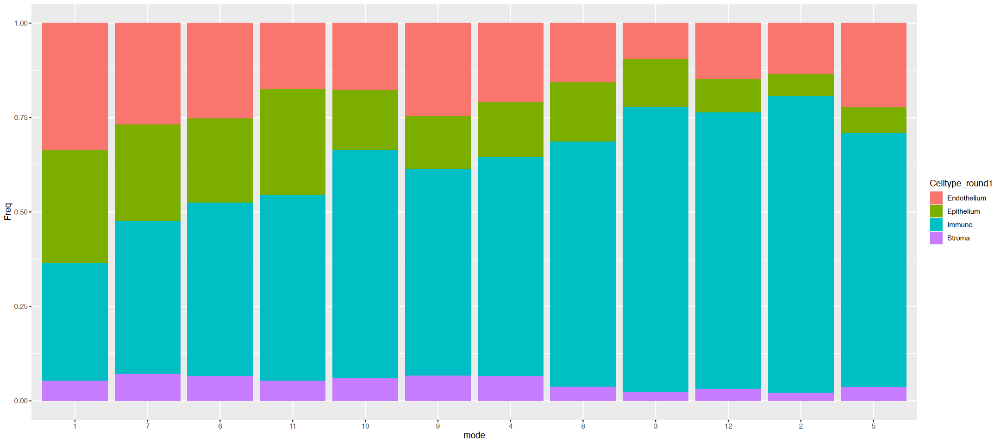

In [44]:
options(repr.plot.width=18, repr.plot.height=8)
all_cell_res %>%
    mutate(mode=factor(mode, new_order)) %>%
    ggplot(aes(x=mode, y=Freq, fill=Celltype_round1))+
    geom_bar(stat = 'identity', position = 'fill')

`summarise()` has grouped output by 'mode'. You can override using the
`.groups` argument.


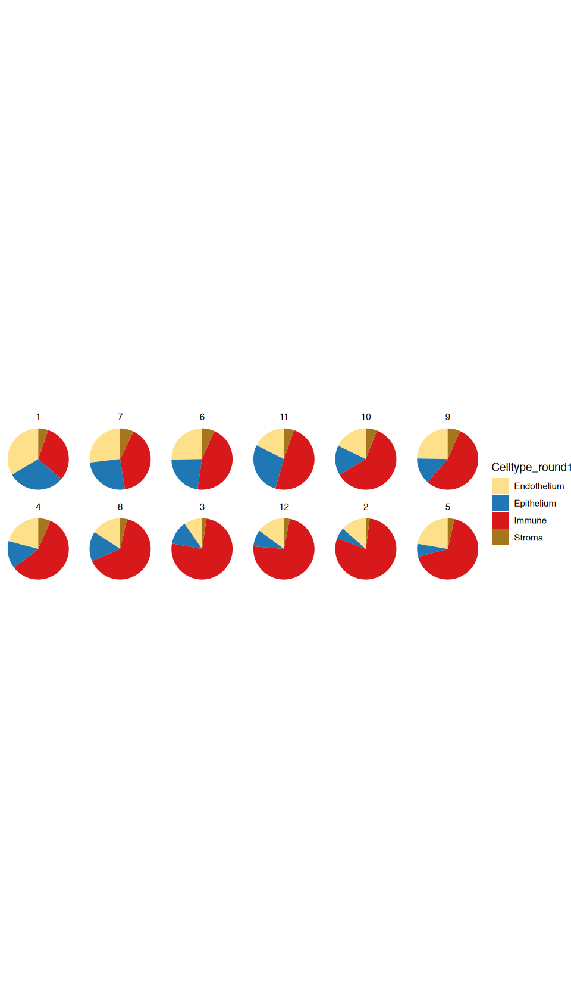

In [58]:
a=all_cell_res %>%
    group_by(mode,Celltype_round1) %>%
    dplyr::summarise(prop=sum(prop)) %>%
    mutate(mode=factor(mode, new_order))  %>%
    ggplot(aes(x="", y=prop, fill=Celltype_round1))+
    geom_bar(stat = 'identity',width = 1, position = 'fill')+
    facet_wrap(~mode, nrow=2)+
    coord_polar("y", start=0)+
    theme_void()+
    scale_fill_manual(values = celltype_round1_color)
a
ggsave(glue('{output_dir}/CREpattern_major_cluster_proportion2.pdf'),a,
       width=180, height=100, units='mm')

`summarise()` has grouped output by 'mode'. You can override using the
`.groups` argument.


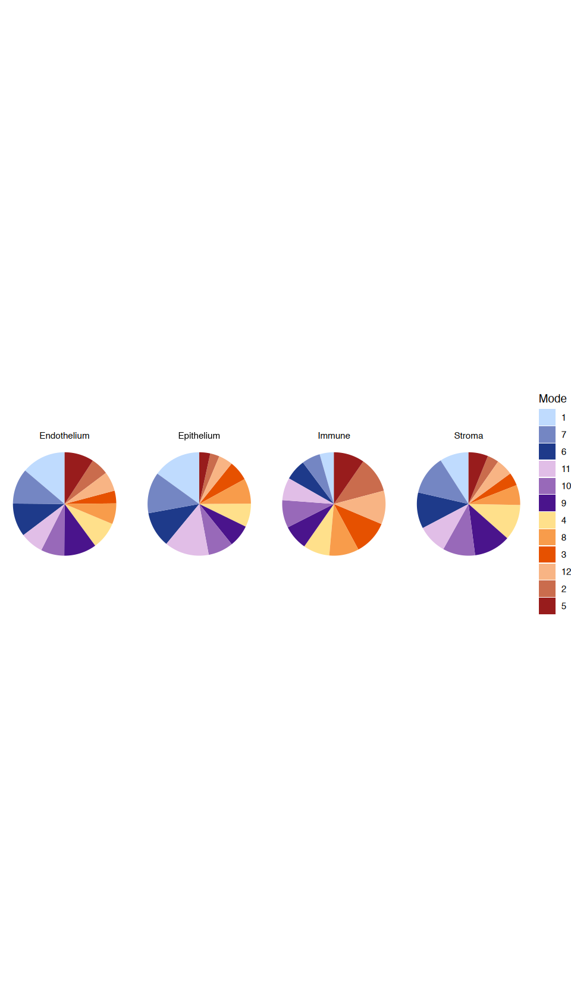

In [61]:
a = all_cell_res %>%
    group_by(mode,Celltype_round1) %>%
    dplyr::summarise(prop=sum(prop)) %>%
    mutate(mode=factor(mode, new_order))  %>%
    ggplot(aes(x="", y=prop, fill=mode))+
      geom_bar(width = 1, stat = "identity")+
      coord_polar("y", start=0)+
      facet_wrap("~ Celltype_round1",ncol = 4, scales = 'free') +
      #geom_text(aes(y = ypos, label = paste0(round(percent,1)*100,'%')), 
      #          size=5,color='white', data=label_data)+
      theme_void()+
      scale_fill_manual(values = cols_manual,name='Mode')+
      #labs(title = 'Non-overlap cCREs') +
      theme( plot.title = element_text(hjust = 0.5))
a
ggsave(glue('{output_dir}/CREpattern_major_cluster_proportion3.pdf'),a,
       width=180, height=140, units='mm')

In [46]:
all_cell_res2 = all_cell_res %>%
    group_by(mode) %>%
    top_n(5,Freq)

In [47]:
all_cell_res2

cre_from_cells,Freq,mode,all,prop,Celltype_round1
<chr>,<int>,<int>,<int>,<dbl>,<chr>
AT1_Mfrp,14928,1,133747,0.11161372,Endothelium
AT2_Gfra1,6289,1,133747,0.04702162,Endothelium
EC_early,17039,1,133747,0.12739725,Epithelium
EC_gCap_Kit,6103,1,133747,0.04563093,Epithelium
EC_Vwf,6151,1,133747,0.04598982,Immune
AT1_Mfrp,3654,7,59227,0.06169484,Endothelium
EC_early,5309,7,59227,0.08963817,Epithelium
EC_Vwf,1812,7,59227,0.03059415,Immune
Myeloid_Macorphage_Ccl20,3042,7,59227,0.05136171,Immune


In [48]:
all_cell_res_mat = acast(all_cell_res, cre_from_cells~mode, value.var = 'prop', fill=0)

In [49]:
new_celltype = read.csv('./placeholder_analysis/round_cluster02/merge/celltype_modify.csv')
rownames(new_celltype) = new_celltype$Celltype_round4

new_celltype$modify_name = new_celltype$Celltype_round4_new
new_celltype$new_name = paste0(new_celltype$modify_name,'.', new_celltype$cluster_num)
rownames(new_celltype) = new_celltype$Celltype_round4

In [53]:
rownames(all_cell_res_mat) = new_celltype[rownames(all_cell_res_mat), 'new_name']

agg_record_135838331 
                   2

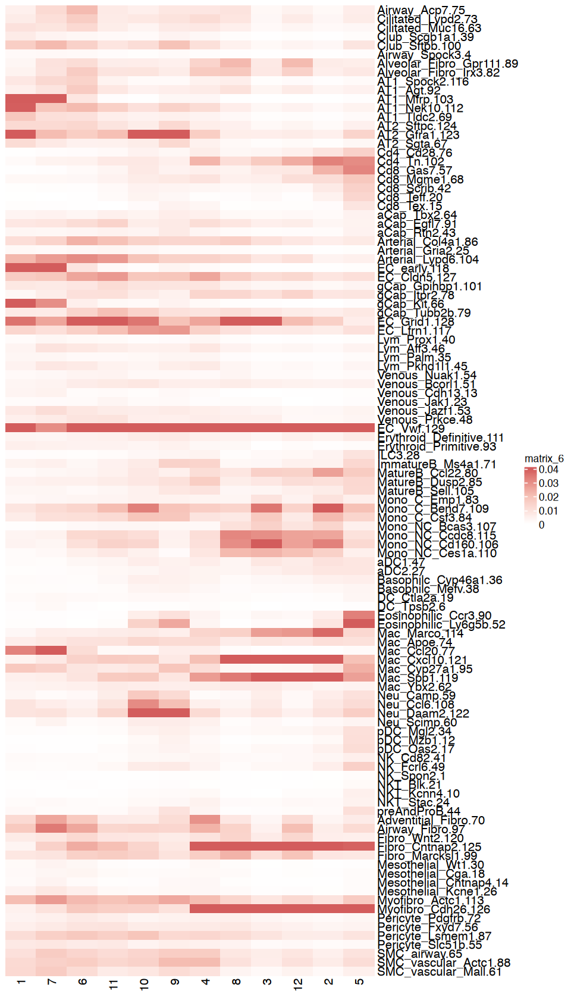

In [55]:
options(repr.plot.width=8, repr.plot.height=14)
Heatmap(all_cell_res_mat[,new_order], 
        #col=circlize::colorRamp2(c(-2,-1,0,1,2), c("#4b92cb", "#c7dcef", "#ffffff", "#f6c2b7", "#d35c5c")),
        col=circlize::colorRamp2(c(0,0.02,0.04), c("#ffffff", "#f6c2b7", "#d35c5c")),
        cluster_rows=F, cluster_columns=F,
        )
pdf(glue('{output_dir}/CREpattern_cell_proportion_correlation2.pdf'), width = 8,height = 14)
Heatmap(all_cell_res_mat[,new_order], 
        #col=circlize::colorRamp2(c(-2,-1,0,1,2), c("#4b92cb", "#c7dcef", "#ffffff", "#f6c2b7", "#d35c5c")),
        col=circlize::colorRamp2(c(0,0.02,0.04), c("#ffffff", "#f6c2b7", "#d35c5c")),
        cluster_rows=F, cluster_columns=F,
        )
dev.off()

In [220]:
all_cell_res =c()
for(tmp_mode in new_order){
    message(tmp_mode)
    tmp_cre = names(cre_label_filter[cre_label_filter==tmp_mode])
    tmp_glm = expr_smoothed_glm_filter[tmp_cre,]
    tmp_glm = colMeans(tmp_glm)
    for(i in unique(umap$Celltype_round4)){
        tmp_col = paste0(i,':',time_levels)
        if(length(setdiff(tmp_col, colnames(celltime_mat)))==0){
            tmp_peaks = celltime_mat[tmp_cre,tmp_col]
            tmp_peaks = colMeans(tmp_peaks)
            ct = cor.test(tmp_glm, tmp_peaks)
            tmp_cor = data.frame(ct$estimate, ct$p.value)
            tmp_cor$mode=tmp_mode
            tmp_cor$celltype=i
            all_cell_res = rbind(all_cell_res, tmp_cor)
        }
    }
}


1

7

6

11

10

9

4

8

3

12

2

5



In [221]:
all_cell_res_cor = reshape2::acast(all_cell_res, celltype~mode, value.var = 'ct.estimate')
all_cell_res_pval = reshape2::acast(all_cell_res, celltype~mode, value.var = 'ct.p.value')

In [88]:
table(apply(all_cell_res_cor,1, which.max))

ERROR: Error: object 'all_cell_res_cor' not found


In [237]:
all_cell_res_pval_str = all_cell_res_pval
all_cell_res_pval_str[all_cell_res_pval>=0.05] = ''
all_cell_res_pval_str[all_cell_res_pval<0.05] = ''
all_cell_res_pval_str[all_cell_res_pval<0.01] = '*'
all_cell_res_pval_str[all_cell_res_pval<0.001] = '**'
all_cell_res_pval_str[all_cell_res_cor<0] = ''


In [299]:
#all_cell_res_cor[all_cell_res_pval>=0.05] = 0
#all_cell_res_cor[all_cell_res_cor<0] = 0

In [245]:
round4_color = readRDS('./placeholder_analysis/round_cluster02/merge/round4_color.rds')
cluster_num = readRDS('./placeholder_analysis/round_cluster02/merge/round4_cluster_num.rds')

In [246]:
all_cell_res$label = cluster_num[all_cell_res$celltype]

In [247]:
tmp_d = all_cell_res %>%
     dplyr::filter(ct.estimate>0,ct.p.value<0.01) %>% as.data.frame()%>%
     mutate(mode=factor(mode, new_order)) 
tmp_d$row_id = seq_len(nrow(tmp_d))

relative_cell_plot=  tmp_d%>%
     ggplot(aes(y=Celltype_round1,  fill=celltype))+
    geom_bar(aes(row_id=row_id),stat='count', color='black', size=0.1, width=0.8)+
    facet_wrap(~mode, ncol=1)+
    scale_fill_manual(values = round4_color)+
    theme_bw()+
    theme(strip.background = element_blank(),
          panel.grid=element_blank(),
         strip.text=element_blank(),
         #axis.text.y=element_blank(),
         axis.title.y=element_blank())+
    NoLegend()
xx = ggplot_build(relative_cell_plot)

In [249]:
tmp_d$x_pos[xx$data[[1]]$row_id] = xx$data[[1]]$x
tmp_d$y_pos[xx$data[[1]]$row_id] = xx$data[[1]]$y


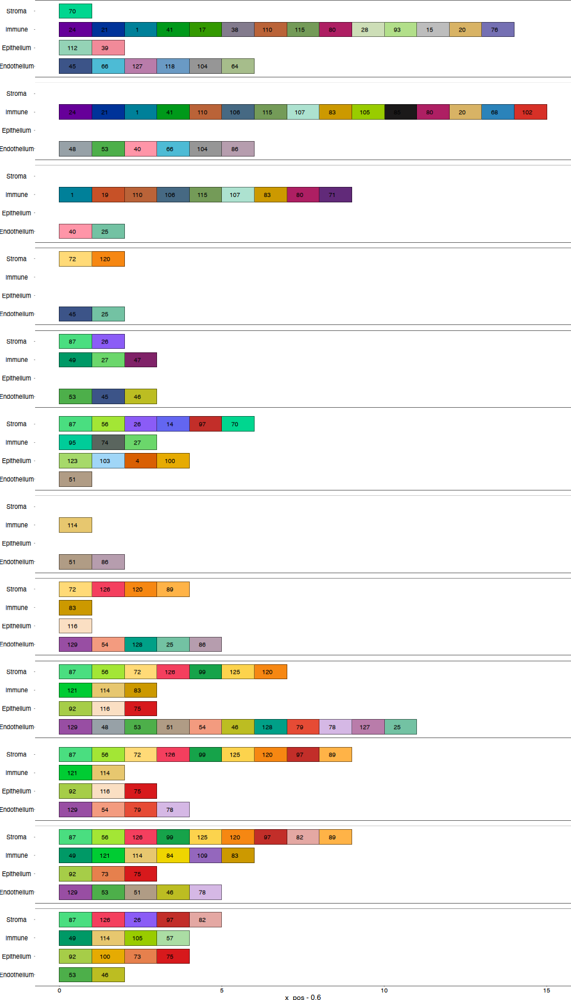

In [250]:
relative_cell_plot= tmp_d %>% 
    mutate(mode=factor(mode, new_order))%>%
    ggplot(aes(y=Celltype_round1,  fill=celltype))+
    geom_bar(stat='count', color='black', size=0.1, width=0.8)+
    geom_text(aes(x=x_pos-0.6,y=y_pos, label=label), size=label_size(6))+
    facet_wrap(~mode, ncol=1)+
    scale_fill_manual(values = round4_color)+
    theme_bw()+
    mytheme+
    theme(strip.background = element_blank(),
          panel.grid=element_blank(),
         strip.text=element_blank(),
         #axis.text.y=element_blank(),
         axis.title.y=element_blank())+

    NoLegend()

relative_cell_plot

In [350]:
tmp_d = all_cell_res %>%
     dplyr::filter(ct.estimate>0,ct.p.value<0.01) %>% as.data.frame()

In [351]:
options(repr.plot.width=10, repr.plot.height=6)
a = tmp_d %>%
    group_by(Celltype_round1, mode) %>%
    dplyr::summarise(n=n()) %>%
    mutate(mode=factor(mode, new_order)) %>%
    ggplot(aes(x="", y=n, fill=mode))+
      geom_bar(width = 1, stat = "identity")+
      coord_polar("y", start=0)+
      facet_wrap("~ Celltype_round1",ncol = 4, scales = 'free') +
      #geom_text(aes(y = ypos, label = paste0(round(percent,1)*100,'%')), 
      #          size=5,color='white', data=label_data)+
      theme_void()+
      scale_fill_manual(values = cols_manual,name='Mode')+
      #labs(title = 'Non-overlap cCREs') +
      theme( plot.title = element_text(hjust = 0.5))

`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.


In [352]:
ggsave(glue('{output_dir}/CREpattern_major_cluster_proportion.pdf'),a,
       width=180, height=140, units='mm')

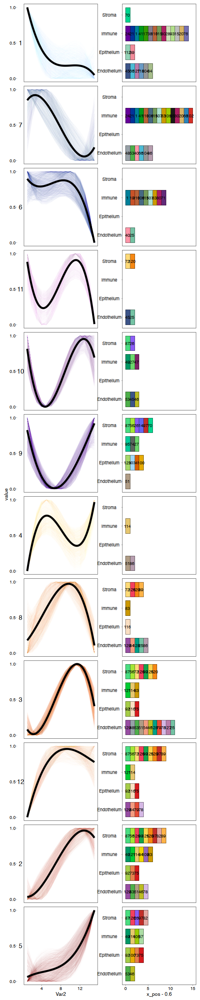

In [353]:
options(repr.plot.width=4, repr.plot.height=20)
plot_line| relative_cell_plot

### within patternCREenrichment analysis

In [36]:
Species = 'mm10'
library(rGREAT)



rGREAT version 2.8.0
Bioconductor page: http://bioconductor.org/packages/rGREAT/
Github page: https://github.com/jokergoo/rGREAT

If you use it in published research, please cite:
Gu, Z. rGREAT: an R/Bioconductor package for functional enrichment 
  on genomic regions. Bioinformatics 2023.

This message can be suppressed by:
  suppressPackageStartupMessages(library(rGREAT))

Note: On Aug 19 2019 GREAT released version 4 where it supports `hg38`
genome and removes some ontologies such pathways. `submitGreatJob()`
still takes `hg19` as default. `hg38` can be specified by the `genome
= 'hg38'` argument. To use the older versions such as 3.0.0, specify as
`submitGreatJob(..., version = '3.0.0')`.

From rGREAT version 1.99.0, it also implements the GREAT algorithm and
it allows to integrate GREAT analysis with the Bioconductor annotation
ecosystem. By default it supports more than 500 organisms. Check the
new function `great()` and the new vignette.



Attaching package: 'rGREAT'


The fo

In [361]:

Go.dataList = list()

for (i in new_order) {
    #i = names(sig.peak.list)[1]
    peaks = names(cre_label_filter[cre_label_filter==i])
    peaks = strsplit(peaks,split = '-')
    peak_dat = data.frame(chr = unlist(lapply(peaks, '[',1)),
                          start = unlist(lapply(peaks, '[',2)),
                          end =unlist(lapply(peaks, '[',3)))

    peak_dat = peak_dat[peak_dat$chr%in%paste0('chr',c(1:22,'X','Y')),]
    peak_gr = GRanges(seqnames = peak_dat$chr,
                      ranges = IRanges(start =as.numeric(peak_dat$start),
                                       end = as.numeric(peak_dat$end)))
    
    peak_gr = GenomicRanges::reduce(peak_gr)
    job = submitGreatJob(peak_gr,species =  Species )
    break
    tbl = getEnrichmentTables(job)
    GO_BP = tbl$`GO Biological Process`
    GO_BP$Cluster = 'Biological Process'
    
    
    GO_MF = tbl$`GO Molecular Function`
    GO_MF$Cluster = 'Molecular Function'

    GO_CC =  tbl$`GO Cellular Component`
    GO_CC$Cluster = 'Cellular Component'

    Go.data = rbind(GO_BP,GO_CC,GO_MF)
    Go.data$Group = i 
    Go.dataList[[i]] = Go.data
}

Note: On Aug 19 2019 GREAT released version 4 which supports hg38
genome and removes some ontologies such pathways. submitGreatJob()
still takes hg19 as default. hg38 can be specified by argument `genome
= "hg38"`. To use the older versions such as 3.0.0, specify as
submitGreatJob(..., version = "3"). Set argument `help` to `FALSE` to
turn off this message.



In [763]:
saveRDS(Go.dataList, '../pycode/round_cluster02/cCRE/cre_mode_GO.rds')

In [263]:
Go.dataList = readRDS('../pycode/round_cluster02/cCRE/cre_mode_GO.rds')

In [264]:
df.dd <- do.call(rbind,lapply(Go.dataList, data.frame))

In [360]:
head(df.dd)

,ID,name,Binom_Genome_Fraction,Binom_Expected,Binom_Observed_Region_Hits,Binom_Fold_Enrichment,Binom_Region_Set_Coverage,Binom_Raw_PValue,Binom_Adjp_BH,Hyper_Total_Genes,Hyper_Expected,Hyper_Observed_Gene_Hits,Hyper_Fold_Enrichment,Hyper_Gene_Set_Coverage,Hyper_Term_Gene_Coverage,Hyper_Raw_PValue,Hyper_Adjp_BH,Cluster,Group
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,GO:0000122,negative regulation of transcription from RNA polymerase II promoter,0.09323216,12420.480,17202,1.384970,0.12912380,0,0,836,667.3933,758,1.135762,0.04437939,0.9066986,3.684933e-18,1.937180e-16,Biological Process,1
2,GO:0001501,skeletal system development,0.05979108,7965.428,11881,1.491571,0.08918264,0,0,462,368.8226,445,1.206542,0.02605386,0.9632035,9.206786e-26,7.579675e-24,Biological Process,1
3,GO:0001568,blood vessel development,0.06436876,8575.271,12495,1.457097,0.09379152,0,0,502,400.7553,477,1.190252,0.02792740,0.9501992,5.536886e-23,3.794651e-21,Biological Process,1
4,GO:0001932,regulation of protein phosphorylation,0.12512300,16669.010,22161,1.329473,0.16634760,0,0,1324,1056.9720,1192,1.127750,0.06978923,0.9003021,5.539990e-25,4.368582e-23,Biological Process,1
5,GO:0001944,vasculature development,0.06703041,8929.858,13001,1.455902,0.09758972,0,0,531,423.9065,504,1.188941,0.02950820,0.9491525,7.247980e-24,5.390685e-22,Biological Process,1
6,GO:0002009,morphogenesis of an epithelium,0.06699320,8924.901,13416,1.503210,0.10070480,0,0,498,397.5620,475,1.194782,0.02781030,0.9538153,4.428485e-24,3.331544e-22,Biological Process,1


In [265]:
sig.dat10 = df.dd %>% dplyr::filter(Hyper_Adjp_BH<0.001)
sig.dat10 = sig.dat10 %>% 
    arrange(Hyper_Adjp_BH) %>%
    distinct(name, .keep_all=T) %>%
    group_by(Group)  %>%  
    top_n( n = 50,-Hyper_Adjp_BH)

In [266]:
table(sig.dat10$Group)


 1  2  3  4  5  6  7  8  9 10 11 12 
50 50 50 50 50 50 50 50 50 50 50 15 

In [1272]:
write.table(sig.dat10, '../pycode/round_cluster02/cCRE/cre_mode_GREAT_top50.txt', sep='\t', 
            quote=F, row.names = F)

In [690]:

enrich_obj_list = list()

for (i in new_order) {
    message(i)
    #i = names(sig.peak.list)[1]
    peaks = names(cre_label_filter[cre_label_filter==i])
    peaks = strsplit(peaks,split = '-')
    peak_dat = data.frame(chr = unlist(lapply(peaks, '[',1)),
                          start = unlist(lapply(peaks, '[',2)),
                          end =unlist(lapply(peaks, '[',3)))

    peak_dat = peak_dat[peak_dat$chr%in%paste0('chr',c(1:22,'X','Y')),]
    peak_gr = GRanges(seqnames = peak_dat$chr,
                      ranges = IRanges(start =as.numeric(peak_dat$start),
                                       end = as.numeric(peak_dat$end)))
    
    peak_gr = GenomicRanges::reduce(peak_gr)
    tmp1 = great(peak_gr,c('GO:BP'), 'TxDb.Mmusculus.UCSC.mm10.knownGene',cores=12,verbose=F)
    tmp2 = great(peak_gr,c('GO:MF'), 'TxDb.Mmusculus.UCSC.mm10.knownGene',cores=12,verbose=F)
    tmp3 = great(peak_gr,c('GO:CC'), 'TxDb.Mmusculus.UCSC.mm10.knownGene',cores=12,verbose=F)
    
    enrich_obj_list[[i]] = list('BP'=tmp1, 'MF'=tmp2, 'CC'=tmp3)
}

1

7

6

11

10

9

4

8

3

12

2

5



In [691]:
saveRDS(enrich_obj_list, '../pycode/round_cluster02/cCRE/cre_mode_GO_02.rds')

In [11]:
enrich_obj_list = readRDS('../pycode/round_cluster02/cCRE/cre_mode_GO_02.rds')

In [ ]:
all_enrich_data = c()
for(i in new_order){
    tmp_bp = enrich_obj_list[[i]]$BP
    tmp_mf = enrich_obj_list[[i]]$MF
    tmp_cc = enrich_obj_list[[i]]$CC
    
    tmp_bp_tb = tmp_bp@table #%>% filter(p_adjust_hyper<0.05)
    tmp_mf_tb = tmp_mf@table #%>% filter(p_adjust_hyper<0.05)
    tmp_cc_tb = tmp_cc@table #%>% filter(p_adjust_hyper<0.05)
    
    if(nrow(tmp_bp_tb)>0){
        tmp_bp_tb$Cluster = 'BP'
        #tmp_genes = c()
        #for(j in 1:nrow(tmp_bp_tb)){
        #    tmp_goid = tmp_bp_tb[i, 'id']
        #    tmp_goid_gene = unique(getRegionGeneAssociations(tmp,tmp_goid)$annotated_genes@unlistData)
        #    tmp_genes = c(tmp_genes, paste0(tmp_goid_gene, collapse = '/'))
        #}
        #tmp_bp_tb$hit_genes = tmp_genes
    }
    if(nrow(tmp_mf_tb)>0){
        tmp_mf_tb$Cluster = 'MF'
        #tmp_genes = c()
        #for(j in 1:nrow(tmp_mf_tb)){
        #    tmp_goid = tmp_mf_tb[i, 'id']
        #    tmp_goid_gene = unique(getRegionGeneAssociations(tmp,tmp_goid)$annotated_genes@unlistData)
        #    tmp_genes = c(tmp_genes, paste0(tmp_goid_gene, collapse = '/'))
        #}
        #tmp_mf_tb$hit_genes = tmp_genes
    }
    if(nrow(tmp_cc_tb)>0){
        tmp_cc_tb$Cluster = 'CC'
        #tmp_genes = c()
        #for(j in 1:nrow(tmp_cc_tb)){
        #    tmp_goid = tmp_cc_tb[i, 'id']
        #    tmp_goid_gene = unique(getRegionGeneAssociations(tmp,tmp_goid)$annotated_genes@unlistData)
        #    tmp_genes = c(tmp_genes, paste0(tmp_goid_gene, collapse = '/'))
        #}
        #tmp_cc_tb$hit_genes = tmp_genes
    }

    
    Go.data = rbind(tmp_bp_tb,tmp_mf_tb,tmp_cc_tb)
    if(nrow(Go.data)>0){
        Go.data$Group = i
    }
    
    all_enrich_data = rbind(all_enrich_data, Go.data)
}

ERROR: Error: object 'new_order' not found


In [696]:
saveRDS(all_enrich_data, '../pycode/round_cluster02/cCRE/cre_mode_GO_02_table.rds')

In [15]:
all_enrich_data = readRDS('../pycode/round_cluster02/cCRE/cre_mode_GO_02_table.rds')

In [47]:
sig.dat = all_enrich_data %>% dplyr::filter(p_adjust_hyper<0.001)
sig.dat = sig.dat %>% 
    arrange(fold_enrichment) %>%
    distinct(description, .keep_all=T) %>%
    group_by(Group)  %>%  
    top_n( n =50,fold_enrichment)
head(sig.dat)

id,description,genome_fraction,observed_region_hits,fold_enrichment,p_value,p_adjust,mean_tss_dist,observed_gene_hits,gene_set_size,fold_enrichment_hyper,p_value_hyper,p_adjust_hyper,Cluster,Group
<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
GO:0060004,reflex,0.007478882,118,0.9269585,0.8073947,0.9230177,294511,25,30,1.744026,6.308504e-05,7.302618e-04,BP,12
GO:0007631,feeding behavior,0.018456079,294,0.9358857,0.8808428,0.9771183,218991,96,136,1.477293,5.460299e-08,1.144225e-06,BP,12
GO:0031256,leading edge membrane,0.020295795,331,0.9581574,0.7910256,0.9643900,218258,103,159,1.355734,1.089533e-05,1.515210e-04,CC,12
GO:0010976,positive regulation of neuron projection development,0.033292570,544,0.9599896,0.8389132,0.9487673,223677,147,235,1.309133,3.309363e-06,4.955071e-05,BP,12
GO:0001709,cell fate determination,0.008397064,141,0.9865215,0.5755716,0.7191198,222357,33,41,1.684474,1.706025e-05,2.223414e-04,BP,12
GO:0043266,regulation of potassium ion transport,0.014914907,258,1.0162817,0.4053878,0.5461798,252246,69,102,1.415739,3.856842e-05,4.642055e-04,BP,12


In [50]:
unlist(sig.dat[i, 'Group'])

Group 
   12

In [51]:
tmp_genes = c()
for(i in 1:nrow(sig.dat)){
    message(i)
    tmp_group = unlist(sig.dat[i, 'Group'])
    tmp_cluster = unlist(sig.dat[i, 'Cluster'])
    tmp_goid = unlist(sig.dat[i, 'id'])
    tmp_goid_gene = unique(getRegionGeneAssociations(enrich_obj_list[[tmp_group]][[tmp_cluster]],tmp_goid)$annotated_genes@unlistData)
    tmp_genes = c(tmp_genes, paste0(tmp_goid_gene, collapse = '/'))
}

1

2

3

4

5

6

7

8

9

10

11

12

13

14

15

16

17

18

19

20

21

22

23

24

25

26

27

28

29

30

31

32

33

34

35

36

37

38

39

40

41

42

43

44

45

46

47

48

49

50

51

52

53

54

55

56

57

58

59

60

61

62

63

64

65

66

67

68

69

70

71

72

73

74

75

76

77

78

79

80

81

82

83

84

85

86

87

88

89

90

91

92

93

94

95

96

97

98

99

100

101

102

103

104

105

106

107

108

109

110

111

112

113

114

115

116

117

118

119

120

121

122

123

124

125

126

127

128

129

130

131

132

133

134

135

136

137

138

139

140

141

142

143

144

145

146

147

148

149

150

151

152

153

154

155

156

157

158

159

160

161

162

163

164

165

166

167

168

169

170

171

172

173

174

175

176

177

178

179

180

181

182

183

184

185

186

187

188

189

190

191

192

193

194

195

196

197

198

199

200

201

202

203

204

205

206

207

208

209

210

211

212

213

214

215

216

217

218

219

220

221

222

In [53]:
sig.dat$gene_set = tmp_genes

In [55]:
head(sig.dat)

id,description,genome_fraction,observed_region_hits,fold_enrichment,p_value,p_adjust,mean_tss_dist,observed_gene_hits,gene_set_size,fold_enrichment_hyper,p_value_hyper,p_adjust_hyper,Cluster,Group,gene_set
<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>
GO:0060004,reflex,0.007478882,118,0.9269585,0.8073947,0.9230177,294511,25,30,1.744026,6.308504e-05,7.302618e-04,BP,12,Nmbr/Gja1/Cdh23/Pcdh15/Ascl1/Glra1/Pmp22/Kcnma1/Adra1a/Slitrk6/Drd3/Zpld1/Satb1/Afg3l2/Tmc1/Tmc2/Npnt/Nr4a3/Usp46/Auts2/Foxp2/Shank1/Aldh1a3/Npsr1/Scn11a
GO:0007631,feeding behavior,0.018456079,294,0.9358857,0.8808428,0.9771183,218991,96,136,1.477293,5.460299e-08,1.144225e-06,BP,12,Oprk1/Gls/En1/Gpr39/Oprm1/Col6a1/Pmch/Pex13/Nmur2/Aoc3/Crhr1/Tmem18/Slc24a4/Unc79/Agtr1a/Drd1/Ntrk2/Cartpt/Htr1a/Ift88/Atp8a2/Dach1/Pou4f1/Cyp11b2/Mchr1/App/Glp1r/Mc4r/Cpt1a/Gal/Ins1/Bbip1/Prlhr/Grin1/Tbr1/Ttc21b/Ubr3/Phf21a/Bdnf/Eif2ak4/Oxt/a/Mc3r/Agtr1b/Ghsr/P2ry1/Npy2r/Rxfp4/Chrnb2/Ube2q1/Tacr3/Negr1/Cnr1/Nr4a3/Lepr/Sgip1/Insl5/Guca2b/Oprd1/Mtor/Napepld/Cckar/Usp46/Nmu/Lep/Npy/Crhr2/Tacr1/Trh/Grm7/Oxtr/Ankrd26/Grin2b/Ins2/Th/Insr/Adrb3/Helt/Hand2/Npy5r/Cfap20/Agrp/Gpr83/Npsr1/Aplp2/Bsx/Drd2/Stra6/Gfral/Hcrtr2/Htr1b/Mrap2/Cck/Apln/Htr2c/Ace2
GO:0031256,leading edge membrane,0.020295795,331,0.9581574,0.7910256,0.9643900,218258,103,159,1.355734,1.089533e-05,1.515210e-04,CC,12,Sntg1/Arpc2/Epb41l5/Adora1/Ush2a/Kcnh1/Oprm1/Ptprk/Appl2/Atp2b1/Egfr/Sptbn1/Wwc1/Gabrg2/Gabra1/Gabra6/Gria1/Shisa6/Myo1d/Nme1/Ngfr/Mapt/Itgb3/Adam17/Syne2/Amph/Ripor2/Unc5a/Hcn1/Arf4/Cacna1d/Spata13/Shisa8/Itga5/Shisa9/Robo1/Robo2/Tiam1/Synj2/Epb41l3/Jcad/Slc39a6/Apc/Psd2/Dagla/Dock8/Kank1/Itga8/Psd4/Grin1/Itgav/Ptprj/Slc1a2/Cd44/Pla2g4f/Lamp5/Src/Plcg1/Slc12a5/Kcnb1/Gria2/Pip5k1a/Plekho1/Kcnc4/Tacr3/Wls/Oprd1/Fgr/Sh3bgrl3/Cdc42/Pdpn/Gabrg1/Gabra4/Ptprz1/Cntnap2/Antxr1/Atp2b2/Gabarapl1/Eps8/C2cd5/Kcnj11/Kcnc1/Gabrg3/Gabra5/Chrna7/Rps3/Trpc2/Plekha1/Insr/Ank1/Dlc1/Psd3/Plcg2/Itgb1/Cdc37/Dnm2/Thy1/Tpm1/Eef1a1/Myo6/Clasp2/Cdkl5/Bmx
GO:0010976,positive regulation of neuron projection development,0.033292570,544,0.9599896,0.8389132,0.9487673,223677,147,235,1.309133,3.309363e-06,4.955071e-05,BP,12,Alkal1/Stau2/Serpine2/Actr3/Rgs2/Abl2/Tnn/Ddr2/Crp/Ahi1/Marcks/Fyn/Fig4/Snx3/Cd24a/Sirt1/Lrp1/Lif/Cobl/Actr2/Bcl11a/Ndel1/Atp1b2/Serpinf1/Nf1/Nme2/Nme1/Ngfr/Mapt/Kif3c/Adam17/Kidins220/Prkd1/Arf6/Ror2/Hnrnpk/Ntrk2/Arsb/Enc1/Wnt5a/Bmp4/Atp8a2/Ptk2b/Stk24/Washc5/Ep300/Plxnb2/Cntn1/Atf1/Ube2v2/Dnm1l/Kalrn/Epha3/Tiam1/Pcp4/Qki/Ddr1/Alk/Nrxn1/Adcyap1/Rit2/Dpysl3/Dcc/Ehd1/Cntf/Htr7/Ankrd1/Shoc2/Camk1d/Setx/Rapgef1/Dab2ip/Itga6/Nfe2l2/Zfp804a/Mdk/Caprin1/Bdnf/Itpka/Ltk/Cbfa2t2/Bmp7/Stmn2/Nlgn1/Mfn1/Dhx36/Rapgef2/Ngf/Amigo1/Plppr5/Negr1/Lyn/Tox/Fut9/Cnr1/Musk/Ror1/Lrp8/Elavl4/Ephb2/Mfn2/Mtor/Fzd1/Hgf/Magi2/Reln/Il6/Cxcl5/Scarb2/Cux2/Clip1/Hspb1/Gpc2/Ppp1r9a/Met/Ptprz1/Ptn/Creb3l2/Ezh2/Ndnf/Itpr1/Ret/Cyfip1/Igf1r/Rgma/Ntrk3/Cpeb1/Gprc5b/Eef2k/Mob2/Ikbkb/Fgfr1/Nrg1/Tenm3/Cx3cl1/Katnb1/Ndrg4/Disc1/Itgb1/Fez1/Nptn/Tmem30a/Nck1/Cask/Plxnb3/Zdhhc15/Pak3
GO:0001709,cell fate determination,0.008397064,141,0.9865215,0.5755716,0.7191198,222357,33,41,1.684474,1.706025e-05,2.223414e-04,BP,12,Sox17/Prrx1/Prox1/Ascl1/Hand1/Tbx2/Foxg1/Ptch1/Mef2c/Isl1/Bmp4/Otx2/Ebf2/Hes1/Gata6/Pax2/Lbx1/Gata3/Pax6/Notch2/Ptch2/Cdc42/Barhl2/Atoh1/Cyp26b1/Gata2/Wnt7a/Ntf3/Mesp1/Nkx6-3/Smarca4/Ctnnb1/Chrdl1
GO:0043266,regulation of potassium ion transport,0.014914907,258,1.0162817,0.4053878,0.5461798,252246,69,102,1.415739,3.856842e-05,4.642055e-04,BP,12,Oprk1/Sumo1/Kcne4/Dpp10/Adora1/Atp1b1/Lrrc52/Rgs4/Rgs7/Vip/Akap7/Kcnmb1/Kcnip1/Atp1b2/Kcnj2/Hbp1/Akap6/Actn2/Wnk2/Cacna1d/Kcnrg/Ptk2b/Kcns2/Ano6/Klhl24/Dlg1/Drd3/Kcne1/Adcyap1/Kif5b/Bin1/Kcnn2/Adrb2/Nedd4l/Neto1/Gal/Gnaq/Kcnip2/Lrrc26/Stk39/Lrrc55/Plcb4/Edn3/Kcnab1/Amigo1/Ank2/Ptger3/Kcnab2/Kcnh2/Dpp6/Kcnip4/Cckar/Cxcl1/Nos1/Cav1/Kcna5/Abcc9/Kcnc1/Kcnq1/Nr3c2/Wwp2/Itgb1/Kcnj1/Drd2/Nedd4/Atp1b3/Oxsr1/Fhl1/Kcne5


In [56]:
write.table(sig.dat, glue('{output_dir}/cre_mode_GREAT_top50.txt'), sep='\t', 
            quote=F, row.names = F)

In [724]:
write.table(sig.dat[,c(1,2,5,14,15)], '../pycode/round_cluster02/cCRE/cre_mode_GREAT_top50_02.txt', sep='\t', 
            quote=F, row.names = F)

In [287]:
stage_goid_geneset = list()
for(i in stage_goid){
    tmp_group = as.numeric(sig.dat[sig.dat$id==i, 'Group'])
    tmp_class = as.character(sig.dat[sig.dat$id==i, 'Cluster'])
    tmp_obj = enrich_obj_list[[tmp_group]][[tmp_class]]
    tmp_goid_gene = unique(getRegionGeneAssociations(tmp_obj,i)$annotated_genes@unlistData)
    stage_goid_geneset[[i]] = tmp_goid_gene
}

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'unique': could not find function "getRegionGeneAssociations"


In [ ]:
gb = get_genebody(object = EnsDb.Mmusculus.v79)
seqlevels(gb) = paste0('chr',seqlevels(gb))
all_cre_gr = StringToGRanges(rownames(time_mat))


In [230]:
gb = get_promoter(object=EnsDb.Mmusculus.v79,upstream = 5000,downstream = 1000)
seqlevels(gb) = paste0('chr',seqlevels(gb))
gb

GRanges object with 22032 ranges and 6 metadata columns:
                     seqnames            ranges strand |            gene_id
                        <Rle>         <IRanges>  <Rle> |        <character>
  ENSMUSG00000051951     chr1   3670499-3676498      - | ENSMUSG00000051951
  ENSMUSG00000025900     chr1   4408242-4414241      - | ENSMUSG00000025900
  ENSMUSG00000025902     chr1   4496355-4502354      - | ENSMUSG00000025902
  ENSMUSG00000033845     chr1   4784740-4790739      - | ENSMUSG00000033845
  ENSMUSG00000025903     chr1   4802788-4808787      + | ENSMUSG00000025903
                 ...      ...               ...    ... .                ...
  ENSMUSG00000100608     chrY 89744533-89750532      - | ENSMUSG00000100608
  ENSMUSG00000096178     chrY 90396248-90402247      + | ENSMUSG00000096178
  ENSMUSG00000095366     chrY 90753822-90759821      - | ENSMUSG00000095366
  ENSMUSG00000096768     chrY 90779738-90785737      + | ENSMUSG00000096768
  ENSMUSG00000096850     chrY 9

In [22]:
umap = read.csv(glue('./placeholder_analysis/round_cluster02/merge/cell_meta.csv'))
cell_meta = umap
cell_meta = cell_meta[order(cell_meta[,'Celltype_round1'],
                       cell_meta[,'Celltype_round2'],
                       cell_meta[,'Celltype_round3'],
                       cell_meta[,'Celltype_round4']),]

cell_order = cell_meta$Celltype_round4[!duplicated(cell_meta$Celltype_round4)]

## under each cell type, geneaccandactover time

In [6]:
manual_genes = c(
    'ACTA2', 'ACTC1', 'MYH6', 'MYH7', 'TPM1', 'TPM2', 'PFN1',
    'TUBB', 'TUBA1C', 'ACTN1','ACTN4', 'RAB5', 'RAB7',
    'VCL', 'TLN1', 'ITGB1', 'RAC1', 'RHOA', 'CDC42',
    'NKX2-1', 'SOX2', 'SOX9', 'FOXA2', 'HOPX', 'SFTPC', 'SFTPC', 'AGER',
    'CDH1', 'PRICKLE1', 'VANGL1', 'VANGL2','SCRIB', 'ITGB1',
    'BRCA1','BRCA2', 'RAD51', 'SOX2', 'NKX2-1',
    'VEGFA','VEGFC', 'KDR','FLT1', 'PROX1', 'FOXC2', 'BMPR2', 'ACVRL1', 'TIE2',
    'NOS3', 'ANGPT1', 'ANGPT2', 'ACTA2', 'EDN1', 'BMPR2',
    'FN1', 'PDGFRB', 'FGF2', 'VCL', 'ITGB1',
    'SREBF1','SREBF2', 'HMGCR', 'FASN', 'ACACA', 'ABCA1',
    'CPT1A', 'ACADL', 'HK1', 'SLC2A1',
    'RHOA', 'RAC1', 'CDC42', 'MAPK1','MAPK3', 'MAPK8', 'MAPK9', 'KDR',
    'TGFB1','TGFB2', 'TGFBR1','TGFBR2', 'SMAD2','SMAD3','SMAD4',
    'NFE2L2', 'HSPA5', 'ATF6', 'EIF2AK3','PERK', 'BCL2', 'ATG5','ATG7',
    'TLR2','TLR3','TLR4','TLR7', 'NLRP3', 'AIM2', 'IFNAR1', 'STAT1','STAT2',
    'CD3D','CD3E','CD3G', 'CD4', 'CD8A','CD8B', 'IL2', 'FOXP3', 'STAT5', 'CXCR4',
    'CD19', 'CD20', 'MS4A1', 'PAX5', 'BTK', 'BLNK', 'IGHM',
    'CCR7', 'CXCR4', 'CXCL12', 'ICAM1', 'VCAM1', 'CCL2',
    'CSF1', 'CSF2', 'IL4', 'IL13', 'TNF', 'IL1B', 'STAT3', 'RELA'
)
manual_genes_lower = sapply(manual_genes, function(x){
    paste0(substr(x,1,1), tolower(substr(x, 2, nchar(x))))
})
manual_genes_lower = unique(manual_genes_lower)
length(manual_genes_lower)

[1] 118

In [ ]:
tmp_gb = gb[gb$gene_name%in%manual_genes_lower,]
tmp_hits = findOverlaps(tmp_gb,all_cre_gr)
tmpe_gene_cre = data.frame('gene'=tmp_gb$gene_name[queryHits(tmp_hits)],
                        'cre' = rownames(time_mat)[subjectHits(tmp_hits)],
                        'mode' = cre_label_filter[rownames(time_mat)[subjectHits(tmp_hits)]]
                        )


In [262]:
write.table(na.omit(tmpe_gene_cre), glue('{output_dir}/manual gene pattern distribution2.txt'), sep='\t', quote=F)

In [263]:
write.table(table(tmpe_gene_cre$gene, tmpe_gene_cre$mode), glue('{output_dir}/manual gene pattern distribution.txt'), sep='\t', quote=F)

In [264]:
table(tmpe_gene_cre$gene, tmpe_gene_cre$mode)['Tpm2',]

1  2  3  4  5  6  7  8  9 10 11 12 
 2  0  0  0  0  0  0  0  0  0  0  0

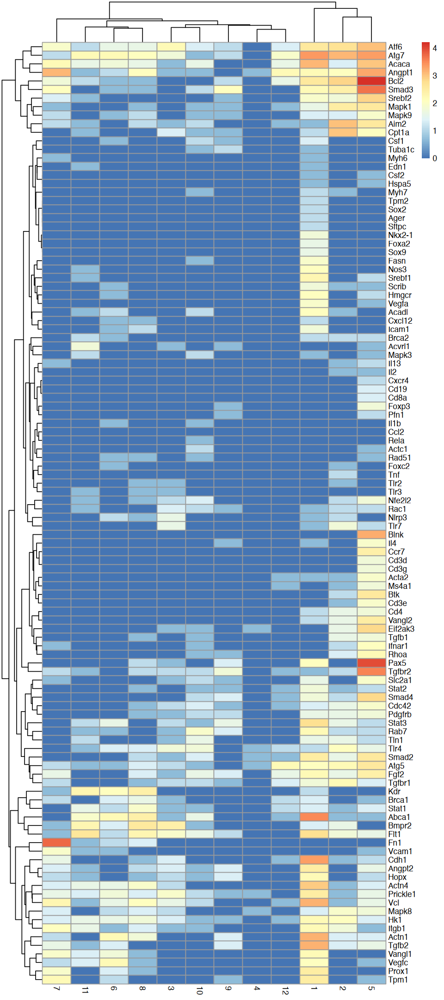

In [265]:
options(repr.plot.width=8, repr.plot.height=18)
pheatmap::pheatmap(table(tmpe_gene_cre$gene, tmpe_gene_cre$mode) %>% log1p())

In [ ]:
tmp_select_gene=manual_genes_lower

gene_cell_acc = c()
for(i in tmp_select_gene){
    tmp_cre_raw = tmpe_gene_cre[tmpe_gene_cre$gene==i, 'cre']
    for(mo in 1:12){
        tmp_cre2= names(cre_label_filter[cre_label_filter==mo])
        tmp_cre = intersect(tmp_cre_raw, tmp_cre2)
        for(j in unique(umap$Celltype_round4)){
            tmp_col = paste0(j,':',time_levels)
            if(length(setdiff(tmp_col, colnames(celltime_mat)))==0){
                tmp_peaks = celltime_mat[tmp_cre,tmp_col, drop=F]
                tmp_peaks = unname(colMeans(tmp_peaks))
                tmp_peaks = data.frame(matrix(unname(tmp_peaks), nrow=1))
                colnames(tmp_peaks) = time_levels
                tmp_peaks$gene = i
                tmp_peaks$celltype=j
                tmp_peaks$mode=mo
                gene_cell_acc = rbind(gene_cell_acc, tmp_peaks)
                # rownames(gene_cell_acc)[nrow(gene_cell_acc)] = i
            }
        }
    }
}
gene_cell_acc$mode = factor(gene_cell_acc$mode, levels = 1:12)
gene_cell_acc$celltype_round1 = cell_meta2[gene_cell_acc$celltype, 'Celltype_round1']
gene_cell_acc_melt = melt(gene_cell_acc, ids=c('gene', 'celltype', 'celltype_round1','mode'))
saveRDS(gene_cell_acc_melt, glue('{output_dir}/manual_gene_pattern_cell_type_accessibility_promoter.rds'))

Using gene, celltype, mode, celltype_round1 as id variables



In [257]:
# convert vectortmp_select_gene20plot as one group, savePDF, 20one per page
group_size = 10
num_groups = ceiling(length(tmp_select_gene) / group_size)  
for (g in 1:num_groups) {
    start_index = (g - 1) * group_size + 1
    end_index = min(g * group_size, length(tmp_select_gene))
    gene_subset = tmp_select_gene[start_index:end_index]
    
    p = gene_cell_acc_melt %>%
        filter(gene %in% gene_subset) %>%
        group_by(gene,variable,celltype_round1, mode) %>%
        dplyr::summarise(value=mean(value)) %>%
        mutate(gene=factor(gene, gene_subset),
               variable=factor(variable, time_levels),
               mode=factor(mode, levels=1:12)) %>%
        ggplot(aes(x=variable, y=value, color=celltype_round1, group=celltype_round1))+
        geom_point(size=1)+
        geom_smooth(se=F)+
        facet_wrap(gene~mode, scales = 'free', ncol=12)+
        scale_color_manual(values = celltype_round1_color)+
        NoLegend()+
        theme(strip.text = element_text(size=16))
    
    ggsave(glue('{output_dir}/manual gene pattern distribution_{g}.pdf'), p,
           width=80, height=16*ceiling(length(gene_subset)/4), units='cm')
    #break
}

`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can ov

In [266]:
tmp_select_gene=manual_genes_lower

gene_cell_acc = c()
for(i in tmp_select_gene){
    tmp_cre_raw = tmpe_gene_cre[tmpe_gene_cre$gene==i, 'cre']
    for(mo in 1:12){
        tmp_cre2= names(cre_label_filter[cre_label_filter==mo])
        tmp_cre = intersect(tmp_cre_raw, tmp_cre2)
        for(j in unique(umap$Celltype_round4)){
            tmp_col = paste0(j,':',time_levels)
            if(length(setdiff(tmp_col, colnames(celltime_mat)))==0){
                tmp_peaks = celltime_mat[tmp_cre,tmp_col, drop=F]
                tmp_peaks = unname(colMeans(tmp_peaks))
                tmp_peaks = data.frame(matrix(unname(tmp_peaks), nrow=1))
                colnames(tmp_peaks) = time_levels
                tmp_peaks$gene = i
                tmp_peaks$celltype=j
                tmp_peaks$mode=mo
                gene_cell_acc = rbind(gene_cell_acc, tmp_peaks)
                # rownames(gene_cell_acc)[nrow(gene_cell_acc)] = i
            }
        }
    }
}
gene_cell_acc$mode = factor(gene_cell_acc$mode, levels = 1:12)
gene_cell_acc$celltype_round1 = cell_meta2[gene_cell_acc$celltype, 'Celltype_round1']
gene_cell_acc_melt = melt(gene_cell_acc, ids=c('gene', 'celltype', 'celltype_round1','mode'))
saveRDS(gene_cell_acc_melt, glue('{output_dir}/manual_gene_pattern_cell_type_accessibility_genebody.rds'))

Using gene, celltype, mode, celltype_round1 as id variables



In [267]:
# convert vectortmp_select_gene20plot as one group, savePDF, 20one per page
group_size = 10
num_groups = ceiling(length(tmp_select_gene) / group_size)  
for (g in 1:num_groups) {
    start_index = (g - 1) * group_size + 1
    end_index = min(g * group_size, length(tmp_select_gene))
    gene_subset = tmp_select_gene[start_index:end_index]
    
    p = gene_cell_acc_melt %>%
        filter(gene %in% gene_subset) %>%
        group_by(gene,variable,celltype_round1, mode) %>%
        dplyr::summarise(value=mean(value)) %>%
        mutate(gene=factor(gene, gene_subset),
               variable=factor(variable, time_levels),
               mode=factor(mode, levels=1:12)) %>%
        ggplot(aes(x=variable, y=value, color=celltype_round1, group=celltype_round1))+
        geom_point(size=1)+
        geom_smooth(se=F)+
        facet_wrap(gene~mode, scales = 'free', ncol=12)+
        scale_color_manual(values = celltype_round1_color)+
        NoLegend()+
        theme(strip.text = element_text(size=16))
    
    ggsave(glue('{output_dir}/manual gene pattern distributiongenebody_{g}.pdf'), p,
           width=80, height=16*ceiling(length(gene_subset)/4), units='cm')
    #break
}

`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can override using the
`.groups` argument.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`summarise()` has grouped output by 'gene', 'variable', 'celltype_round1'. You can ov

In [42]:
gene_cell_acc_melt_body = readRDS(glue('{output_dir}/manual_gene_pattern_cell_type_accessibility_genebody.rds'))
gene_cell_acc_melt_promoter = readRDS(glue('{output_dir}/manual_gene_pattern_cell_type_accessibility_promoter.rds'))

In [161]:
select_gene = data.frame('gene' = c('Nkx2-1','Tpm2', 'Actn4', 'Sox9', 'Vangl1','Vegfa','Angpt1', 'Tlr4',  'Tlr7','Cd4', 'Cd19', 'Il2', 'Ms4a1',
                                    'Scrib', 'Prox1', 'Fgf2', 'Tlr2', 'Tlr7', 'Tlr7', 'Il2', 'Cd8a', 'Cd19', 'Blnk', 'Tnf',  'Gata6','Foxj1', 'Sfrp1','Wnt5a','Foxp1'),
                        'location' = c('promoter','body','body','body','body','body','body','body','body','body','body','body','body',
                                       'promoter','promoter','promoter','promoter','promoter','promoter','promoter','promoter','promoter','promoter','promoter','body','body','body','body','body'),
                        'mode' = c(1,1,7,1,7,1,6,2,2,2,5,5,5,1,1,1,2,3,5,5,5,5,5,5,1,6,6,5,7))
select_gene

gene,location,mode
<chr>,<chr>,<dbl>
Nkx2-1,promoter,1
Tpm2,body,1
Actn4,body,7
Sox9,body,1
Vangl1,body,7
Vegfa,body,1
Angpt1,body,6
Tlr4,body,2
Tlr7,body,2


In [162]:
manual_genes_lower = unique(select_gene[select_gene$location=='body', 'gene'])
manual_genes_lower

[1] "Tpm2"   "Actn4"  "Sox9"   "Vangl1" "Vegfa"  "Angpt1" "Tlr4"   "Tlr7"  
 [9] "Cd4"    "Cd19"   "Il2"    "Ms4a1"  "Gata6"  "Foxj1"  "Sfrp1"  "Wnt5a" 
[17] "Foxp1"

In [164]:
gb = get_genebody(object = EnsDb.Mmusculus.v79)
seqlevels(gb) = paste0('chr',seqlevels(gb))
all_cre_gr = StringToGRanges(rownames(time_mat))

# gb = get_promoter(object=EnsDb.Mmusculus.v79,upstream = 5000,downstream = 1000)
# seqlevels(gb) = paste0('chr',seqlevels(gb))
# gb

In [165]:
tmp_gb = gb[gb$gene_name%in%manual_genes_lower,]
tmp_hits = findOverlaps(tmp_gb,all_cre_gr)
tmpe_gene_cre = data.frame('gene'=tmp_gb$gene_name[queryHits(tmp_hits)],
                        'cre' = rownames(time_mat)[subjectHits(tmp_hits)],
                        'mode' = cre_label_filter[rownames(time_mat)[subjectHits(tmp_hits)]]
                        )
tmp_select_gene=manual_genes_lower

gene_cell_acc = c()
for(i in tmp_select_gene){
    tmp_cre_raw = tmpe_gene_cre[tmpe_gene_cre$gene==i, 'cre']
    for(mo in 1:12){
        tmp_cre2= names(cre_label_filter[cre_label_filter==mo])
        tmp_cre = intersect(tmp_cre_raw, tmp_cre2)
        for(j in unique(umap$Celltype_round4)){
            tmp_col = paste0(j,':',time_levels)
            if(length(setdiff(tmp_col, colnames(celltime_mat)))==0){
                tmp_peaks = celltime_mat[tmp_cre,tmp_col, drop=F]
                tmp_peaks = unname(colMeans(tmp_peaks))
                tmp_peaks = data.frame(matrix(unname(tmp_peaks), nrow=1))
                colnames(tmp_peaks) = time_levels
                tmp_peaks$gene = i
                tmp_peaks$celltype=j
                tmp_peaks$mode=mo
                gene_cell_acc = rbind(gene_cell_acc, tmp_peaks)
                # rownames(gene_cell_acc)[nrow(gene_cell_acc)] = i
            }
        }
    }
}
gene_cell_acc$mode = factor(gene_cell_acc$mode, levels = 1:12)
gene_cell_acc$celltype_round1 = cell_meta2[gene_cell_acc$celltype, 'Celltype_round1']
gene_cell_acc_melt = melt(gene_cell_acc, ids=c('gene', 'celltype', 'celltype_round1','mode'))

Using gene, celltype, mode, celltype_round1 as id variables



In [199]:
select_gene = select_gene %>%
    filter(gene%in%c('Tlr4',  'Tlr7','Cd4', 'Cd19', 'Il2', 'Ms4a1', 'Fgf2',  'Cd8a', 'Blnk', 'Tnf',
         'Tpm2', 'Actn4', 'Sox9', 'Vegfa', 'Angpt1','Prox1', 'Fgf2', 'Foxj1', 'Wnt5a'))
    

In [215]:
pl_list = list()
for(i in c('Wnt5a','Vegfa', 'Fgf2','Tpm2', 'Sox9', 'Angpt1','Prox1',  'Foxj1', 'Actn4', 
    'Cd4','Cd8a','Fgf2',   'Tlr4',  'Tlr7','Cd19', 'Blnk','Il2', 'Ms4a1',   'Tnf'
         )){
    tmp_loc = select_gene[select_gene$gene==i, 'location']
    tmp_mode = select_gene[select_gene$gene==i, 'mode']
    if(length(tmp_loc)==1){
        if(tmp_loc=='body'){
        tmp_data = gene_cell_acc_melt
        }else{
            tmp_data = gene_cell_acc_melt_promoter
        }
    }else{
        tmp_data = rbind(gene_cell_acc_melt_body, gene_cell_acc_melt_promoter)
    }
    #tmp_data = tmp_data %>% mutate(value=scale(value)) 
    tmp_data = tmp_data %>%
        filter(gene == i, mode%in%tmp_mode)
    tmp_data = dcast(tmp_data, celltype_round1~variable, value.var = 'value',fun.aggregate = mean)
    # tmp_data[,time_levels]=t(apply(tmp_data[,time_levels], 1, function(aa){
    #     aa = unname(unlist(aa))
    #     tmp_pred = predict(glm("y~poly(x,3)", data=data.frame(x=1:15, y=aa)))
    #     tmp_pred = (tmp_pred-min(tmp_pred))/(max(tmp_pred)-min(tmp_pred))
    #     # tmp_pred = (aa-min(aa))/(max(aa)-min(aa))
    #     return(tmp_pred)
    # }))
    
    tmp_data = melt(tmp_data) %>% na.omit()
    tmp_data$value = (tmp_data$value-min(tmp_data$value))/(max(tmp_data$value)-min(tmp_data$value))
    p = tmp_data %>%
        mutate(variable=factor(variable, time_levels)) %>%
        ggplot(aes(x=variable, y=value, color=celltype_round1, group=celltype_round1))+
        #geom_point(size=1)+
        geom_smooth(se=F, method='glm', formula = 'y~poly(x,3)')+
        scale_color_manual(values = celltype_round1_color)+
        #ggtitle(paste0(i,'_mode',tmp_mode))+
        ggtitle(i)+
        labs(x='Timepoint', y='Gene Signal')+
        theme_bw()+
        theme(
            plot.title = element_text(hjust = 0.5),
            panel.grid = element_blank()
              )+
        NoLegend()
    pl_list[[i]] = p
}

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables



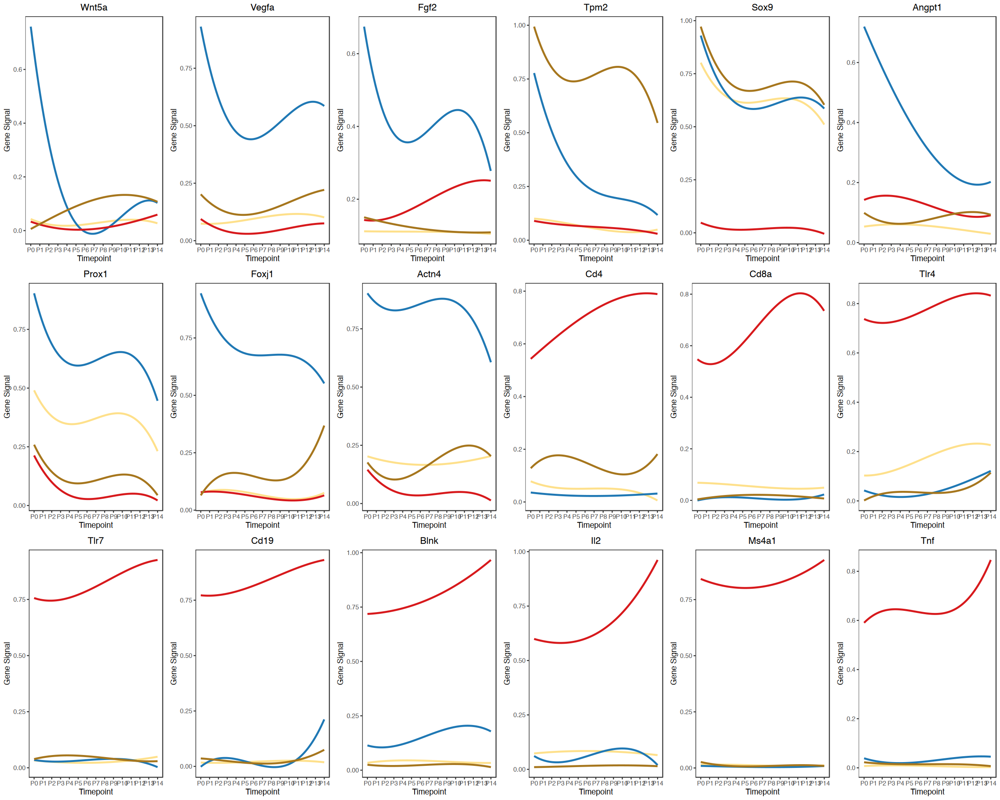

In [216]:
options(repr.plot.width=20, repr.plot.height=16)
cowplot::plot_grid(plotlist = pl_list, ncol=6)

In [217]:
ggsave(glue('{output_dir}/manual_gene_pattern_cell_type_accessibility_03.pdf'), cowplot::plot_grid(plotlist = pl_list, ncol=6),
       width=12, height=6, units='in', dpi=600, bg='transparent')

In [ ]:
c('Tpm2', 'Actn4', 'Sox9', 'Vegfa', 'Angpt1','Prox1', 'Fgf2', 'Foxj1', 'Wnt5a')

In [193]:
select_gene2 = select_gene %>%
    filter(gene%in%c('Tlr4',  'Tlr7','Cd4', 'Cd19', 'Il2', 'Ms4a1', 'Fgf2',  'Cd8a', 'Blnk', 'Tnf'))
pl_list_data = c()
for(i in unique(select_gene2$gene)){
    tmp_loc = select_gene2[select_gene2$gene==i, 'location']
    tmp_mode = select_gene2[select_gene2$gene==i, 'mode']
    if(length(tmp_loc)==1){
        if(tmp_loc=='body'){
        tmp_data = gene_cell_acc_melt
        }else{
            tmp_data = gene_cell_acc_melt_promoter
        }
    }else{
        tmp_data = rbind(gene_cell_acc_melt_body, gene_cell_acc_melt_promoter)
    }
    #tmp_data = tmp_data %>% mutate(value=scale(value)) 
    tmp_data = tmp_data %>%
        filter(gene == i, mode%in%tmp_mode)
    tmp_data = dcast(tmp_data, celltype_round1~variable, value.var = 'value',fun.aggregate = mean)
    tmp_data[,time_levels]=t(apply(tmp_data[,time_levels], 1, function(aa){
        aa = unname(unlist(aa))
        tmp_pred = predict(glm("y~poly(x,3)", data=data.frame(x=1:15, y=aa)))
        tmp_pred = (tmp_pred-min(tmp_pred))/(max(tmp_pred)-min(tmp_pred))
        # tmp_pred = (aa-min(aa))/(max(aa)-min(aa))
        return(tmp_pred)
    }))
    tmp_data = melt(tmp_data) %>% na.omit()
    tmp_data$gene = i
    pl_list_data = rbind(pl_list_data,tmp_data %>%
        filter(celltype_round1=='Immune'))
}


Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables



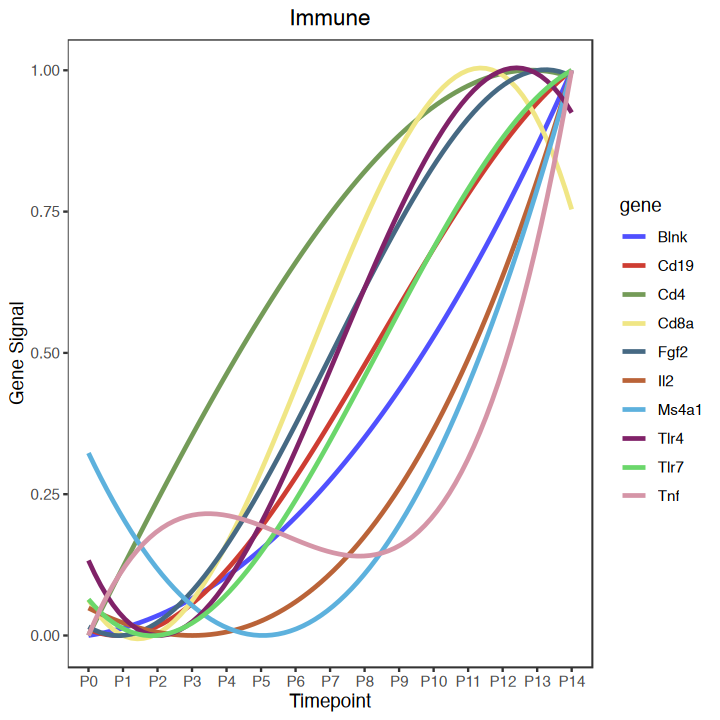

In [194]:
p = pl_list_data %>%
    mutate(variable=factor(variable, time_levels)) %>%
    ggplot(aes(x=variable, y=value, color=gene, group=gene))+
    #geom_point(size=1)+
    geom_smooth(se=F, method='glm', formula = 'y~poly(x,3)')+
    scale_color_igv()+
    #scale_color_manual(values = celltype_round1_color)+
    ggtitle('Immune')+
    labs(x='Timepoint', y='Gene Signal')+
    theme_bw()+
    theme(
        plot.title = element_text(hjust = 0.5),
        panel.grid = element_blank()
            )
options(repr.plot.width=6, repr.plot.height=6)
p

In [195]:
select_gene2 = select_gene %>%
    filter(gene%in%c('Tpm2', 'Actn4', 'Sox9', 'Vegfa', 'Angpt1','Prox1', 'Fgf2', 'Foxj1', 'Wnt5a'))

pl_list_data = c()
for(i in unique(select_gene2$gene)){
    tmp_loc = select_gene2[select_gene2$gene==i, 'location']
    tmp_mode = select_gene2[select_gene2$gene==i, 'mode']
    if(length(tmp_loc)==1){
        if(tmp_loc=='body'){
        tmp_data = gene_cell_acc_melt
        }else{
            tmp_data = gene_cell_acc_melt_promoter
        }
    }else{
        tmp_data = rbind(gene_cell_acc_melt_body, gene_cell_acc_melt_promoter)
    }
    #tmp_data = tmp_data %>% mutate(value=scale(value)) 
    tmp_data = tmp_data %>%
        filter(gene == i, mode%in%tmp_mode)
    tmp_data = dcast(tmp_data, celltype_round1~variable, value.var = 'value',fun.aggregate = mean)
    tmp_data[,time_levels]=t(apply(tmp_data[,time_levels], 1, function(aa){
        aa = unname(unlist(aa))
        tmp_pred = predict(glm("y~poly(x,3)", data=data.frame(x=1:15, y=aa)))
        tmp_pred = (tmp_pred-min(tmp_pred))/(max(tmp_pred)-min(tmp_pred))
        # tmp_pred = (aa-min(aa))/(max(aa)-min(aa))
        return(tmp_pred)
    }))
    tmp_data = melt(tmp_data) %>% na.omit()
    tmp_data$gene = i
    pl_list_data = rbind(pl_list_data,tmp_data %>%
        filter(celltype_round1=='Epithelium') )
}


Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables

Using celltype_round1 as id variables



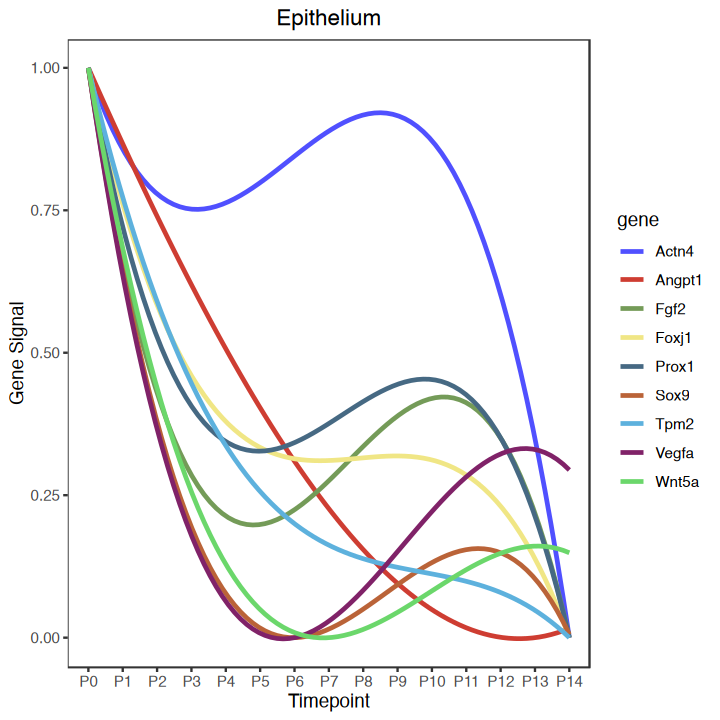

In [196]:
p = pl_list_data %>%
    mutate(variable=factor(variable, time_levels)) %>%
    ggplot(aes(x=variable, y=value, color=gene, group=gene))+
    #geom_point(size=1)+
    geom_smooth(se=F, method='glm', formula = 'y~poly(x,3)')+
    scale_color_igv()+
    #scale_color_manual(values = celltype_round1_color)+
    ggtitle('Epithelium')+
    labs(x='Timepoint', y='Gene Signal')+
    theme_bw()+
    theme(
        plot.title = element_text(hjust = 0.5),
        panel.grid = element_blank()
            )
options(repr.plot.width=6, repr.plot.height=6)
p

In [299]:
lung_dev_gene = 'Eya1/Creb1/Col6a1/Ascl1/Igf1/Ppp3r1/Thra/Sox9/Foxj1/Agr2/Nkx2-1/Foxa1/Sav1/Numb/Fgf10/Thrb/Grhl2/Spdef/Foxp4/Gata6/Foxa2/Fndc3b/Tmem38b/Nfib/Trp73/Rbpj/Ncor2/Aimp2/Foxp1/Kras/Pthlh/Insc/Klf2/Yap1/Ctnnb1/Pkhd1/Erbb4/Traf3ip1/Vangl2/Ahi1/Wdpcp/Dvl2/Pafah1b1/Fzd2/Wnt9b/Nherf1/Actg1/Numb/Ttc8/Foxf2/Dlg5/Wnt5a/Exoc5/Fzd3/Cplane1/Fzd6/Cthrc1/Scrib/Celsr1/Dvl3/Trp63/Ptk7/Lama1/Sfrp5/Nphp1/Tcf15/Lama5/Fat4/Intu/Sfrp2/Sec24b/Astn2/Grhl3/Cdc42/Ajap1/Dvl1/Fzd1/Wdr1/Actb/Lrp6/Syne4/Fuz/Dchs1/Brsk2/Sfrp1/Fat1/Rpgrip1l/Foxf1/Jhy/Myo9a/Ophn1/Dlg3/Fzd7/Lif/Wnt9b/Pelo/Gdnf/Six2/Pax2/Gata3/Pax8/Wt1/Grem1/Tcf15/Wnt4/Dspp/Smo/Sall1/Ctnnb1/Cited1'
lung_dev_gene = unique(strsplit(lung_dev_gene, split = '/')[[1]])
length(setdiff(lung_dev_gene, manual_genes_lower))

[1] 100

In [38]:
gb = get_genebody(object = EnsDb.Mmusculus.v79)
seqlevels(gb) = paste0('chr',seqlevels(gb))
all_cre_gr = StringToGRanges(rownames(time_mat))
# all_cre_gr = StringToGRanges(rownames(time_mat))
# gb = get_promoter(object=EnsDb.Mmusculus.v79,upstream = 5000,downstream = 1000)
# seqlevels(gb) = paste0('chr',seqlevels(gb))
# gb

In [16]:
manual_genes_lower=c("Fgf10", "Gata6", "Foxa1", "Wnt5a", "Nfib",
  "Yap1", "Ctnnb1", "Foxj1", "Gata3", "Foxp1",
  "Sfrp1", "Lama5", "Wnt4", "Sfrp2", "Celsr1",
  "Fzd2", "Fat4", "Dvl2", "Tcf15", "Smo")
manual_genes_lower=c("Nkx2-1", "Fgf10", "Gata6", "Foxa2", "Foxa1",
  "Foxp1", "Foxp4", "Grhl2", "Spdef", "Foxj1",
  "Yap1", "Ctnnb1", "Wnt5a", "Celsr1", "Vangl2",
  "Fzd2", "Fzd7", "Sfrp1", "Trp63", "Nfib")

In [ ]:
expr_smoothed_glm = t(apply(expr_smoothed, 1, function(aa){
    tmp_m = glm("y~poly(x,3)", data=data.frame(x=1:15, y=aa))
    predict(tmp_m)
}))

expr_smoothed_glm = t(apply(expr_smoothed_glm, 1, function(x)(x-min(x))/(max(x)-min(x))))

In [33]:
tmp_cre

character(0)

In [39]:
tmp_gb = gb[gb$gene_name%in%manual_genes_lower,]
tmp_hits = findOverlaps(tmp_gb,all_cre_gr)
tmpe_gene_cre = data.frame('gene'=tmp_gb$gene_name[queryHits(tmp_hits)],
                        'cre' = rownames(time_mat)[subjectHits(tmp_hits)],
                        'mode' = cre_label_filter[rownames(time_mat)[subjectHits(tmp_hits)]]
                        )
tmp_select_gene=manual_genes_lower

gene_cell_acc = c()
for(i in tmp_select_gene){
    tmp_cre_raw = tmpe_gene_cre[tmpe_gene_cre$gene==i, 'cre']
    for(mo in 1:12){
        tmp_cre2= names(cre_label_filter[cre_label_filter==mo])
        tmp_cre = intersect(tmp_cre_raw, tmp_cre2)
        if(length(tmp_cre)==0){
            next
        }
        for(j in unique(umap$Celltype_round4)){
            tmp_col = paste0(j,':',time_levels)
            if(length(setdiff(tmp_col, colnames(celltime_mat)))==0){
                tmp_peaks = celltime_mat[tmp_cre,tmp_col, drop=F]
                tmp_peaks = unname(colMeans(tmp_peaks))
                tmp_peaks = predict(glm("y~poly(x,3)", data=data.frame(x=1:15, y=tmp_peaks)))
                tmp_peaks = (tmp_peaks-min(tmp_peaks))/(max(tmp_peaks)-min(tmp_peaks))
                tmp_peaks = data.frame(matrix(unname(tmp_peaks), nrow=1))
                colnames(tmp_peaks) = time_levels
                tmp_peaks$gene = i
                tmp_peaks$celltype=j
                tmp_peaks$mode=mo
                gene_cell_acc = rbind(gene_cell_acc, tmp_peaks)
                # rownames(gene_cell_acc)[nrow(gene_cell_acc)] = i
            }
        }
    }
}
gene_cell_acc$mode = factor(gene_cell_acc$mode, levels = 1:12)
gene_cell_acc$celltype_round1 = cell_meta2[gene_cell_acc$celltype, 'Celltype_round1']
gene_cell_acc_melt = melt(gene_cell_acc, ids=c('gene', 'celltype', 'celltype_round1','mode'))


Using gene, celltype, mode, celltype_round1 as id variables



In [742]:
options(repr.plot.width=8, repr.plot.height=14)
relative_GO_plot = sig.dat_select %>%
    mutate(Group=factor(Group, new_order)) %>%
    ggplot(aes(x=1, y=description))+
    geom_text(aes(label=description), size=label_size(6))+
    facet_wrap(~Group, ncol=1, scales = 'free_y')+
    theme_bw()+
    theme(strip.background = element_blank(),
          panel.grid=element_blank(),
         strip.text=element_blank(),
         axis.text.y=element_blank(),
         axis.title.y=element_blank())+
    NoLegend()

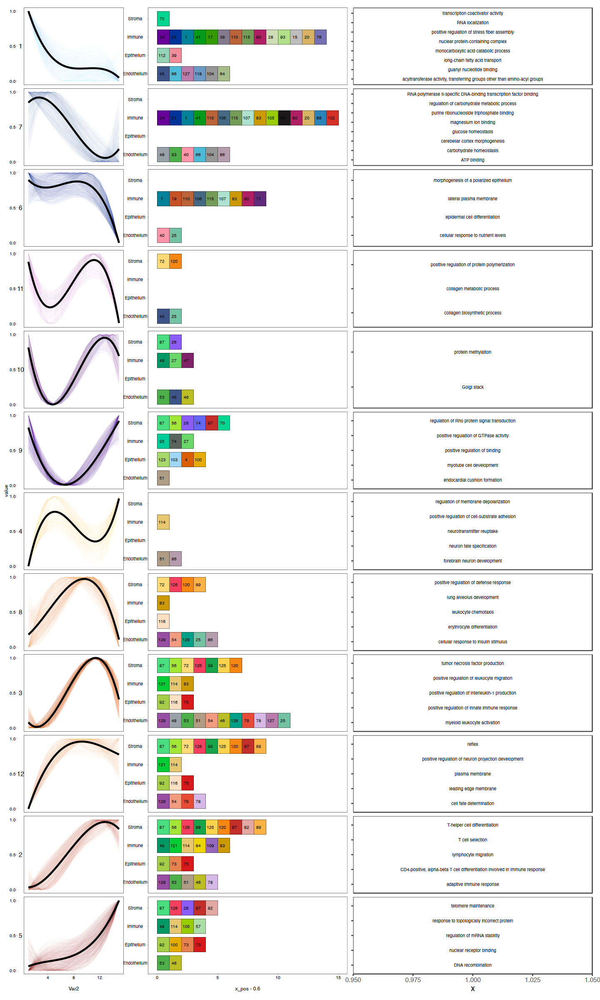

In [743]:
options(repr.plot.width=12, repr.plot.height=20)
( plot_line| relative_cell_plot|relative_GO_plot)  + plot_layout(widths = c(1,2,2.4))

### within_pattern_enrichmentmotif

In [45]:
library(chromVAR)
library(motifmatchr)
library(TFBSTools)

library(BSgenome.Mmusculus.UCSC.mm10)
jaspar <- JASPAR2024::JASPAR2024()
pfm <- getMatrixSet(
  x = jaspar@db,opts = list(collection = "CORE",tax_group='vertebrates' , all_versions = FALSE))
hg38_mm10_TF_mapping = read.table('../hg38_mm10_TF_mapping.txt', sep='\t', header = TRUE)
keep_TF = unique(hg38_mm10_TF_mapping$tf_name)
keep_TF_upper = toupper(keep_TF)

dup_tf = keep_TF_upper[duplicated(keep_TF_upper)]

keep_TF = setdiff(keep_TF,dup_tf)
length(keep_TF)
keep_TF_motifname = c()
for(i in pfm@listData){
    if(i@name %in% keep_TF){
        keep_TF_motifname = c(keep_TF_motifname,i@ID)
    }
}
pfm_filter = pfm[names(pfm)%in%keep_TF_motifname]
pfm_filter

[1] 731

PFMatrixList of length 719
names(719): MA0004.1 MA0069.1 MA0071.1 MA0074.1 ... MA1717.2 MA1721.2 MA1602.2

In [46]:
motif_meta = c()
for(m in pfm_filter@listData){
    motif_meta = rbind(motif_meta, c(m@ID, paste0(m@tags$family,collapse = '::'), m@name))
}
motif_meta = as.data.frame(motif_meta)
colnames(motif_meta) = c('motif', 'family', 'TF')
rownames(motif_meta) = motif_meta$motif

In [770]:
all_enrich_df = c()
for (tmp_mode in new_order) {
    message(tmp_mode)
    #i = names(sig.peak.list)[1]
    peaks = names(cre_label_filter[cre_label_filter==tmp_mode])
    set.seed(1234)
    background_peaks = sample(names(cre_label_filter[cre_label_filter!=tmp_mode]), 1000)
    
    peaks = StringToGRanges(peaks)
    background_peaks = StringToGRanges(background_peaks)
    
    motif_ix <- matchMotifs(pfm_filter, peaks, genome = BSgenome.Mmusculus.UCSC.mm10)
    bg_ix<- matchMotifs(pfm_filter, background_peaks, genome = BSgenome.Mmusculus.UCSC.mm10)

    # calculate enriched Fisher exact test
    enrichment_results <- lapply(seq_len(ncol(assay(motif_ix))), function(i) {
      m1 <- sum(assay(motif_ix)[, i])
      m2 <- sum(assay(bg_ix)[, i])
      n1 <- nrow(assay(motif_ix)) - m1
      n2 <- nrow(assay(bg_ix)) - m2
      test <- fisher.test(matrix(c(m1, n1, m2, n2), nrow = 2))
      list(p.value = test$p.value, odds = test$estimate)
    })
    # extract enrichment results table
    enrich_df <- data.frame(
      motif = names(pfm_filter),
      p.value = sapply(enrichment_results, function(x) x$p.value),
      odds = sapply(enrichment_results, function(x) x$odds)
    )
    enrich_df <- enrich_df[order(enrich_df$p.value), ]
    enrich_df$group=tmp_mode
    all_enrich_df = rbind(all_enrich_df, enrich_df)
}

12

2

5

1

7

6

8

3

10

9

4

11



In [771]:
saveRDS(all_enrich_df, '../pycode/round_cluster02/cCRE/cre_mode_Motif.rds')

In [41]:
all_enrich_df = readRDS('../pycode/round_cluster02/cCRE/cre_mode_Motif.rds')

In [48]:
umap = read.csv(glue('./placeholder_analysis/round_cluster02/merge/cell_meta.csv'))

In [49]:
nmf_umap = read.csv('./placeholder_analysis//round_cluster02/merge/NMF_meta_sample20wcells2.csv')
pseudoObj_peaks <- readRDS(glue('./placeholder_analysis/round_cluster02/round0/pseudoObj_peaks.rds'))
pseudoObj_cells <- readRDS(glue('./placeholder_analysis/round_cluster02/round0/pseudoObj_cells.rds'))

pseudoObj_cells@meta.data[umap$X, colnames(umap)] = umap
pseudoObj_cells@meta.data[,'nCount_ATAC'] = pseudoObj_cells$n_fragment
pseudoObj_cells@meta.data[,'nFeature_ATAC'] = pseudoObj_cells$n_peaks

pseudoObj_cells = subset(pseudoObj_cells, cells=nmf_umap$X)

In [50]:
set.seed(1234)
rand_cells = sample(nmf_umap$X, 10000)

In [51]:
myfragments=list()
for(i in 1:length(Fragments(pseudoObj_cells))){
    x = Fragments(pseudoObj_cells)[[i]]
    x@cells = x@cells[intersect(names(x@cells), rand_cells)]
    myfragments[[i]] = x
}
myfragments = unname(myfragments)

In [33]:
tmp_peak_matrix=FeatureMatrix(fragments = myfragments,
                               cells=rand_cells,
                               features = pseudoObj_peaks@assays$ATAC@ranges)

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions



In [35]:
saveRDS(tmp_peak_matrix,
        './placeholder_analysis//round_cluster02/merge/sample10wcells_peak_matrix.rds')

In [52]:
tmp_peak_matrix = readRDS('./placeholder_analysis//round_cluster02/merge/sample10wcells_peak_matrix.rds')


In [53]:
sample_srt = CreateSeuratObject(counts = CreateChromatinAssay(counts = tmp_peak_matrix,
                                                              annotation = Annotation(pseudoObj_cells),
                                                              fragments = myfragments,
                                                              sep = c("-", "-"),
                                                              min.cells = 0,
                                                              min.features = 0,
                                                              verbose = F), 
                                        assay = "ATAC")

In [54]:
sample_srt

An object of class Seurat 
679511 features across 10000 samples within 1 assay 
Active assay: ATAC (679511 features, 0 variable features)
 2 layers present: counts, data

In [55]:
sample_srt <- AddMotifs(object = sample_srt,
                             genome = BSgenome.Mmusculus.UCSC.mm10,
                             pfm = pfm_filter,verbose = F)

sample_srt = AddChromVARSelf(obj = sample_srt, Species = 'mm10')

Computing GC bias per region

Selecting background regions

Computing deviations from background

Constructing chromVAR assay



In [56]:
nmf_umap2 = nmf_umap
rownames(nmf_umap2) = nmf_umap2$X

In [ ]:
cluster_num = readRDS('./placeholder_analysis/round_cluster02/merge/round4_cluster_num.rds')

In [58]:
sample_srt@meta.data[, c('Time')] = nmf_umap2[colnames(sample_srt),  c('Time')]

In [59]:
myRowScale<-function(m = NULL, min = -2, max = 2, limit = FALSE){
    z <- sweep(m - rowMeans(m), 1, matrixStats::rowSds(m),`/`)
    if(limit){
        z[z > max] <- max
        z[z < min] <- min
    }
    return(z)
}
myAveragePeak <- function(object,groupby, assay=NULL, slot = 'data'){
    if(!is.null(assay)){
        DefaultAssay(object) = assay
    }else{
        assay = DefaultAssay(object)
    }
    Idents(object) = object@meta.data[[groupby]]
    clusters =  unique(Idents(object))
    mat =  GetAssayData(object,assay = assay, slot)
    
    j = 1
    for (i in clusters) {
        #i = clusters[2]
        subBarcode = WhichCells(object = object,idents = i)
        sub_mat = mat[,subBarcode,drop=F] 
        mean.c = rowMeans(sub_mat)
        if(is.numeric(i)){
            Clu = paste0('C',i)
        }else{
            Clu = i
        }
       
        if (j == 1) {
            eval(parse(text = paste0('mean.mat = data.frame(`',Clu,'`= mean.c)')))
        }else{
            mean.mat[,Clu] = mean.c
        }
        j = j+1
    }
    return(mean.mat)
}

In [60]:
meanVar_pseudo = myAveragePeak(sample_srt, 'Time', assay='chromvar', slot='data')
meanVar_pseudo = as.matrix(meanVar_pseudo)
#meanVar_pseudo = myRowScale(meanVar_pseudo, max = 2, min = -2,limit=TRUE)

In [61]:
sig_motif = all_enrich_df %>%
    dplyr::filter(p.value<0.001) %>%
    group_by(group) %>%
    top_n(10, -p.value) %>% 
    as.data.frame()
sig_motif[,c('TF', 'family')] = motif_meta[sig_motif$motif, c('TF', 'family')]


In [ ]:
write.table(sig_motif, '../pycode/round_cluster02/cCRE/cre_mode_Motif_top10_raw.txt', sep='\t', quote = F,
           row.names=F)

In [62]:
table(sig_motif$group)


 1  2  3  4  5  6  7  8  9 10 11 12 
10 10 10 10 10 10 10 10 10 11 10 10 

In [63]:
sig_motif = all_enrich_df %>%
    dplyr::filter(p.value<0.001) %>%
    group_by(group) %>%
    top_n(50, -p.value) %>% 
    as.data.frame()

In [64]:
#sort
# new_order = c(
#     12,2,5, # up
#     1,7,6, # down
#     8,3, # up-down
#     10,9, # down-up 
#     4,11 # wave
# )
sig_motif$group = factor(sig_motif$group, levels = new_order)
sig_motif = sig_motif %>% arrange(group)

In [758]:
# motif_cre_cor =c()
# for(tmp_mode in 1:length(new_order)){
#     message(tmp_mode)
#     tmp_cre = names(cre_label_filter[cre_label_filter==tmp_mode])
#     tmp_glm = expr_smoothed_glm_filter[tmp_cre,]
#     tmp_glm = colMeans(tmp_glm)
#     for(i in unique(umap$Celltype_round4)){
#         tmp_col = paste0(i,':',time_levels)
#         if(length(setdiff(tmp_col, colnames(celltime_mat)))==0){
#             tmp_peaks = celltime_mat[tmp_cre,tmp_col]
#             tmp_peaks = colMeans(tmp_peaks)
#             ct = cor.test(tmp_glm, tmp_peaks)
#             tmp_cor = data.frame(ct$estimate, ct$p.value)
#             tmp_cor$mode=tmp_mode
#             tmp_cor$celltype=i
#             motif_cre_cor = rbind(motif_cre_cor, tmp_cor)
#         }
#     }
# }


In [65]:
meanVar_pseudo[is.na(meanVar_pseudo)] = 0

In [66]:
tmp_var = as.matrix(meanVar_pseudo[sig_motif$motif, time_levels])
tmp_var_glm = t(apply(tmp_var[1:nrow(tmp_var),], 1, function(aa){

    tmp_m = glm("y~poly(x,3)", data=data.frame(x=1:15, y=aa))
    predict(tmp_m)
}))

tmp_var_glm = t(apply(tmp_var_glm, 1, function(x)(x-min(x))/(max(x)-min(x))))

In [68]:
tmp_var_glm2 = tmp_var_glm[sig_motif$motif, time_levels]
motif_cre_cor =c()
motif_cre_cor_top = c()
for(tmp_mode in 1:length(new_order)){
    tmp_cre = names(cre_label_filter[cre_label_filter==tmp_mode])
    tmp_glm = expr_smoothed_glm_filter[tmp_cre,]
    tmp_glm = colMeans(tmp_glm)
    
    tmp_var_mode = tmp_var_glm2[sig_motif$group==tmp_mode, ]
    tmp_cor = apply(tmp_var_mode, 1, function(x)cor(x,tmp_glm))
    tmp_cor_keep = tmp_cor[tmp_cor>0.3]
                    
    motif_cre_cor = rbind(motif_cre_cor, data.frame('motif'=names(tmp_cor_keep),'mode'=tmp_mode))
    motif_cre_cor_top = rbind(motif_cre_cor_top, 
                              data.frame('motif'=names(head(sort(tmp_cor_keep, decreasing = T),10)),
                                         'mode'=tmp_mode))
}

In [763]:
motif_cre_cor_top[,c('TF', 'family')] = motif_meta[motif_cre_cor_top$motif, c('TF', 'family')]
write.table(motif_cre_cor_top, '../pycode/round_cluster02/cCRE/cre_mode_Motif_top10_filter.txt', sep='\t', quote = F,
           row.names=F)

In [69]:
tmp_var_glm2 = tmp_var_glm[sig_motif$motif, time_levels]
motif_cre_cor =c()
motif_cre_cor_top = c()
for(tmp_mode in 1:length(new_order)){
    tmp_cre = names(cre_label_filter[cre_label_filter==tmp_mode])
    tmp_glm = expr_smoothed_glm_filter[tmp_cre,]
    tmp_glm = colMeans(tmp_glm)
    
    tmp_var_mode = tmp_var_glm2[sig_motif$group==tmp_mode, ]
    tmp_cor = apply(tmp_var_mode, 1, function(x)cor(x,tmp_glm))
    tmp_cor_keep = tmp_cor[tmp_cor>0.3]
                    
    motif_cre_cor = rbind(motif_cre_cor, data.frame('motif'=names(tmp_cor_keep),'mode'=tmp_mode))
    motif_cre_cor_top = rbind(motif_cre_cor_top, 
                              data.frame('motif'=names(head(sort(tmp_cor_keep, decreasing = T),3)),
                                         'mode'=tmp_mode))
}

In [70]:
head(cre_label_filter)

chr1-3012479-3012980 chr1-3057426-3057927 chr1-3094833-3095334 
                  12                   10                    8 
chr1-3100134-3100635 chr1-3119836-3120337 chr1-3121246-3121747 
                   2                    8                    2

In [71]:
paletteContinuous(set = "solarExtra", n = 5)

[1] "#3361A5" "#14B3FF" "#C1D5DC" "#FDB31A" "#A31D1D"

In [ ]:
motif_cre_cor$TF = motif_meta[motif_cre_cor$motif,'TF']

In [78]:
label = unique(motif_cre_cor$TF)

In [79]:
#label_pos = na.omit(match(unique_TF,names(ht_cl)))
ra = rowAnnotation(TF = anno_mark(at=1:nrow(motif_cre_cor), labels=motif_cre_cor$TF))

In [85]:
motif_cre_cor_unique = motif_cre_cor[!duplicated(motif_cre_cor$TF),]

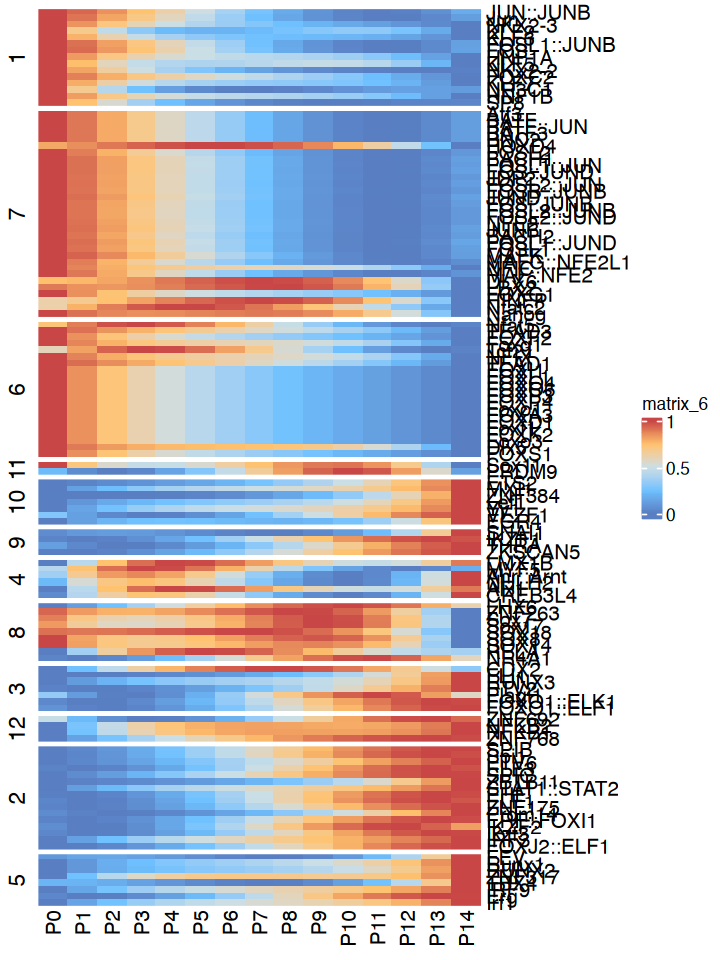

In [86]:
options(repr.plot.width=6, repr.plot.height=8)
solarextra_light <- c("#FFE8CC", "#FFD299", "#FFBB66", "#FFA233", "#FF8800")
cols = circlize::colorRamp2(c(0,0.25,0.5,0.75,1),
                colorspace::lighten(paletteContinuous(set = "solarExtra", n = 5), amount = 0.2))
tmp_var_glm_df = tmp_var_glm[motif_cre_cor_unique$motif, time_levels]
rownames(tmp_var_glm_df) = motif_cre_cor_unique$TF
ht = Heatmap(tmp_var_glm_df,
        col=cols,
        cluster_columns = F,cluster_rows = F,
        show_column_names = T, show_row_names = T,
        #right_annotation=ra,
             row_split = factor(motif_cre_cor_unique$mode, new_order),
        use_raster = T)
ht

In [87]:
pdf(glue('{output_dir}/CREchange pattern enrichedmotifheatmap.pdf'), width=4, height=9)
draw(ht)
dev.off()

agg_record_555645542 
                   2

In [768]:
sig_motif = all_enrich_df %>%
    dplyr::filter(p.value<0.001) %>%
    group_by(group) %>%
    top_n(1, -p.value) %>% as.data.frame()

In [769]:
sig_motif

motif,p.value,odds,group
<chr>,<dbl>,<dbl>,<dbl>
MA0613.1,5.380967e-24,0.2487884,12
MA1132.2,2.086189e-33,0.2397535,2
MA2124.1,6.044570e-14,0.4549611,5
MA1132.2,6.301300e-14,2.7460496,1
MA1988.2,2.325303e-23,2.3455049,7
MA1634.2,2.325303e-23,2.3455049,7
MA0462.3,2.325303e-23,2.3455049,7
MA0835.3,2.325303e-23,2.3455049,7
MA1928.2,2.325303e-23,2.3455049,7


In [770]:
relative_Motif_plot = list()
for(i in new_order){
    
    #tmp_motif = universalmotif::convert_motifs(pfm_filter[[sig_motif[i,'motif']]])
    tmp_motif_modes = motif_cre_cor_top[motif_cre_cor_top$mode==i, 'motif']
    xx_a = list()
    xx_b = list()
    for(j in tmp_motif_modes){
       tmp_motif = universalmotif::convert_motifs(pfm_filter[[j]])
       a = ggseqlogo::ggseqlogo(tmp_motif@motif)+NoAxes()+
        theme(panel.border = element_rect(fill=NA,color='black', size=0.5))
        xx_a[[j]] = a
        ann_text = data.frame(x=1,y=1, motif=tmp_motif@name, log2p=round(-log2(sig_motif[i,'p.value'])),2)
        b = ggplot(ann_text,aes(x=x,y=x, label=motif))+
            geom_text()+
            theme_minimal()+
            NoAxes()+
            theme(panel.grid = element_blank(),
                  panel.border = element_rect(fill=NA,color='black', size=0.5))
        xx_b[[j]] = b
    }
    a = cowplot::plot_grid(plotlist = xx_a, ncol=1)
    b = cowplot::plot_grid(plotlist = xx_b, ncol=1)
    
    #ann_text = data.frame(x=1,y=1, motif=tmp_motif@name, log2p=round(-log2(sig_motif[i,'p.value'])),2)

   #c = ggplot(ann_text,aes(x=x,y=x, label=log2p))+
   #    geom_text()+
   #    geom_text()+
   #    theme_minimal()+
   #    NoAxes()+
   #    theme(panel.grid = element_blank(),
   #          panel.border = element_rect(fill=NA,color='black', size=0.5))
   #
    relative_Motif_plot[[i]] = a|b#|c
}

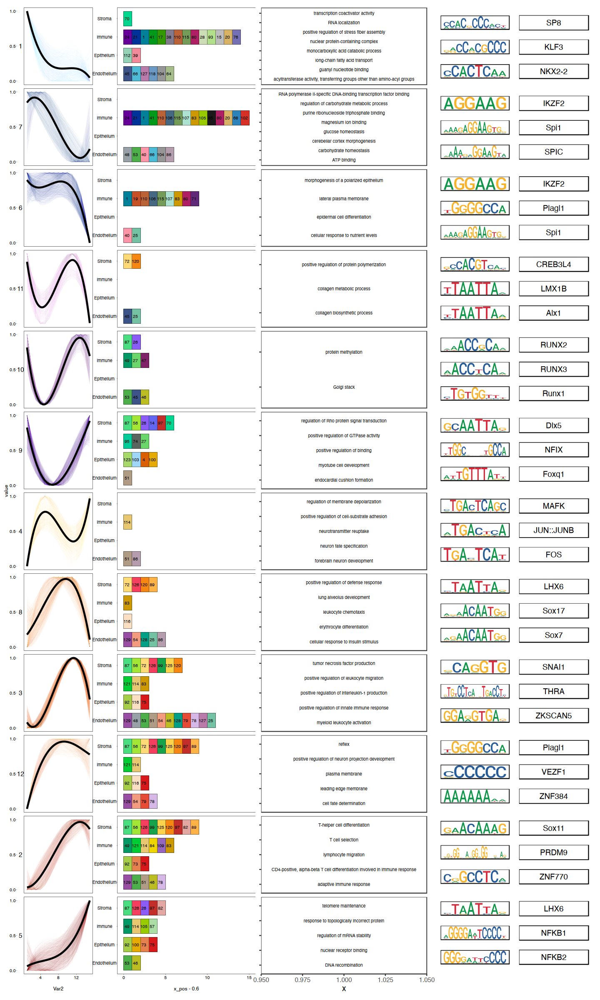

In [771]:
options(repr.plot.width=12, repr.plot.height=20)
relative_Motif_plot2 = cowplot::plot_grid(plotlist = relative_Motif_plot, ncol=1)
( plot_line| relative_cell_plot|relative_GO_plot|relative_Motif_plot2)  + 
    plot_layout(widths = c(1,2,2.4,2.4))

### merge display

In [772]:
options(repr.plot.width=12, repr.plot.height=20)
relative_Motif_plot2 = cowplot::plot_grid(plotlist = relative_Motif_plot, ncol=1)
a = ( plot_line| relative_cell_plot|relative_GO_plot|relative_Motif_plot2)  + 
    plot_layout(widths = c(1,2,2.4,2.4))

In [773]:
ggsave(glue('{output_dir}/CREchange pattern comprehensive.pdf'),a,
       width=12, height=16, units='in')

# CRE causality

In [21]:
cell_prop_rds = readRDS('../out_data/cell_prop_time_mat.rds')

In [22]:
cell_prop_smooth = cell_prop_rds$smooth[cell_prop_rds$cell_order,]
cell_prop_raw = cell_prop_rds$raw[cell_prop_rds$cell_order,]

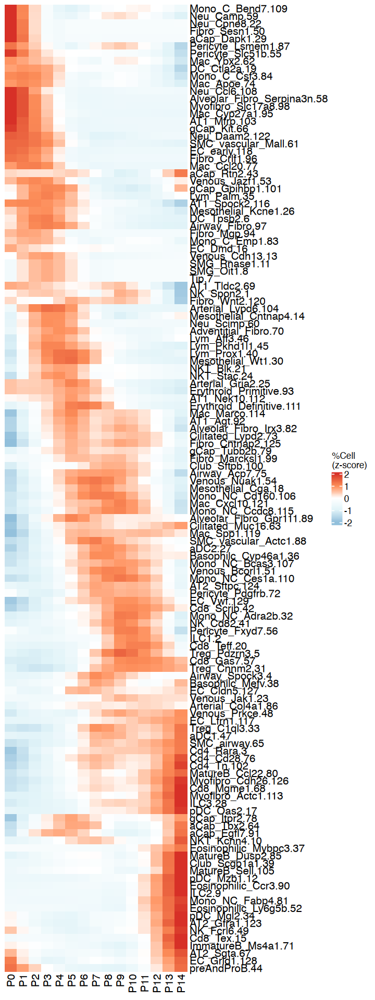

In [23]:
options(repr.plot.width=6, repr.plot.height=16)

ht = Heatmap(cell_prop_smooth,#[get_order(o,1),],
             cluster_rows=F, 
             cluster_columns=F,
             show_row_names=T,
             show_column_dend=F,
             show_row_dend = F,
             col=circlize::colorRamp2(c(-2,-1,0,1,2), c( "#91BFDB","#E0F3F8", "#FFFFFF", "#FC8D59", "#D73027")),
             heatmap_legend_param=list('title'='%Cell\n(z-score)')
             #column_names_rot=0 
)
ht

In [33]:
CRE_num = t(readRDS('../out_data/cell_CREnum_time_mat.rds'))[cell_prop_rds$cell_order, time_levels]

In [34]:
CRE_num_scale = t(apply(CRE_num,1,scale))
colnames(CRE_num_scale) = colnames(CRE_num)

predict_seq = seq(1,15,1)
CRE_num_smooth = t(apply(CRE_num_scale, 1, function(x){
    tmp_lm = loess(formula = y~x, data=data.frame(x=1:15,y=x))
    predict(tmp_lm, predict_seq)
}))
colnames(CRE_num_smooth) = colnames(CRE_num)

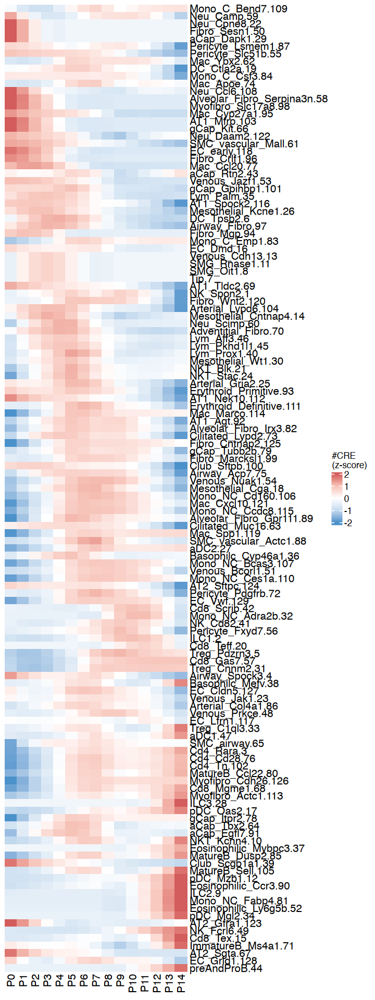

In [35]:
options(repr.plot.width=6, repr.plot.height=16)

ht2 = Heatmap(CRE_num_smooth,#[get_order(o,1),],
             cluster_rows=F, 
             cluster_columns=F,
             show_row_names=T,
             show_column_dend=F,
             show_row_dend = F,
             col=circlize::colorRamp2(c(-2,-1,0,1,2), c("#4b92cb", "#c7dcef", "#ffffff", "#f6c2b7", "#d35c5c")),
             heatmap_legend_param=list('title'='#CRE\n(z-score)')
             #column_names_rot=0 
)
ht2

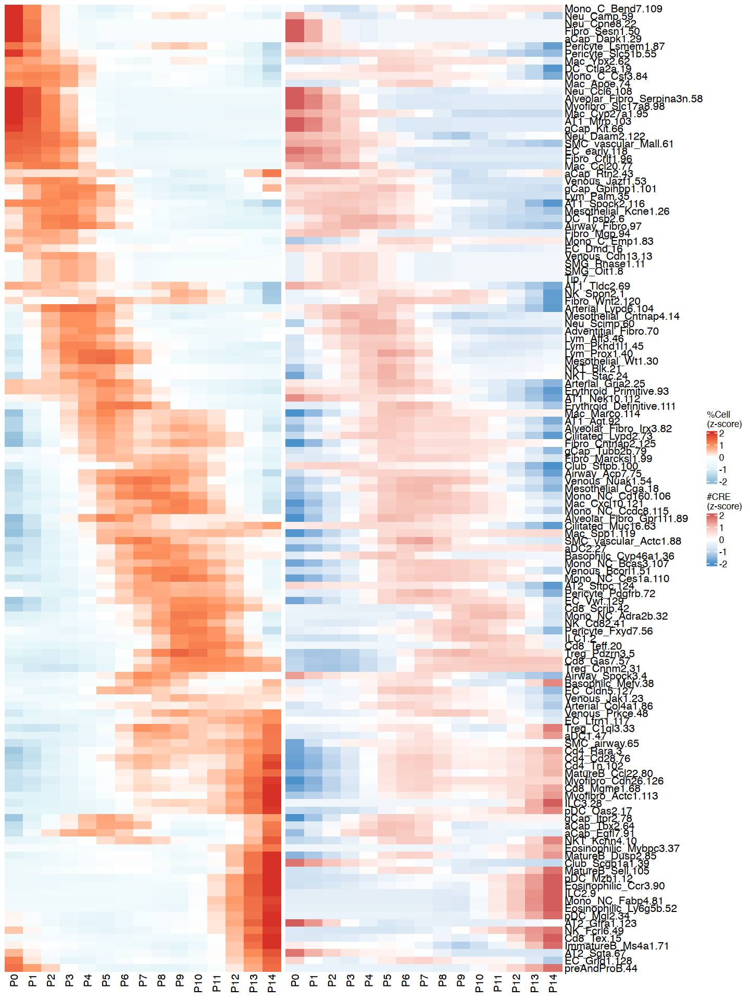

In [36]:
options(repr.plot.width=12, repr.plot.height=16)
draw(ht+ht2)

In [37]:
pdf(glue('{output_dir}/cell_proportion_andCREcount_heatmap.pdf'), width = 10,height = 16)
draw(ht+ht2)
dev.off()

agg_record_200944821 
                   2

## CREcount_time_correlation

In [447]:
CRE_index = c()

CRE_index = cbind(CRE_index, apply(CRE_num_smooth, 1, function(x)cor(x, 1:15)))

colnames(CRE_index) = 'cor_with_time'
CRE_index = as.data.frame(CRE_index)

## CREcount_proportion_correlation

In [450]:
CRE_index$cor_with_prop = sapply(1:nrow(CRE_num_smooth), function(x){
    cor(CRE_num_smooth[x,], cell_prop_smooth[x,])
})

In [458]:
ct = cor.test(CRE_num_smooth[1,], cell_prop_smooth[1,])

In [460]:
ct$estimate

cor 
-0.3225115

In [561]:
CRE_Cell_cor = t(sapply(1:nrow(CRE_num_smooth), function(x){
    ct = cor.test(CRE_num_smooth[x,], cell_prop_smooth[x,])
    return(c(ct$p.value, ct$estimate))
}))
colnames(CRE_Cell_cor) = c('pvalue', 'cor')
CRE_Cell_cor = as.data.frame(CRE_Cell_cor)
#CRE_Cell_cor$pvalue = p.adjust(CRE_Cell_cor$pvalue)
CRE_Cell_cor$group = CRE_Cell_cor$pvalue < 0.05
CRE_Cell_cor$celltype = rownames(cell_prop_smooth)

In [563]:
CRE_Cell_cor$pvalue[CRE_Cell_cor$pvalue==0] = min(CRE_Cell_cor$pvalue[CRE_Cell_cor$pvalue!=0])

In [617]:
scale_ix = 10
bound = max(-log10(CRE_Cell_cor$pvalue))/scale_ix+1

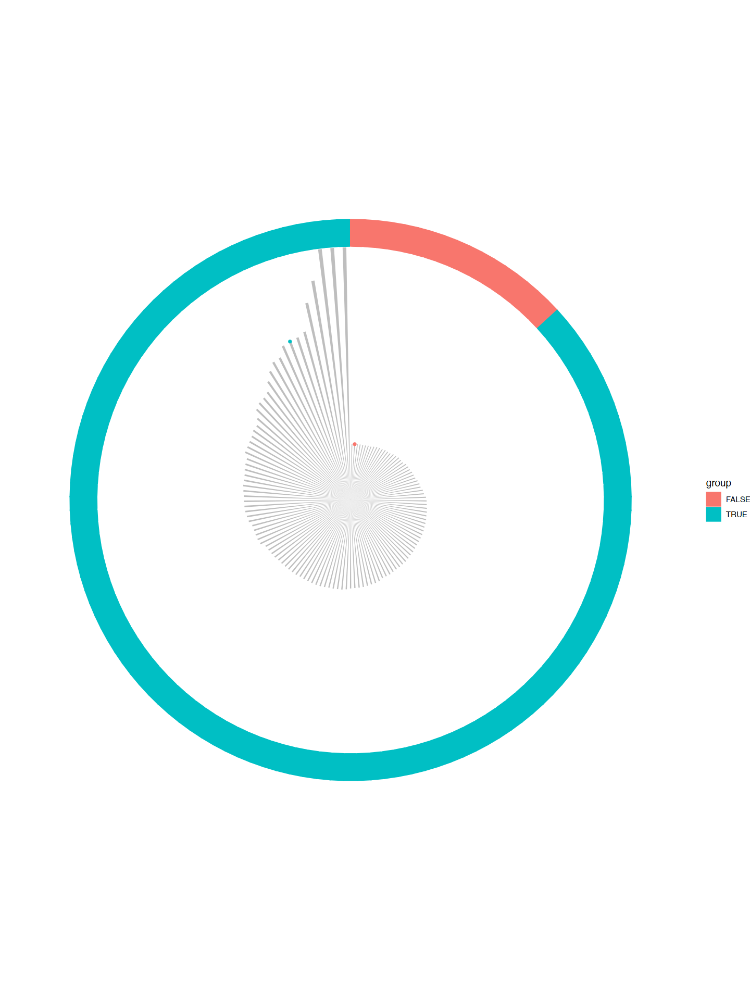

In [631]:
a = CRE_Cell_cor %>%
    mutate(celltype=fct_reorder(celltype, -log10(pvalue))) %>%
    ggplot()+
    geom_col(aes(x=celltype, y=bound+5/scale_ix, fill=group,color=group), width=1)+ # outer circle
    geom_col(aes(x=celltype, y=bound), fill='white', color='white',width=1)+ # outer circle white
    geom_col(aes(x=celltype, y=-log10(pvalue)/scale_ix+1),width=0.3, fill='gray')+ # inner circlebar
    geom_point(aes(x=celltype, y=-log10(pvalue)/scale_ix+1,color=group), size=1 ,
                   data=CRE_Cell_cor %>% filter(celltype%in%c('AT1_Mfrp.103', 'AT2_Gfra1.123')))+ # inner circle points
    #geom_hline(yintercept = bound, size=0.1)+ # inner circle lines
    #scale_size_continuous(range=c(0.1,1))+
    #scale_color_gradientn(colors = c('blue', 'white', 'red'))+
    coord_polar("x", start=0)+
    theme_void()
a

In [632]:
ggsave(glue('{output_dir}/cell_proportion_CREcount_correlation_pie_chart.pdf'),a,
       width=80, height=80, units='mm')

In [625]:
table(CRE_Cell_cor$group) / nrow(CRE_Cell_cor)


    FALSE      TRUE 
0.1317829 0.8682171 

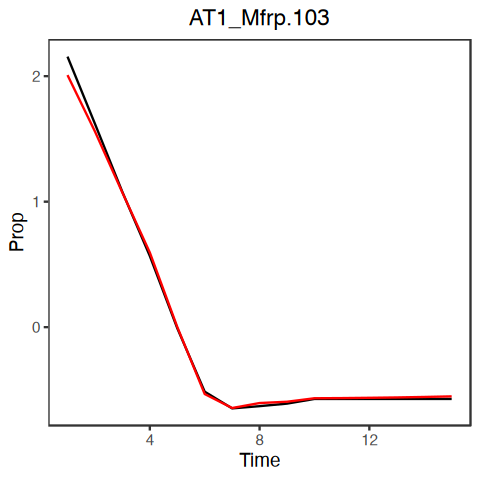

In [645]:
options(repr.plot.width=4, repr.plot.height=4)
ts_data = data.frame(x=CRE_num_smooth['AT1_Mfrp.103',], y=cell_prop_smooth['AT1_Mfrp.103',])

a = ggplot(ts_data,aes(x=1:15))+
    geom_line(aes(y=x))+
    geom_line(aes(y=y),color='red')+
    labs(title='AT1_Mfrp.103', x='Time', 'y'='Prop')+
    theme_bw()+
    theme(plot.title=element_text(hjust=0.5),
         panel.grid=element_blank())
a

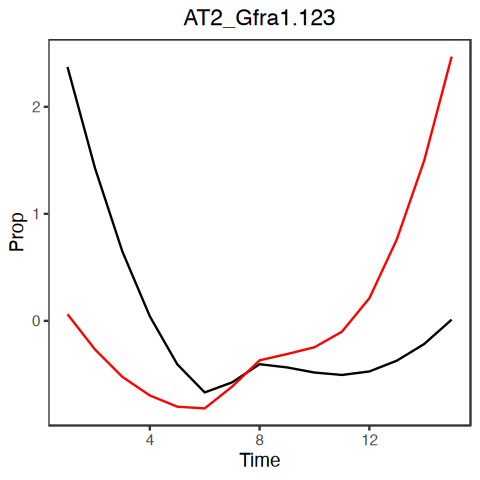

In [646]:
options(repr.plot.width=4, repr.plot.height=4)
ts_data = data.frame(x=CRE_num_smooth['AT2_Gfra1.123',], y=cell_prop_smooth['AT2_Gfra1.123',])

b = ggplot(ts_data,aes(x=1:15))+
    geom_line(aes(y=x))+
    geom_line(aes(y=y),color='red')+
    labs(title='AT2_Gfra1.123', x='Time', 'y'='Prop')+
    theme_bw()+
    theme(plot.title=element_text(hjust=0.5),
         panel.grid=element_blank())
b

In [647]:
ggsave(glue('{output_dir}/cell_proportion_CREcount_correlation_line_plot(specific epithelium).pdf'),a|b,
       width=80, height=50, units='mm')

## CREcount_proportion_causality

In [853]:
library(lmtest)
library(vars)

In [914]:
CRE_index = CRE_index[rownames(CRE_num_smooth),]
CRE_index[, c('CRE_causal_Prop', 'Prop_causal_CRE')] = 1
for(ix in 1:nrow(CRE_num_smooth)){
    ts_data = data.frame(x=CRE_num_smooth[ix,], y=cell_prop_smooth[ix,])


    lagselect = VARselect(ts_data, lag.max=5)
    lagselect = lagselect$criteria['AIC(n)',]
    lagselect = na.omit(lagselect)
    lagselect = lagselect[!is.infinite(lagselect)]

    best_p = as.numeric(names(lagselect)[which.min(lagselect)])

    var_model = VAR(ts_data, p=1, type='const')

    CRE_causal_Prop = causality(var_model, cause='x')
    Prop_causal_CRE = causality(var_model, cause='y')

    a=CRE_causal_Prop$Granger$p.value
    b=Prop_causal_CRE$Granger$p.value
    CRE_index[ix, c('CRE_causal_Prop', 'Prop_causal_CRE')] = c(a,b)
    
}

In [927]:
CRE_index = CRE_index[cell_prop_rds$cell_order, ]
CRE_index$celltype = factor(rownames(CRE_index), rev(cell_prop_rds$cell_order))

In [974]:
tmp_df1 = melt(CRE_index[, c('celltype', 'cor_with_time', 'cor_with_prop')])
a=tmp_df1 %>%
    ggplot(aes(x=value,y=celltype))+
    geom_bar(stat='identity',width=0.8, fill='gray', color='black', size=0.1)+
    facet_wrap(~variable, nrow=1)+
    theme_bw()+
    theme(panel.grid = element_blank(),
          strip.background=element_blank())

Using celltype as id variables



In [975]:
tmp_df2 = melt(CRE_index[, c('celltype', 'CRE_causal_Prop', 'Prop_causal_CRE')])
b=tmp_df2 %>%
    #filter(value<0.001) %>%
    mutate(celltype= factor(celltype,rev(cell_prop_rds$cell_order))) %>%
    ggplot(aes(x=variable,y=celltype,size=-log10(value),fill=-log10(value)))+
    geom_point(shape=22)+
    scale_size_continuous(range = c(0,4),limits = c(3,15))+
    scale_fill_gradientn(colors = c('yellow', 'red'))+
    theme_bw()+
    theme(panel.grid = element_blank(),
          strip.background=element_blank(),
         axis.title.y=element_blank(),
         axis.text.y=element_blank())

Using celltype as id variables



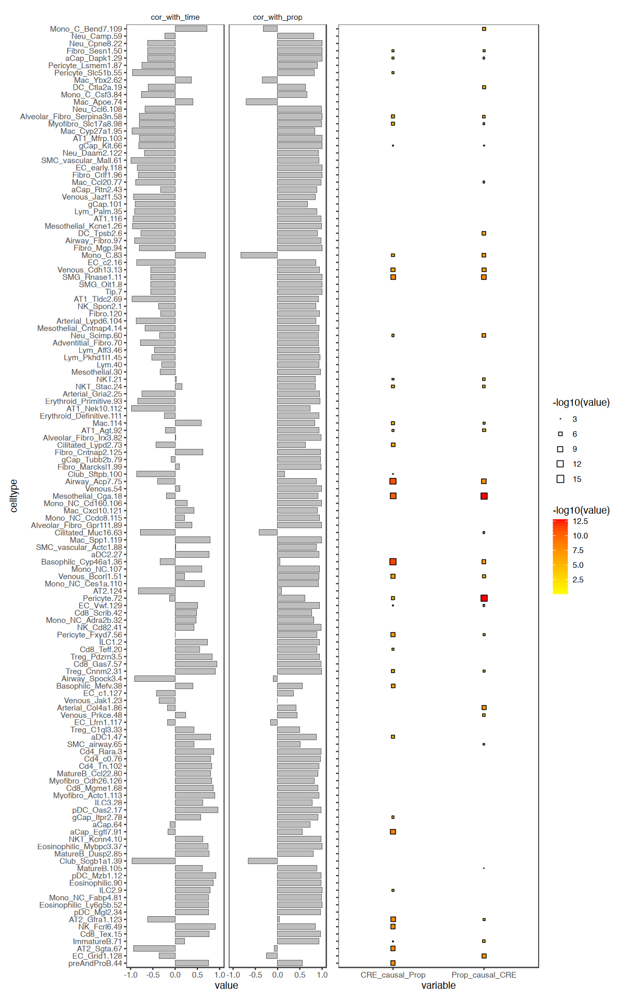

In [976]:
options(repr.plot.width=12, repr.plot.height=16)
a|b

In [977]:
ggsave(glue('{output_dir}/cell_proportion_CREcount_time_correlation.pdf'),a|b,
       width=10, height=16, units='in')

In [981]:
all_prop_cre_df = cbind(melt(CRE_num_smooth),melt(cell_prop_smooth))
colnames(all_prop_cre_df) = c('celltype', 'Time', 'CRE', 'celltype2', 'Time2','Prop')

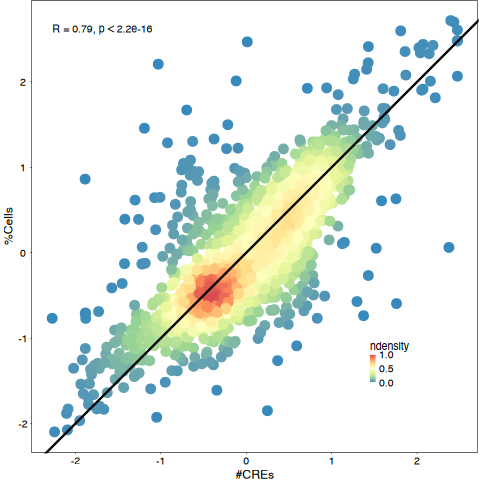

In [989]:
options(repr.plot.width=4, repr.plot.height=4)
a=all_prop_cre_df %>%
    ggplot(aes(x=CRE, y=Prop))+
    ggpointdensity::geom_pointdensity(aes(color=..ndensity..), size=2,method.args=list(n=1000))+
    geom_abline(slope = 1, intercept = 0)+
    theme_classic()+
    scale_color_distiller(palette = "Spectral", direction = -1, breaks=c(0.0,0.5,1), limits=c(0,1))+
    stat_cor(size=label_size(6))+
    labs(x='#CREs',y='%Cells')+
    mytheme+
    coord_equal()+
    theme(legend.position=c(0.8,0.2),
          legend.key.width = unit(1.2, "mm"),  # Legend color bar width
            legend.key.height = unit(1.2, "mm"),    # Legend color bar height
         )
a
ggsave(glue('{output_dir}/cell_proportion_CREcount_overall correlation.pdf'),a,
       width=80, height=80, units='mm')